In [1]:
import tensorflow as tf
from tensorflow import keras 
from tensorflow.keras import layers
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import glob
import os

2022-10-09 19:26:17.868852: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-10-09 19:26:17.973021: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2022-10-09 19:26:17.977673: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2022-10-09 19:26:17.977685: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if yo

## 数据集

In [2]:
(train_images, train_labels), (_, _) = tf.keras.datasets.mnist.load_data()

train_images = train_images.astype('float32')
train_images = (train_images - 127.5)/127.5 

BATCH_SIZE = 256
BUFFER_SIZE = 60000

datasets = tf.data.Dataset.from_tensor_slices(train_images)
datasets = datasets.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

2022-10-09 19:26:19.914608: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory
2022-10-09 19:26:19.914643: W tensorflow/stream_executor/cuda/cuda_driver.cc:263] failed call to cuInit: UNKNOWN ERROR (303)
2022-10-09 19:26:19.914659: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (cjj-07): /proc/driver/nvidia/version does not exist
2022-10-09 19:26:19.914936: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
train_images_0 = np.zeros((5923, 28, 28))
train_images_1 = np.zeros((6742, 28, 28))
train_images_2 = np.zeros((5958, 28, 28))
train_images_3 = np.zeros((6131, 28, 28))
train_images_4 = np.zeros((5842, 28, 28))
train_images_5 = np.zeros((5421, 28, 28))
train_images_6 = np.zeros((5918, 28, 28))
train_images_7 = np.zeros((6265, 28, 28))
train_images_8 = np.zeros((5851, 28, 28))
train_images_9 = np.zeros((5949, 28, 28))
j_0 = 0
j_1 = 0
j_2 = 0
j_3 = 0
j_4 = 0
j_5 = 0
j_6 = 0
j_7 = 0
j_8 = 0
j_9 = 0
for i in range(60000):
    if train_labels[i]==0:
        train_images_0[j_0] = train_images[i]
        j_0+=1
    if train_labels[i]==1:
        train_images_1[j_1] = train_images[i]
        j_1+=1
    if train_labels[i]==2:
        train_images_2[j_2] = train_images[i]
        j_2+=1
    if train_labels[i]==3:
        train_images_3[j_3] = train_images[i]
        j_3+=1
    if train_labels[i]==4:
        train_images_4[j_4] = train_images[i]
        j_4+=1
    if train_labels[i]==5:
        train_images_5[j_5] = train_images[i]
        j_5+=1
    if train_labels[i]==6:
        train_images_6[j_6] = train_images[i]
        j_6+=1
    if train_labels[i]==7:
        train_images_7[j_7] = train_images[i]
        j_7+=1
    if train_labels[i]==8:
        train_images_8[j_8] = train_images[i]
        j_8+=1
    if train_labels[i]==9:
        train_images_9[j_9] = train_images[i]
        j_9+=1

In [4]:
train_images_0 = train_images_0[0:5888]
datasets_0 = tf.data.Dataset.from_tensor_slices(train_images_0)
datasets_0 = datasets_0.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## 超参数

In [5]:
epochs = 200
noise_dim = 100
generate_show_num = 16

generator_optimizer = tf.keras.optimizers.Adam(3e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(3e-4)

seed = tf.random.normal([generate_show_num, noise_dim])

## 生成器

In [6]:
def generator_model():
    model = keras.Sequential()
    model.add(layers.Dense(256, input_shape=(noise_dim,), use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Dense(512, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Dense(28*28*1, use_bias=False, activation='tanh'))
    model.add(layers.BatchNormalization())
    
    model.add(layers.Reshape((28, 28, 1)))
    
    return model

## 检测器

In [7]:
def discriminator_model():
    model = keras.Sequential()
    model.add(layers.Flatten())
    
    model.add(layers.Dense(512, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Dense(256, use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    model.add(layers.Dense(1))
#     model.add(layers.Dense(2, activation='softmax'))
    
    return model

In [8]:
generator = generator_model()
discriminator = discriminator_model()

## 损失函数

In [9]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(
    from_logits=True,
)

In [10]:
def generator_loss(fake_output):
    '''这里想要判别器输出错误，这样才对'''
    gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output) 
    return gen_loss

def discriminator_real_loss(real_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    return real_loss 

def discriminator_fake_loss(fake_output):
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    return fake_loss

## 训练

In [11]:
def train_steps(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        real_output = discriminator(images, training=True)   
        gen_image = generator(noise, training=True)
        fake_output = discriminator(gen_image, training=True)
        
        gen_loss = generator_loss(fake_output)
        disc_real_loss = discriminator_real_loss(real_output)
        disc_fake_loss = discriminator_fake_loss(fake_output)
        disc_loss = disc_real_loss + disc_fake_loss
            
            
    gradient_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradient_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    
    generator_optimizer.apply_gradients(zip(gradient_gen, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradient_disc, discriminator.trainable_variables))
    
    print('real_output:', real_output[0:5])
    print('fake_output:', fake_output[0:5])
    print('gen_loss:', gen_loss)
    print('disc_real_loss:', disc_real_loss)
    print('disc_fake_loss:', disc_fake_loss)

In [12]:
def generate_show(generator, show_noise):
    gen_image_show = generator(show_noise, training=False)
    
    fig = plt.figure(figsize=(4, 4))
    for i in range(gen_image_show.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((gen_image_show[i, :, :, 0] + 1)/2, cmap='gray')
        plt.axis('off')  #不显示坐标轴
        
    plt.show()

In [13]:
def train(datasets, epochs):
    for epoch in range(epochs):
        print(epoch)
        for image_batch in datasets:
            train_steps(image_batch)    
        generate_show(generator, seed)

0
real_output: tf.Tensor(
[[ 0.39616665]
 [-1.8217415 ]
 [-3.0248218 ]
 [-3.1368096 ]
 [-6.807338  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.5881944]
 [-2.3993478]
 [-4.0241885]
 [-2.8465176]
 [-5.3417935]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2222123, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(4.46249, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.122960016, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-4.3038554]
 [-1.7349578]
 [-6.976036 ]
 [-3.2312517]
 [-2.5433125]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3746198]
 [-4.4222198]
 [-1.5576801]
 [-2.811223 ]
 [-4.4020586]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3917704, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(4.270506, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1096655, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-1.7618604]
 [-6.9931254]
 [-4.6823025]
 [-3.8686647]
 [-1.004414 ]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[3.4832184]
 [3.467239 ]
 [0.3666107]
 [6.779655 ]
 [3.5045102]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0471783 ]
 [-0.8537346 ]
 [ 0.83130234]
 [ 0.71279335]
 [-1.4664729 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4973593, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14294177, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2912145, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7782938]
 [1.5173374]
 [0.605862 ]
 [3.5026386]
 [0.207642 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.3258343 ]
 [-0.07258923]
 [ 2.37854   ]
 [-4.6530986 ]
 [-1.7720745 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5882554, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2019673, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24187827, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.065938 ]
 [1.6422518]
 [2.0648253]
 [3.4490743]
 [3.3243673]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

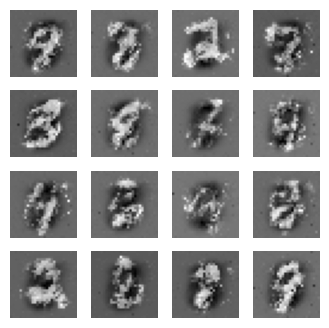

1
real_output: tf.Tensor(
[[4.4504094]
 [4.1124196]
 [3.4015315]
 [5.26725  ]
 [3.8956265]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.700151  ]
 [-1.658913  ]
 [-3.4804454 ]
 [-0.27232423]
 [-3.0181427 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7078974, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14401099, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20952097, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.2370653]
 [4.9026937]
 [5.2707844]
 [3.5726337]
 [2.4693365]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6612235 ]
 [-4.894743  ]
 [-0.36302915]
 [-0.24145195]
 [-2.0525467 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8935592, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13485283, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25138432, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2996316 ]
 [3.5644553 ]
 [0.90543526]
 [3.5364504 ]
 [2.2229536 ]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[3.265308 ]
 [0.9927854]
 [4.1984363]
 [4.6570225]
 [1.7975608]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1996422]
 [-1.0374088]
 [-2.062561 ]
 [-3.6775603]
 [-3.5238042]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9017272, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11377466, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15278101, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.8583612 ]
 [ 6.052835  ]
 [ 3.7121348 ]
 [-0.69020313]
 [ 2.343209  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6650572]
 [-2.9144063]
 [-3.2929869]
 [-2.1696556]
 [-1.2053962]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0147796, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.072182596, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12646915, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.6117787 ]
 [ 4.975155  ]
 [ 5.4679585 ]
 [ 3.024815  ]
 [-0.23165515]], shape=(5, 1), dtype=float32)
fake_

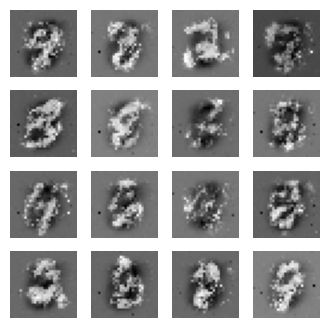

2
real_output: tf.Tensor(
[[5.3738966]
 [2.2826052]
 [4.777526 ]
 [2.817235 ]
 [3.0127716]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9181485]
 [-2.781692 ]
 [-2.527617 ]
 [-2.4138904]
 [-2.0293174]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8014524, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06553671, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15993503, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1877973]
 [3.6355612]
 [2.545655 ]
 [4.311891 ]
 [4.302996 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8179786]
 [-3.4408243]
 [-4.5599113]
 [-1.6514373]
 [-2.8076122]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9954321, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10560788, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15626676, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.553883 ]
 [1.6555523]
 [3.5360212]
 [3.8845532]
 [3.8907828]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[1.8775742 ]
 [2.2259755 ]
 [2.2185564 ]
 [0.21796846]
 [3.9351978 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.124703 ]
 [-1.8484706]
 [-1.368237 ]
 [-3.0006187]
 [-4.051544 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.715403, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.106237754, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14749767, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0063357]
 [4.3860784]
 [3.8854952]
 [1.9275142]
 [3.217554 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5004873]
 [-4.0025845]
 [-3.562047 ]
 [-6.29376  ]
 [-1.9371892]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9074197, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1191742, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12473255, shape=(), dtype=float32)


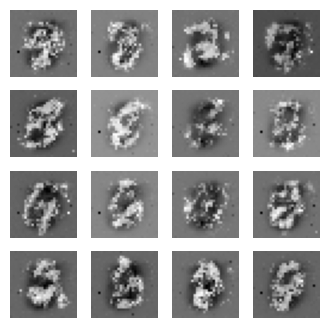

3
real_output: tf.Tensor(
[[4.926694 ]
 [1.7126038]
 [2.8218417]
 [4.0848827]
 [3.4098878]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5146977]
 [-4.7824264]
 [-5.40809  ]
 [-1.4951609]
 [-3.8867779]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.917837, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09433404, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15929313, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7713118]
 [3.8118482]
 [0.6983904]
 [3.105342 ]
 [2.5264492]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9978004]
 [-2.7028089]
 [-1.0660695]
 [-2.7648556]
 [-2.100948 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0592113, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0862726, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12757564, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.429231 ]
 [2.1473172]
 [1.9842885]
 [1.9359068]
 [4.701577 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[

real_output: tf.Tensor(
[[4.076871 ]
 [2.843795 ]
 [1.0747398]
 [3.4373085]
 [5.322962 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.758641  ]
 [ 2.1877344 ]
 [-0.44558352]
 [-4.132418  ]
 [-1.2824465 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7658916, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11046812, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17777604, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8960335 ]
 [0.49505782]
 [4.4005675 ]
 [0.76100063]
 [3.7296956 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5527754 ]
 [-2.6090388 ]
 [ 2.0405862 ]
 [-0.83802485]
 [-3.3725588 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0087116, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1162933, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15109941, shape=(), dtype=float32)


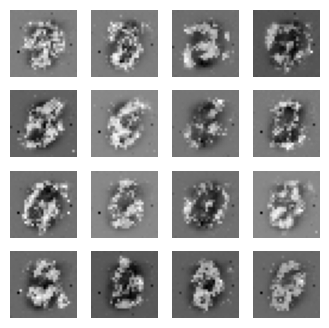

4
real_output: tf.Tensor(
[[2.2713323]
 [4.358607 ]
 [4.0053744]
 [4.552997 ]
 [2.19854  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.870954 ]
 [-2.5887723]
 [-4.4239125]
 [-2.6362913]
 [-2.3571603]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.248084, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09997165, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08729483, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.721878 ]
 [3.0602214]
 [1.5568767]
 [3.938179 ]
 [1.9309433]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6029341]
 [-2.98646  ]
 [-8.472553 ]
 [-2.351862 ]
 [-3.064777 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8099308, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10767009, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14169689, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9650804]
 [3.5218966]
 [4.440577 ]
 [2.160609 ]
 [2.9845407]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[

real_output: tf.Tensor(
[[4.849541 ]
 [3.5565841]
 [3.6337025]
 [4.254341 ]
 [2.5085325]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0577936 ]
 [-0.90333796]
 [-2.5345526 ]
 [ 0.37716287]
 [-4.17564   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9100952, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.119557634, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14566539, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.0981882 ]
 [ 2.6802123 ]
 [ 3.247042  ]
 [ 1.4653889 ]
 [-0.20059994]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6069531]
 [-5.231108 ]
 [-2.429879 ]
 [-2.48678  ]
 [-3.714722 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.779644, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10805422, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15770201, shape=(), dtype=float32)


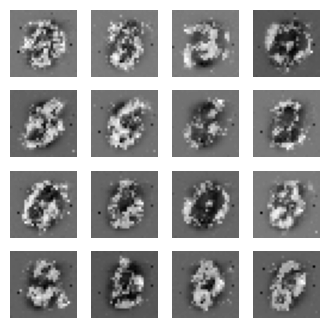

5
real_output: tf.Tensor(
[[3.1014802]
 [3.39959  ]
 [3.3881662]
 [3.8973374]
 [3.2583046]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8476303]
 [-0.4464438]
 [-2.2470615]
 [-4.582374 ]
 [-4.1341968]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8019085, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.102471724, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13425437, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3111882]
 [3.6993682]
 [3.6696386]
 [2.6506886]
 [4.6140103]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4780526]
 [-1.0735605]
 [-5.4959116]
 [-6.054443 ]
 [-3.45509  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9363446, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10408719, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13224106, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4679384]
 [1.8486586]
 [5.126241 ]
 [3.5422711]
 [3.5723572]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[4.859327 ]
 [1.9933046]
 [1.6434748]
 [3.5429466]
 [3.202752 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4973664 ]
 [-2.9338207 ]
 [-0.66700095]
 [-1.4656454 ]
 [-1.7035054 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8440318, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1318511, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14234835, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7096438]
 [3.475491 ]
 [2.7883868]
 [2.30231  ]
 [3.6530833]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.119273 ]
 [-4.15217  ]
 [-2.6569734]
 [-3.33077  ]
 [-3.2347941]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0144298, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11772296, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10418679, shape=(), dtype=float32)


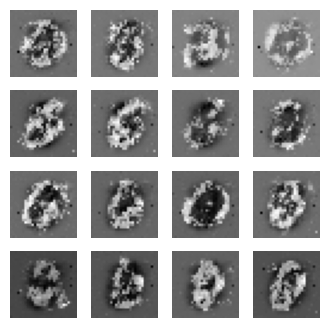

6
real_output: tf.Tensor(
[[1.2582815]
 [1.7471381]
 [3.145179 ]
 [2.3200538]
 [3.1976435]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.2030387]
 [-1.6798954]
 [-3.566898 ]
 [-1.9195918]
 [-3.0344038]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8693438, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.106087744, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12541959, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.114851 ]
 [1.0898522]
 [2.8082757]
 [1.9272112]
 [3.464777 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3412442]
 [-1.9489082]
 [-1.4883746]
 [-2.5817466]
 [-0.9718443]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7922544, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11415327, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1794272, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3561442]
 [1.1942387]
 [2.249236 ]
 [3.8305752]
 [1.932436 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[2.395055 ]
 [3.2570329]
 [5.049996 ]
 [3.957955 ]
 [2.9083328]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8454704]
 [-5.8991103]
 [-2.9837453]
 [-3.2580009]
 [-2.141748 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8214698, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.121037915, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13135515, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5435262]
 [3.9336464]
 [1.2367063]
 [4.765524 ]
 [3.596075 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5377789 ]
 [-0.99913365]
 [-3.086526  ]
 [-3.431785  ]
 [-3.2469108 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9284976, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10915747, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14169842, shape=(), dtype=float32)


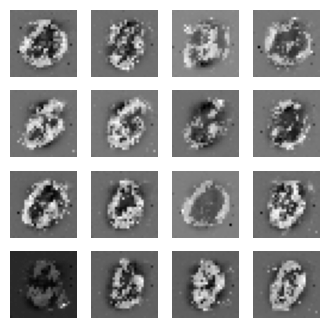

7
real_output: tf.Tensor(
[[1.2167435]
 [2.3025718]
 [2.2340314]
 [1.3036671]
 [2.475646 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0918314]
 [-3.8529036]
 [-4.0104294]
 [-1.3252531]
 [-1.6291729]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8781095, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.105199024, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13927545, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.675305 ]
 [1.4091976]
 [4.7159576]
 [1.7791848]
 [2.464424 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.8610501]
 [-3.2452207]
 [-1.7390847]
 [-2.8471682]
 [-6.0241437]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0226607, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08876917, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12477142, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3425698]
 [2.101756 ]
 [2.2922769]
 [1.9260744]
 [2.7737248]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[1.5556821]
 [1.9304733]
 [4.3704243]
 [4.34989  ]
 [1.0346999]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.10334063]
 [-0.65076554]
 [-4.1086874 ]
 [-2.4092607 ]
 [-0.80874014]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9913201, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.099068254, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11763488, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.3487763]
 [3.9724448]
 [2.085553 ]
 [2.8445277]
 [0.876642 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.726126  ]
 [ 0.13532618]
 [-2.393872  ]
 [-2.760762  ]
 [-3.3654425 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.82381, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13618396, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13638145, shape=(), dtype=float32)


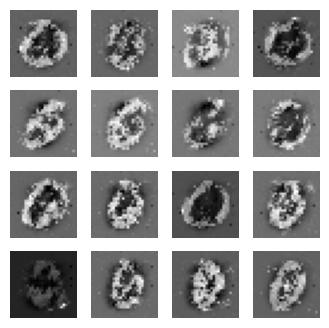

8
real_output: tf.Tensor(
[[2.2126243]
 [3.917235 ]
 [4.0356307]
 [2.6613133]
 [5.348382 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1268086 ]
 [-0.16895989]
 [-2.7301223 ]
 [-0.5734263 ]
 [-2.7189696 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9267974, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09400372, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15487894, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1894329]
 [1.8364093]
 [3.9567287]
 [2.863911 ]
 [2.9452257]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.4204535]
 [-3.5108106]
 [-2.9496272]
 [-0.951619 ]
 [-4.2865477]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.709479, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11891923, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1564255, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.2223034]
 [1.8670651]
 [2.3121016]
 [1.7434702]
 [2.9449172]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[2.4660006]
 [3.0591311]
 [4.257608 ]
 [3.4661584]
 [2.7541084]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3332312]
 [-1.2502397]
 [-2.9769242]
 [-2.7404346]
 [-3.95678  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7242332, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.100486964, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15648934, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9287584 ]
 [4.2129984 ]
 [0.88529634]
 [2.0772438 ]
 [3.4072833 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5675886]
 [-2.8452668]
 [-4.2009616]
 [-2.2243075]
 [-5.356095 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8828695, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.119096324, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13892055, shape=(), dtype=float32)


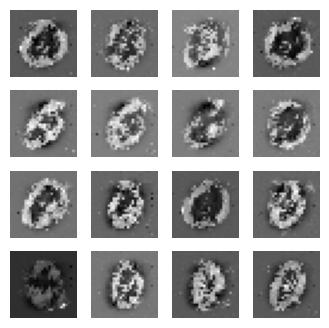

9
real_output: tf.Tensor(
[[1.0436707]
 [2.0140631]
 [2.0559766]
 [1.6372417]
 [2.0711815]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0089757]
 [-5.2126155]
 [-1.1307281]
 [-3.1921003]
 [-3.9101884]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8418467, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.099733055, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13961019, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.1214905]
 [3.0919952]
 [3.6658006]
 [3.2036707]
 [2.0763614]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.617693 ]
 [-2.3717756]
 [-2.1742892]
 [-4.2265973]
 [-2.9229586]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.8861678, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09543365, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.128966, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.34754384]
 [2.77096   ]
 [2.5955026 ]
 [4.5094657 ]
 [1.2340463 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

real_output: tf.Tensor(
[[2.700954 ]
 [1.908033 ]
 [4.7935424]
 [2.0841737]
 [3.301071 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.7009796 ]
 [ 0.19280705]
 [-2.670923  ]
 [-2.9346042 ]
 [-3.0963538 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9953291, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0949579, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10476522, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.0505908 ]
 [-0.18054757]
 [ 1.8882662 ]
 [ 4.020732  ]
 [ 2.2949302 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3354235]
 [-2.5713778]
 [-6.625389 ]
 [-3.270118 ]
 [-3.7803144]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9557586, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12247986, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.123176135, shape=(), dtype=float32)


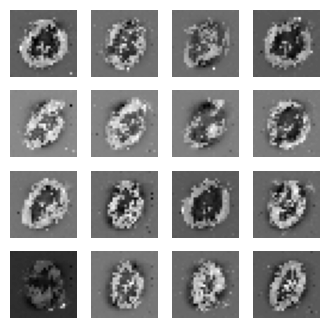

10
real_output: tf.Tensor(
[[2.5724256]
 [3.4014003]
 [2.3320434]
 [2.6531978]
 [0.7430762]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9890366]
 [-1.3343866]
 [-1.3501981]
 [-2.2236276]
 [-0.2060794]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1540804, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1109171, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11390119, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.7640636]
 [1.9617043]
 [1.7549683]
 [2.8205087]
 [2.0651267]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7745028]
 [-2.1068885]
 [-3.1350534]
 [-3.8679507]
 [-3.3192525]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.957342, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.103562795, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11493503, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7922575]
 [0.7533639]
 [1.5499538]
 [2.5548172]
 [1.6862257]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[2.8262737]
 [2.1192744]
 [3.3679855]
 [4.3777676]
 [2.0983999]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6132684]
 [-1.9459913]
 [-1.0926208]
 [-4.6228294]
 [-1.9244635]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9042826, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12985773, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10976557, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8791287]
 [2.8535755]
 [1.2370212]
 [5.1349936]
 [2.963362 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.449994  ]
 [-3.9303396 ]
 [-4.335511  ]
 [-2.7555516 ]
 [-0.47351572]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9628854, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.100573994, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13570145, shape=(), dtype=float32)


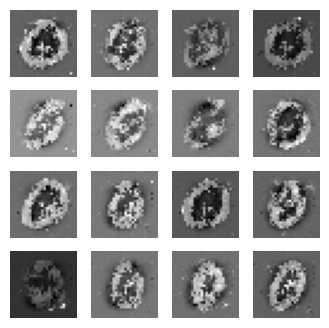

11
real_output: tf.Tensor(
[[1.9803551]
 [3.2694373]
 [5.355857 ]
 [5.483354 ]
 [2.721119 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.231241 ]
 [-3.9121356]
 [-3.118606 ]
 [-1.2311823]
 [-3.0192833]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.9336119, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1069408, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1294543, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.1119246]
 [2.6162817]
 [3.6473792]
 [1.5031396]
 [3.1487777]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.63017154]
 [-3.241226  ]
 [-1.9550647 ]
 [-2.5501575 ]
 [-4.874461  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0757084, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08236279, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08564656, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.25412312]
 [1.5476615 ]
 [3.3648396 ]
 [1.7451891 ]
 [2.0825665 ]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[1.9444894]
 [1.9214052]
 [2.069896 ]
 [1.289368 ]
 [1.3399552]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.4665112]
 [-3.0646214]
 [-2.4367318]
 [ 0.1492295]
 [-2.0206954]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0389156, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09679753, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11420196, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2772806]
 [3.9526637]
 [1.8853953]
 [1.1864493]
 [2.7072887]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3272963 ]
 [-4.634714  ]
 [-4.5780244 ]
 [-8.929246  ]
 [-0.92881894]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.105295, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16179006, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10773717, shape=(), dtype=float32)


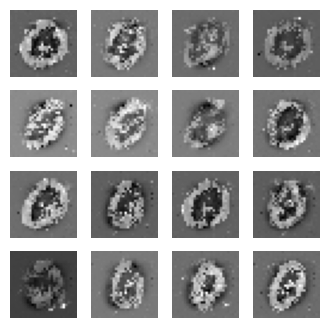

12
real_output: tf.Tensor(
[[2.3881223]
 [3.127074 ]
 [2.7298357]
 [4.0062666]
 [2.4682524]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2456229]
 [-4.165223 ]
 [-4.257844 ]
 [-2.5002089]
 [-1.7546535]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.040059, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07867081, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11364013, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.84241  ]
 [2.8173823]
 [2.1921718]
 [2.1069574]
 [2.9676387]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.8819108]
 [-2.1542044]
 [-2.4250383]
 [-3.4886222]
 [-3.7063992]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0553005, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1476866, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.123972364, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2957945]
 [4.303884 ]
 [2.878571 ]
 [1.8319029]
 [2.811471 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[2.7922673]
 [3.4109206]
 [2.9853134]
 [2.7522936]
 [3.2073195]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9553413]
 [-2.011047 ]
 [-3.7134807]
 [-2.4121923]
 [-4.495515 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1383445, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0840079, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10017914, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2159138]
 [2.669581 ]
 [1.7808348]
 [1.5963382]
 [3.3803337]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2791638]
 [-3.550141 ]
 [-2.7028039]
 [-3.0343664]
 [-1.747264 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.027213, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08041389, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.113829404, shape=(), dtype=float32)


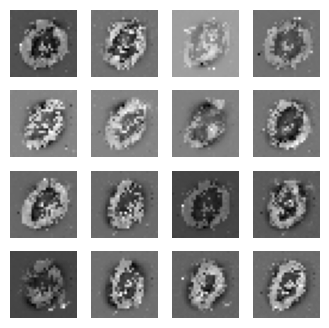

13
real_output: tf.Tensor(
[[3.682023 ]
 [4.230182 ]
 [1.9458594]
 [1.6368619]
 [2.3575077]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2532005]
 [-2.4505527]
 [-1.2953037]
 [-2.0863876]
 [-2.910435 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.027367, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10559523, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.108398385, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3065166]
 [3.7220116]
 [1.7619768]
 [2.875131 ]
 [1.5766724]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6645321]
 [-1.7256726]
 [-4.853225 ]
 [-2.2093813]
 [-2.674631 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1192172, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09124391, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11377859, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5352299 ]
 [2.3326185 ]
 [1.5156007 ]
 [3.59451   ]
 [0.96714604]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[2.9116359]
 [4.192865 ]
 [3.2303224]
 [1.9079611]
 [2.9624596]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.52016  ]
 [-2.1353855]
 [-3.794313 ]
 [-2.8687263]
 [-3.8034465]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1458502, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07539491, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10113047, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8210926]
 [3.6954536]
 [2.736934 ]
 [4.7843437]
 [3.265263 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.761074 ]
 [-1.7623065]
 [-3.8944697]
 [-3.8515854]
 [-2.4888716]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.273615, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.099085525, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.086254686, shape=(), dtype=float32)


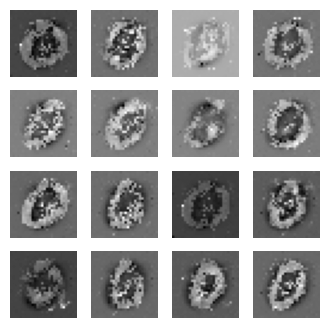

14
real_output: tf.Tensor(
[[3.152249 ]
 [3.1195667]
 [2.2970543]
 [2.0475705]
 [3.3653688]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.526539 ]
 [-4.811982 ]
 [-5.226247 ]
 [-0.9085589]
 [-1.3295752]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0781813, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10954561, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.100740395, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.786137 ]
 [2.5868926]
 [1.0494957]
 [1.1777351]
 [2.2015886]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1448567]
 [-2.780664 ]
 [-2.7912788]
 [-4.413649 ]
 [-2.949781 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3371067, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0715201, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08658735, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0169199]
 [3.7142863]
 [3.485254 ]
 [1.4051956]
 [3.1413627]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[2.478205 ]
 [4.4064245]
 [2.37593  ]
 [3.9373002]
 [1.4892067]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.5156474]
 [-3.0125833]
 [-4.0353403]
 [-2.4971173]
 [-3.1906004]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.021713, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09497518, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09649764, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4210114]
 [3.6233628]
 [3.4704275]
 [3.007927 ]
 [5.110196 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9126215]
 [-3.5939713]
 [-4.6687403]
 [-3.8841288]
 [-2.0457373]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.162959, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.064439565, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0902572, shape=(), dtype=float32)


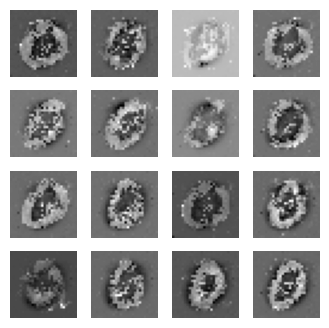

15
real_output: tf.Tensor(
[[2.319368 ]
 [1.926672 ]
 [3.1431537]
 [1.4865295]
 [3.0014257]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0119326]
 [-2.0734513]
 [-2.2488766]
 [-2.7096124]
 [-1.5335733]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0908542, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08262633, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11712122, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7751615]
 [2.479563 ]
 [2.4381151]
 [3.5520792]
 [1.7434429]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6150534]
 [-3.384017 ]
 [-3.3877695]
 [-3.4979393]
 [-2.3707025]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1290598, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.098697305, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.090988085, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1479497]
 [3.2255697]
 [1.7898576]
 [2.583773 ]
 [2.7640748]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[4.0778613]
 [2.8999007]
 [2.8238487]
 [1.7335335]
 [3.5062575]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.3380957 ]
 [-0.00826461]
 [-2.7801812 ]
 [-1.5079601 ]
 [-2.5575917 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0244877, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10284233, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.099687845, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1847465]
 [2.8955202]
 [3.378955 ]
 [2.4434056]
 [3.094818 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1241994]
 [-2.9251213]
 [-4.0159483]
 [-1.1866304]
 [-2.3604453]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1817307, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.088725775, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.084839895, shape=(), dtype=float32)


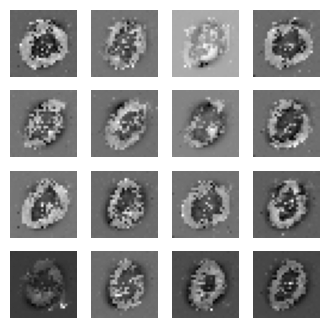

16
real_output: tf.Tensor(
[[1.80644  ]
 [3.1071692]
 [2.8245542]
 [3.265563 ]
 [2.2198722]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.142999 ]
 [-3.2299738]
 [-3.5932317]
 [-4.490289 ]
 [-4.35344  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.957292, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.090109095, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11990987, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8410643]
 [2.5797994]
 [3.8889775]
 [2.35705  ]
 [2.7759395]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8551264]
 [-2.0446177]
 [-7.6476164]
 [-2.4537358]
 [-2.6191285]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1317353, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.059477974, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08937974, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3452675]
 [2.4587078]
 [3.5881295]
 [3.5140553]
 [4.133769 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[2.1000721]
 [2.471495 ]
 [1.4551513]
 [3.134481 ]
 [2.0467412]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9402533]
 [-2.8410702]
 [-1.6193979]
 [-3.4743176]
 [-3.8053284]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0448477, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.073671125, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.098057374, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2635376]
 [3.084556 ]
 [3.4627147]
 [4.3154893]
 [3.084486 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9350064]
 [-2.5334613]
 [-6.3596854]
 [-1.0737351]
 [-2.6419747]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.185232, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07478616, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09186444, shape=(), dtype=float32)


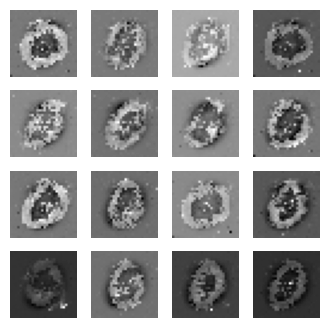

17
real_output: tf.Tensor(
[[3.345998 ]
 [4.043693 ]
 [5.204944 ]
 [3.2893133]
 [3.0700939]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5451567]
 [-3.4773693]
 [-4.1294026]
 [-3.0530457]
 [-4.2279615]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1802392, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.060077727, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09633222, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7463446]
 [5.6156654]
 [2.8253818]
 [4.9798026]
 [2.6911345]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8358064 ]
 [-5.291708  ]
 [-2.226973  ]
 [-0.97992766]
 [-2.5130503 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.179953, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05469439, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10104503, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.3082542]
 [2.6071086]
 [2.6871424]
 [2.9974685]
 [3.223531 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[3.1915169]
 [2.3824515]
 [2.9354322]
 [1.8451742]
 [3.9402244]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5388799 ]
 [-3.2455344 ]
 [-4.018652  ]
 [-0.88133883]
 [-5.13161   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2493067, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06482823, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08259861, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5714166]
 [3.3324733]
 [2.201047 ]
 [4.770085 ]
 [1.4142252]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.059712 ]
 [-3.4602509]
 [-2.2115798]
 [-4.888914 ]
 [ 0.7352747]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1892664, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09406626, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.091432974, shape=(), dtype=float32)


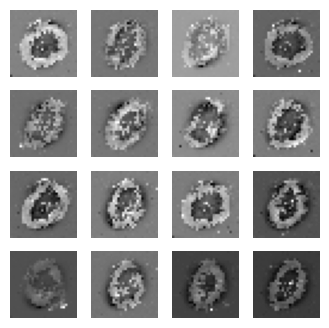

18
real_output: tf.Tensor(
[[5.533606 ]
 [3.104186 ]
 [3.4708726]
 [3.3590443]
 [3.5268512]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.596297 ]
 [-3.0131214]
 [-3.2480931]
 [-2.170457 ]
 [-4.1020293]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2675548, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06332437, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07153337, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5467584]
 [3.0437195]
 [3.6157591]
 [4.699809 ]
 [1.5173949]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8599613]
 [-3.9082901]
 [-1.5300627]
 [-2.4979446]
 [-4.057673 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3928773, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.083470635, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0671127, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1577756]
 [2.3612423]
 [1.7176105]
 [3.0410693]
 [1.8787519]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[4.0564327]
 [3.6040847]
 [4.562667 ]
 [5.1650763]
 [3.4135456]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3916233]
 [-6.2328644]
 [-4.5705824]
 [-3.4215813]
 [-3.4680831]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2367373, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.055956922, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08674535, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5031114]
 [2.4286666]
 [2.87893  ]
 [4.6784277]
 [2.240046 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.432761 ]
 [-4.4412913]
 [-2.3106875]
 [-1.6504003]
 [-2.8638291]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.346878, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07617218, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08906955, shape=(), dtype=float32)


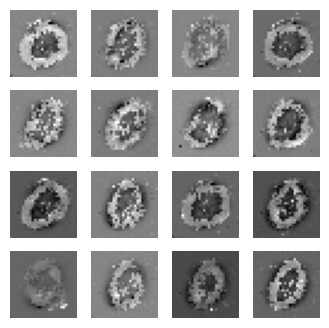

19
real_output: tf.Tensor(
[[2.1624472]
 [2.8378758]
 [4.263388 ]
 [2.4394288]
 [3.1056104]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.3853164]
 [-4.8459225]
 [-3.76264  ]
 [-4.124116 ]
 [-1.9452149]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4038033, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.058755636, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08301898, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7825682]
 [2.1250703]
 [2.281726 ]
 [3.129897 ]
 [3.1302712]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.559855 ]
 [-5.7637515]
 [-3.2789834]
 [-3.7616172]
 [-3.3647854]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4460726, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07456167, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.077543095, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2381656]
 [1.3859417]
 [2.049972 ]
 [1.4573803]
 [5.167874 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[2.545991 ]
 [1.1581676]
 [2.9599385]
 [1.943676 ]
 [2.435697 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.575976 ]
 [-2.5542593]
 [-2.5144398]
 [-3.2179236]
 [-2.962055 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2448754, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09380454, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08888592, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6876491]
 [3.8725233]
 [1.8173615]
 [4.0564904]
 [1.116292 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4302888 ]
 [-1.7825476 ]
 [-3.2833507 ]
 [-0.90396774]
 [-0.88729763]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2364159, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08484534, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.087300576, shape=(), dtype=float32)


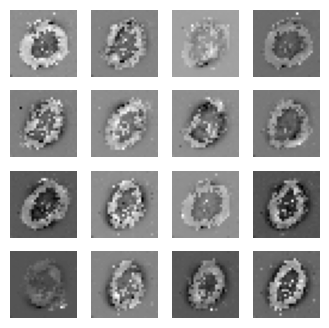

20
real_output: tf.Tensor(
[[4.1490417]
 [1.1887532]
 [5.1416044]
 [2.738094 ]
 [1.8767736]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4633856]
 [-8.8442335]
 [-6.9347916]
 [-3.3799608]
 [-5.436343 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1283822, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10770403, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11399436, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1171207]
 [1.2627382]
 [3.262534 ]
 [2.4651382]
 [2.823125 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.3226776]
 [-2.9601643]
 [-2.1524532]
 [-3.753684 ]
 [-2.324498 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1691384, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.070993155, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.107513055, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7028704]
 [3.3268168]
 [2.620896 ]
 [2.0891604]
 [2.5217552]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[2.6989524]
 [2.3051999]
 [2.7276   ]
 [4.3852425]
 [3.9665582]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6322762]
 [-1.186304 ]
 [-3.6186986]
 [-4.8514123]
 [-3.4082887]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.099748, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.056786135, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.101516664, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.504507 ]
 [3.1500597]
 [2.299883 ]
 [2.444678 ]
 [2.6478662]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.434215 ]
 [-2.1871037]
 [-2.8762207]
 [ 1.6660646]
 [-2.837206 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4173276, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05432281, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08518142, shape=(), dtype=float32)


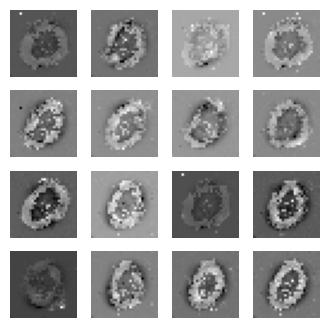

21
real_output: tf.Tensor(
[[4.037239 ]
 [3.389288 ]
 [2.178298 ]
 [3.6076856]
 [3.1614661]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.652388 ]
 [-3.535007 ]
 [-4.3907437]
 [-6.2473965]
 [-6.7086177]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.335661, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07656056, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07869975, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.746792 ]
 [1.9724177]
 [3.093998 ]
 [3.7092745]
 [4.589033 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8518825]
 [-1.6347481]
 [-4.037267 ]
 [-2.1949224]
 [-1.3379699]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2981727, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06696534, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07531325, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9128406]
 [3.0289927]
 [2.3910387]
 [3.5428522]
 [3.4306133]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[3.5235744]
 [1.4668156]
 [4.398219 ]
 [2.6909828]
 [3.1571722]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2292683]
 [-4.4048834]
 [-1.848106 ]
 [-4.4105744]
 [-1.7538539]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2835836, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06596325, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08620781, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.7614994]
 [2.9511874]
 [1.7749482]
 [3.0247676]
 [1.321698 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9697015]
 [-3.8011801]
 [-1.5918014]
 [-3.0032833]
 [-4.42666  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2435312, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.086211026, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.079556495, shape=(), dtype=float32)


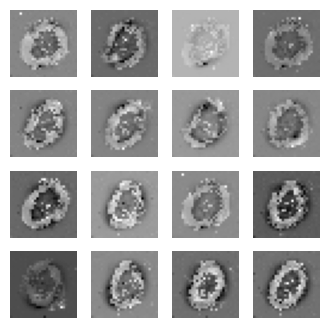

22
real_output: tf.Tensor(
[[3.6277833]
 [3.3164563]
 [1.4566169]
 [2.9144983]
 [2.840678 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.055504 ]
 [-3.5205626]
 [-2.1879568]
 [-4.3512216]
 [-3.813662 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3292832, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.092910245, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.083188936, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0174649]
 [3.8071907]
 [2.5435293]
 [3.7232234]
 [1.3311121]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8354132 ]
 [-0.90816027]
 [-2.7337272 ]
 [-2.9972436 ]
 [-4.6616373 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1761947, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.067822725, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08681996, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.4430175]
 [3.0287478]
 [2.9545987]
 [4.192219 ]
 [4.536781 ]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[3.5891552]
 [3.687426 ]
 [2.6958618]
 [2.713665 ]
 [3.1878483]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4500581]
 [-1.0494734]
 [-5.4025216]
 [-3.895898 ]
 [-5.3406153]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2073364, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08877988, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10003807, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.553555 ]
 [1.6891997]
 [4.4257393]
 [3.2720196]
 [2.5705357]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6980417]
 [-3.2263792]
 [-1.970537 ]
 [-1.9727712]
 [-2.9843562]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0879874, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07027322, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10200962, shape=(), dtype=float32)


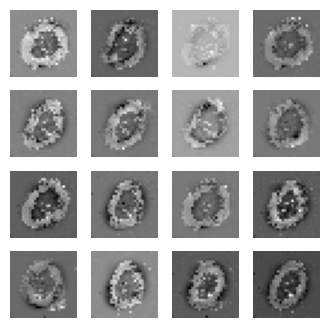

23
real_output: tf.Tensor(
[[1.5785749]
 [4.0327787]
 [1.7096126]
 [3.8132412]
 [2.2890775]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.388455 ]
 [-1.3674624]
 [-4.0543575]
 [-2.6135166]
 [-2.0511887]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.216289, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.079129115, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08817841, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3637671]
 [3.166792 ]
 [4.6122465]
 [2.829105 ]
 [2.331682 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.833823 ]
 [-2.9591875]
 [-5.002085 ]
 [-2.450729 ]
 [-2.976296 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0683703, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05364884, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.099580124, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3903852]
 [4.018011 ]
 [4.0097265]
 [3.3284633]
 [3.2381878]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[3.4807663]
 [1.5854895]
 [2.8880987]
 [2.5827384]
 [1.5943878]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4799206 ]
 [-4.4597526 ]
 [-0.95669186]
 [-1.9315202 ]
 [-3.7878246 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.525498, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10273003, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06950587, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.697526 ]
 [1.8630124]
 [4.122002 ]
 [2.0299003]
 [2.4233694]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.1641326]
 [-2.356397 ]
 [-5.106356 ]
 [-3.973161 ]
 [-2.670398 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3094807, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07818052, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09242378, shape=(), dtype=float32)


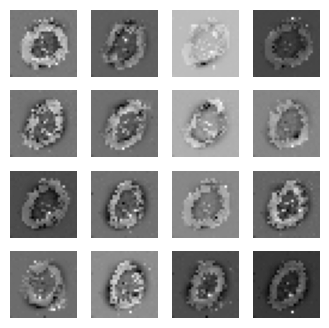

24
real_output: tf.Tensor(
[[4.407927 ]
 [5.6676946]
 [2.7027907]
 [2.679443 ]
 [2.2602098]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.4744506]
 [-2.0803683]
 [-2.2446175]
 [ 0.5375451]
 [-1.3031818]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3560395, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.077461764, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08184223, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7079933 ]
 [3.2151706 ]
 [0.51634914]
 [0.84024197]
 [1.1551102 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4053433]
 [-4.958572 ]
 [-3.4368942]
 [-3.1968424]
 [-2.4127524]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.424436, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.108881116, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07627752, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2973833]
 [2.4687452]
 [2.4586723]
 [3.0979476]
 [4.035473 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[2.153915 ]
 [2.6302743]
 [3.3599489]
 [3.2960355]
 [2.5379438]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.83911  ]
 [-1.5204818]
 [-1.8632948]
 [-5.6365724]
 [-1.0068233]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4719172, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08559702, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.064813346, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0934536]
 [4.146079 ]
 [2.6884713]
 [3.1075912]
 [2.829656 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1991854]
 [-3.8491588]
 [-1.8839859]
 [-3.7480683]
 [-2.2678585]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.352119, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.083305635, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07464202, shape=(), dtype=float32)


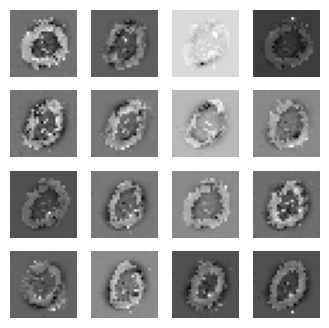

25
real_output: tf.Tensor(
[[3.3153007]
 [3.0948665]
 [2.8838148]
 [3.1333113]
 [2.7707844]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.847124 ]
 [-1.7904387]
 [-1.4089332]
 [-4.269278 ]
 [-1.2760149]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3554807, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05730397, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07166397, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3125358]
 [2.2640295]
 [0.9459046]
 [2.1418552]
 [3.5984106]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4181051]
 [-2.092169 ]
 [-3.9810448]
 [-2.7479784]
 [-1.7465801]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3131342, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06610355, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07990123, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6783314]
 [2.239425 ]
 [3.0175433]
 [2.6339965]
 [3.4415677]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[2.74067  ]
 [2.1205914]
 [1.9326739]
 [1.8306692]
 [4.237172 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.95006156]
 [-3.6577835 ]
 [-2.5892112 ]
 [-3.341653  ]
 [-1.2067814 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5643501, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10599535, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.074697584, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2061045]
 [2.9488099]
 [1.8504117]
 [2.4384108]
 [3.8354714]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.7654388]
 [-0.7701281]
 [-1.0944276]
 [-2.272341 ]
 [-2.339697 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6011643, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.087703526, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.058327682, shape=(), dtype=float32)


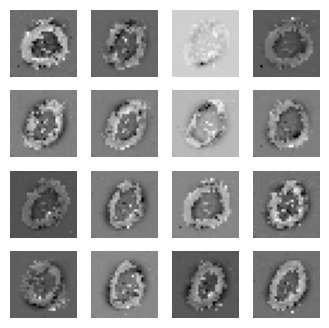

26
real_output: tf.Tensor(
[[1.7526459]
 [2.7961543]
 [3.036231 ]
 [3.4946456]
 [3.8619442]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.603244 ]
 [-3.9039974]
 [-2.5358167]
 [-2.6061573]
 [-2.90981  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.504495, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06168593, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06640638, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9899616]
 [2.995417 ]
 [1.7137328]
 [2.910736 ]
 [1.0325884]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.915804 ]
 [-2.7660503]
 [-3.7718701]
 [-3.577105 ]
 [-2.9422207]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6666498, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.074395545, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.072374985, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4559593]
 [5.31203  ]
 [2.630427 ]
 [0.8983078]
 [3.2067733]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[2.9579418]
 [3.5575147]
 [1.9509845]
 [2.8623204]
 [3.5141265]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.4021463]
 [-3.8980436]
 [-2.9953985]
 [-3.4176128]
 [-3.1431298]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4083414, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07889537, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07048757, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.38211  ]
 [4.4026937]
 [2.1240077]
 [2.5269847]
 [2.3208194]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8682358]
 [-3.529326 ]
 [-4.4764743]
 [-3.54147  ]
 [-4.1040983]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4104269, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06151269, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07293783, shape=(), dtype=float32)


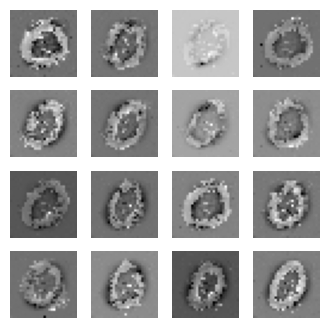

27
real_output: tf.Tensor(
[[4.3698297]
 [1.8031901]
 [1.7958609]
 [2.9060678]
 [2.045535 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9593587]
 [-3.3881094]
 [-2.826539 ]
 [-2.4434874]
 [-2.6245027]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4585953, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06719306, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06442765, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7303429]
 [5.3361564]
 [4.653276 ]
 [2.6959717]
 [2.610445 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.719113 ]
 [-3.7451723]
 [-3.63199  ]
 [-4.7995973]
 [-5.3349457]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3359475, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.060647875, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08925128, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0313628]
 [4.779888 ]
 [3.9421358]
 [3.278832 ]
 [1.8748274]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[1.799088 ]
 [2.956484 ]
 [4.102523 ]
 [3.0242705]
 [2.177809 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.940124 ]
 [-4.753192 ]
 [-4.663992 ]
 [-4.983298 ]
 [-1.9145203]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5646753, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08124776, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07079762, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2229033]
 [2.3027968]
 [3.4023907]
 [2.3841183]
 [1.746133 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2782025]
 [-2.6786687]
 [-3.56106  ]
 [-4.2092156]
 [-1.0323578]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5784316, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.074628666, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06666311, shape=(), dtype=float32)


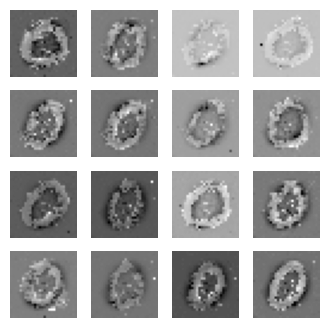

28
real_output: tf.Tensor(
[[3.3473573]
 [3.5255475]
 [2.1656532]
 [3.5732572]
 [2.9315646]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.1126146]
 [-2.9534395]
 [-2.273811 ]
 [-0.9515537]
 [-5.060463 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4818437, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06624627, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09546538, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5287056]
 [2.5325754]
 [2.1212418]
 [2.9402215]
 [2.1971374]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.020093  ]
 [-1.2396041 ]
 [-3.4245265 ]
 [-0.45735747]
 [-2.3989072 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3781033, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.058269385, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.084899254, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.935806 ]
 [3.2428167]
 [2.9479678]
 [2.9583395]
 [2.783802 ]], shape=(5, 1), dtype=float32)
fake_output: tf.

real_output: tf.Tensor(
[[4.1156583]
 [3.5028274]
 [1.3958954]
 [3.8405056]
 [2.014023 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4344232]
 [-5.445109 ]
 [-1.1350651]
 [-2.5895782]
 [-4.745459 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4096272, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09320487, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.077899635, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3816357]
 [1.6890054]
 [3.6846256]
 [3.3416967]
 [3.9590702]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.196022 ]
 [-4.348692 ]
 [-4.9420815]
 [-4.1778355]
 [-5.72441  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.444762, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07132541, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07330624, shape=(), dtype=float32)


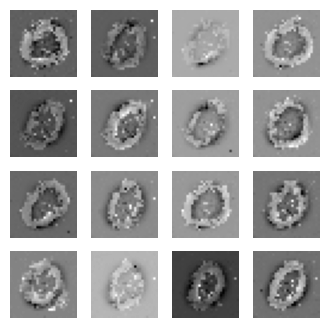

29
real_output: tf.Tensor(
[[3.2674341]
 [2.8871481]
 [3.5442996]
 [3.5611079]
 [2.922936 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5751987]
 [-4.1899185]
 [-1.4740347]
 [-3.390347 ]
 [-5.200523 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5546215, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.085778736, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06937554, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3402982]
 [3.0211303]
 [1.6225511]
 [4.1974764]
 [3.7124894]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5185473]
 [-4.642145 ]
 [-6.7818575]
 [-2.916761 ]
 [-1.7056106]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6195664, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05727839, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.062745765, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.128371 ]
 [4.1777506]
 [2.4389641]
 [3.4846456]
 [3.220448 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[0.5856401]
 [3.7631605]
 [2.8158567]
 [3.2198474]
 [3.2606032]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.9968157]
 [-2.8090785]
 [-3.3632486]
 [-1.6039208]
 [-2.3841486]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4907367, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.070748724, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07504639, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4282515]
 [2.6902783]
 [4.426799 ]
 [2.7849128]
 [3.3044236]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4578621]
 [-2.103061 ]
 [-1.5363133]
 [-3.2150733]
 [-3.9495904]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4126396, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.062224776, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.083257794, shape=(), dtype=float32)


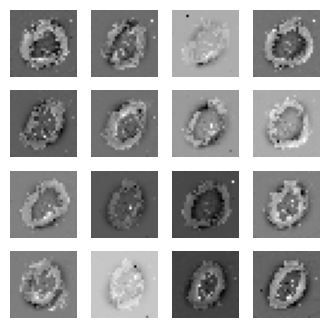

30
real_output: tf.Tensor(
[[2.4656868]
 [4.034004 ]
 [2.2101085]
 [4.1714344]
 [2.7701032]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9617946]
 [-5.0242863]
 [-4.406135 ]
 [-2.1664884]
 [-6.0323687]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4140954, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.062401433, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.095015466, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9130793]
 [4.6284585]
 [1.9109814]
 [3.8459935]
 [2.9954998]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.42024   ]
 [-0.94991595]
 [-4.3197923 ]
 [-1.3220598 ]
 [-2.3442783 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.374636, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.069071464, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08267716, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6674976]
 [2.528872 ]
 [1.1376189]
 [2.2147112]
 [3.9211223]], shape=(5, 1), dtype=float32)
fake_output: tf.

real_output: tf.Tensor(
[[2.7189772]
 [2.5613642]
 [3.4658253]
 [1.9185225]
 [2.61627  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9266086]
 [-3.2477074]
 [-2.756153 ]
 [-6.732942 ]
 [-0.6498783]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4201536, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09797421, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.087062985, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9136364]
 [3.3839297]
 [5.287378 ]
 [2.6529791]
 [4.5238056]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.0899954]
 [-3.6188743]
 [-0.6633794]
 [-1.7650669]
 [-3.0682993]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5122352, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.081866875, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06929056, shape=(), dtype=float32)


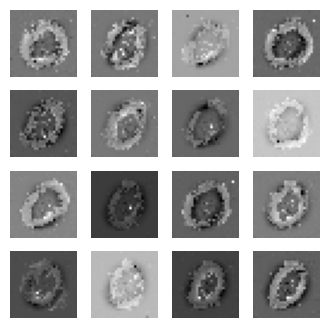

31
real_output: tf.Tensor(
[[3.2322078]
 [2.9134328]
 [3.728201 ]
 [3.1982608]
 [3.4507723]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7816582]
 [-1.6627736]
 [-2.5872276]
 [-2.869114 ]
 [-3.252553 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7144094, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09470227, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.056091353, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3052273 ]
 [3.9219053 ]
 [2.1636915 ]
 [0.81269723]
 [3.4116852 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.1803656]
 [-3.5511801]
 [-1.7813315]
 [-6.271942 ]
 [-5.881383 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5682464, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08387011, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0783851, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.172292 ]
 [1.6163664]
 [2.0958428]
 [0.9377095]
 [3.0422091]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[3.0337257]
 [2.0306911]
 [2.8216658]
 [2.0224912]
 [1.9077184]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.8761642]
 [-3.4358385]
 [-4.751691 ]
 [-2.8359187]
 [-3.8003914]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2852578, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10233185, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.092406735, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3322287]
 [2.6447916]
 [2.8907175]
 [3.0474253]
 [4.09776  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7022485]
 [-4.728583 ]
 [-4.7254906]
 [-3.3413959]
 [-2.0922396]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3236742, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07042, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0896477, shape=(), dtype=float32)


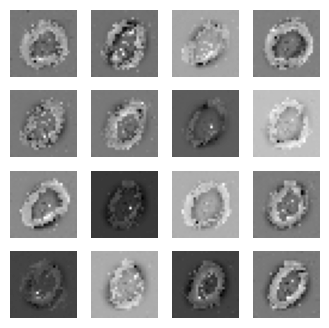

32
real_output: tf.Tensor(
[[2.462736 ]
 [2.5166376]
 [2.2697856]
 [4.1719437]
 [2.8705618]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.4125257]
 [-3.3215673]
 [-3.9415877]
 [-2.1860397]
 [-3.99485  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4210796, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.083002955, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07045323, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.8935513]
 [3.371527 ]
 [2.4804578]
 [3.4735682]
 [4.5309258]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9880426]
 [-1.952572 ]
 [-2.0283875]
 [-5.0515337]
 [-7.4993033]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2294302, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06286951, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.077722356, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3918488]
 [4.6351104]
 [4.008127 ]
 [3.3971438]
 [1.8669928]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[2.9994798]
 [3.0936844]
 [2.476698 ]
 [5.2888217]
 [3.2130427]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8651364]
 [-2.2976885]
 [-6.9314427]
 [-3.179164 ]
 [-3.167166 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3872263, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.062235978, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.072895266, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.712883 ]
 [3.9202244]
 [4.664135 ]
 [3.4603155]
 [1.6621268]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6507406]
 [-1.962612 ]
 [-1.1519331]
 [-2.7422583]
 [-4.619986 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2758265, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08301802, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09886953, shape=(), dtype=float32)


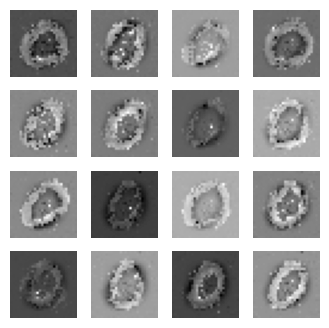

33
real_output: tf.Tensor(
[[2.8490562]
 [1.161739 ]
 [2.104856 ]
 [5.1662984]
 [3.0675554]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0132723]
 [-4.2481503]
 [-2.3699508]
 [-2.7547164]
 [-1.6900666]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3248262, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07973744, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08371013, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.3173795]
 [1.8130215]
 [3.0925407]
 [2.4087057]
 [2.0158603]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.608826 ]
 [-2.602787 ]
 [-1.9215347]
 [-1.927295 ]
 [-3.5777225]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2579193, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.099861965, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09766945, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4738235]
 [4.189937 ]
 [2.3900628]
 [3.373445 ]
 [2.7458453]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[3.2267213]
 [2.9307592]
 [2.7330182]
 [1.1286116]
 [3.4631188]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6794841]
 [-2.936063 ]
 [-1.0164466]
 [-3.9954388]
 [-2.5332248]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4284973, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07095141, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06538471, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.9869975]
 [2.9516823]
 [4.046608 ]
 [3.2119918]
 [3.658983 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2611144]
 [-4.8084936]
 [-7.105722 ]
 [-7.900697 ]
 [-4.83703  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.501366, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.072838716, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.068693385, shape=(), dtype=float32)


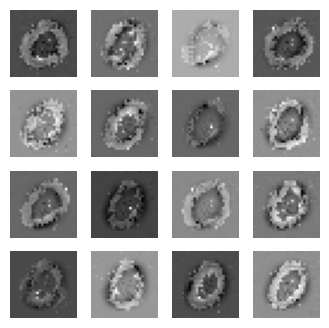

34
real_output: tf.Tensor(
[[2.5911396]
 [3.085064 ]
 [3.3023696]
 [1.5573139]
 [2.8418012]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.272914 ]
 [-1.1076689]
 [-2.7470846]
 [-2.8743691]
 [-1.9735212]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3241122, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06782554, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.078389645, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0921173]
 [3.5024803]
 [3.566691 ]
 [2.539997 ]
 [2.8169518]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ -9.878413 ]
 [ -3.1968312]
 [-15.082797 ]
 [ -5.421265 ]
 [ -2.430077 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4828908, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06280522, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08233374, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3457108]
 [3.3542352]
 [2.6587007]
 [2.0346024]
 [3.288617 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[3.7850876]
 [4.016758 ]
 [3.4627895]
 [4.6255894]
 [2.5292983]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6748796]
 [-4.5963073]
 [-3.4114761]
 [-5.8471155]
 [-2.646717 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.20786, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.059195574, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10329084, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2146635]
 [2.813506 ]
 [3.7061007]
 [2.4332664]
 [4.212221 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.300578 ]
 [-4.678833 ]
 [-2.9359796]
 [-0.591192 ]
 [-3.7189128]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1353197, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06232898, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.111287065, shape=(), dtype=float32)


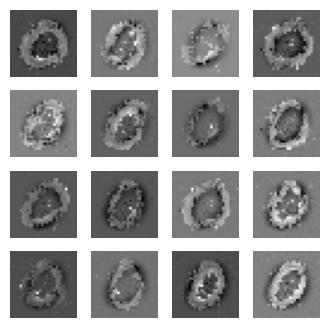

35
real_output: tf.Tensor(
[[1.70306  ]
 [4.7691464]
 [1.7943434]
 [3.2715793]
 [3.8127608]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1445565]
 [-3.7817645]
 [-2.9470637]
 [-3.8793325]
 [-9.79935  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4021032, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08255072, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08317449, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.214645 ]
 [2.5200582]
 [2.5773878]
 [3.7739456]
 [3.9459481]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.7534413]
 [-2.7003248]
 [-4.5821958]
 [-5.743904 ]
 [-0.834328 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3715396, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08266726, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08625917, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9491258]
 [1.2268143]
 [1.6854119]
 [2.2896605]
 [4.3684716]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[2.4322486]
 [4.1085386]
 [3.0261405]
 [3.0277624]
 [2.7175853]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.844593 ]
 [-2.2008657]
 [-1.3855909]
 [-6.269379 ]
 [-4.029843 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4464056, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.068038, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0780842, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1933835]
 [3.4649487]
 [4.9652653]
 [4.9250946]
 [3.6978734]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.608624  ]
 [-3.2587097 ]
 [-1.0068984 ]
 [-1.757035  ]
 [-0.56618816]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.295408, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.04530102, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.095844425, shape=(), dtype=float32)


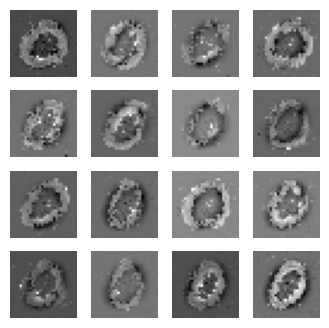

36
real_output: tf.Tensor(
[[1.3697556]
 [1.7373533]
 [2.8257675]
 [2.8756483]
 [2.7686608]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6360507]
 [-3.118969 ]
 [-4.6489124]
 [-7.07528  ]
 [-2.9879441]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2960258, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07945432, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.098738536, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.400181 ]
 [2.4831142]
 [2.6215012]
 [3.2065866]
 [4.055919 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8239796]
 [-5.4941664]
 [-4.213707 ]
 [-2.7708013]
 [-2.6665196]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4074996, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.059151202, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06640884, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3953083]
 [2.351803 ]
 [3.3194358]
 [4.6499615]
 [3.4412072]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

real_output: tf.Tensor(
[[4.684442 ]
 [2.3551648]
 [4.3133016]
 [3.345792 ]
 [2.8694382]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-8.718989 ]
 [-5.1109123]
 [-2.9139073]
 [-3.9294963]
 [-3.0459304]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3371224, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07458782, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10188649, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.604224 ]
 [3.028103 ]
 [3.1714468]
 [3.7424114]
 [3.0254824]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.2054224]
 [-2.847474 ]
 [-3.5197601]
 [-1.6180233]
 [-4.915844 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3142173, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06766662, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.113641635, shape=(), dtype=float32)


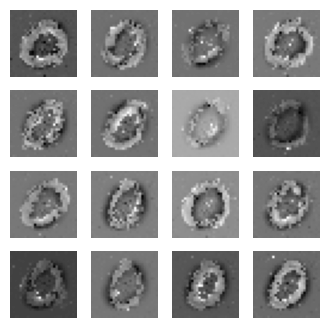

37
real_output: tf.Tensor(
[[4.033709 ]
 [2.0825016]
 [1.7844366]
 [3.7921338]
 [1.9656426]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.239603 ]
 [-2.090635 ]
 [-2.7254474]
 [-2.0253663]
 [-5.5487823]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.388191, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.082743555, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09569061, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5519953]
 [3.7860096]
 [3.0612037]
 [3.177902 ]
 [2.678137 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1951816]
 [-4.4859743]
 [-3.9758928]
 [-2.2959578]
 [-2.1725705]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4813428, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06068104, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07845227, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6851554]
 [2.5281835]
 [2.7527728]
 [3.647583 ]
 [2.035138 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[2.342816 ]
 [3.0863802]
 [3.9553716]
 [4.2732472]
 [1.8891568]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7423651]
 [-4.0851183]
 [-4.2336264]
 [-3.0424247]
 [-1.6670642]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3501387, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07512355, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08639318, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.387154 ]
 [1.6478776]
 [1.462376 ]
 [1.5113565]
 [2.7839615]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.991474 ]
 [-1.6057581]
 [-4.069141 ]
 [-8.372137 ]
 [-2.9114907]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3510108, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08691751, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09820141, shape=(), dtype=float32)


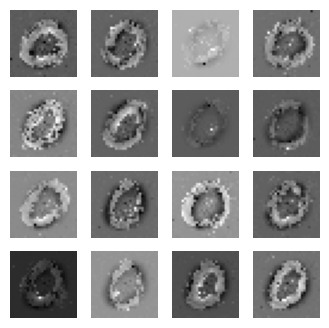

38
real_output: tf.Tensor(
[[ 3.7844794]
 [-0.8311946]
 [ 2.8451421]
 [ 4.623768 ]
 [ 2.1582055]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0260134]
 [-2.631882 ]
 [-2.2683046]
 [-5.0766077]
 [-3.7341266]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5801282, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13466957, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07836408, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.5525446]
 [2.710312 ]
 [2.952166 ]
 [4.133027 ]
 [3.1477501]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6690776]
 [-2.4532857]
 [-4.988515 ]
 [-5.0211105]
 [-2.7242231]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7056205, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.065162584, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06396937, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.737261 ]
 [3.5163448]
 [2.5941608]
 [1.8202676]
 [3.7367165]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[3.5451093]
 [4.28222  ]
 [4.1577497]
 [1.8884182]
 [1.4674743]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0701177]
 [-2.1893272]
 [-3.814108 ]
 [-5.363613 ]
 [-3.3579206]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6283524, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07173464, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.057465255, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2273135]
 [5.255207 ]
 [3.874113 ]
 [3.4865954]
 [3.459335 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2729087]
 [-4.6784315]
 [-0.60641  ]
 [-3.669263 ]
 [-3.4766822]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6660635, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06412297, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.066194296, shape=(), dtype=float32)


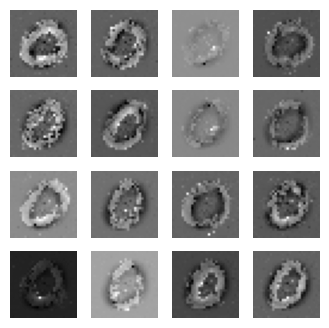

39
real_output: tf.Tensor(
[[3.818157 ]
 [4.673948 ]
 [2.3085446]
 [5.2411313]
 [4.6514   ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.347507 ]
 [-6.045752 ]
 [-4.4699955]
 [-2.3601172]
 [-2.3949916]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5927565, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.059789054, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07311815, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.441442 ]
 [5.7394714]
 [2.1848183]
 [3.0672274]
 [3.8918147]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4947803]
 [-8.220341 ]
 [-2.0216742]
 [-2.1322336]
 [-3.0460596]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.553763, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.053487256, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09577447, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.8631136 ]
 [3.7409453 ]
 [0.37483624]
 [3.119348  ]
 [4.2268057 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[0.52947795]
 [2.591492  ]
 [2.498805  ]
 [3.229175  ]
 [2.6931581 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.354239 ]
 [-2.19254  ]
 [-3.8444471]
 [-3.7508721]
 [-3.3702283]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5499, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08600287, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.067420244, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9951668]
 [3.6454659]
 [3.559096 ]
 [1.9761841]
 [1.9030907]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2965384]
 [-5.5568604]
 [-6.0570526]
 [-4.9486065]
 [-6.300122 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6617398, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.075790085, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07030617, shape=(), dtype=float32)


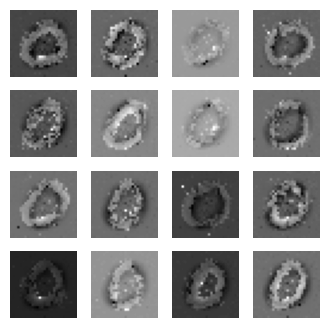

40
real_output: tf.Tensor(
[[3.540854 ]
 [3.9723353]
 [2.5442793]
 [2.9232762]
 [2.1613655]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.6975007]
 [-2.015465 ]
 [-2.8573072]
 [-2.0159023]
 [-3.635639 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.526275, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.049295336, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09086103, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6669047]
 [4.27803  ]
 [4.0358214]
 [2.950959 ]
 [6.135479 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.233378 ]
 [-3.8164754]
 [-4.686795 ]
 [-3.753265 ]
 [-2.5406523]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4912124, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.04833158, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0953929, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.987009 ]
 [1.902266 ]
 [3.775229 ]
 [3.2762184]
 [3.927627 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[3.7676976]
 [3.0292304]
 [4.5987844]
 [3.26143  ]
 [5.7810445]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.310109 ]
 [-1.5683378]
 [-2.3960483]
 [-5.3297963]
 [-2.0493727]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4978619, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08361587, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.081057146, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.344615 ]
 [6.0746045]
 [3.489412 ]
 [2.7891681]
 [3.2329748]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.604219 ]
 [-2.1681235]
 [-7.3150187]
 [-4.157232 ]
 [-3.5093248]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5319443, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08814525, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.11005059, shape=(), dtype=float32)


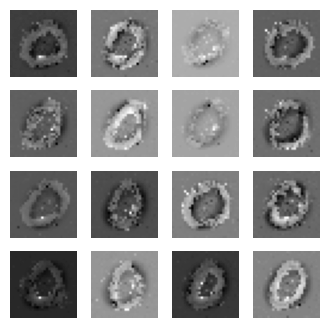

41
real_output: tf.Tensor(
[[1.750372 ]
 [2.2027864]
 [2.327766 ]
 [3.1907578]
 [3.2552125]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6473875]
 [-2.0448258]
 [-3.6480873]
 [-4.199823 ]
 [-3.000528 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4118786, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06973882, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06923334, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.612849 ]
 [4.44326  ]
 [4.8412046]
 [2.4777954]
 [3.4949243]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8791966]
 [-3.2481568]
 [-3.6095002]
 [-1.7805871]
 [-3.6729982]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.57581, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08026068, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09345133, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.8126707]
 [1.8662443]
 [1.0450191]
 [3.4878979]
 [1.3258058]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[

real_output: tf.Tensor(
[[1.7624531]
 [2.6515012]
 [3.6102378]
 [4.8952374]
 [2.4985623]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.499986 ]
 [-5.016861 ]
 [-4.4433107]
 [-3.4435337]
 [-3.6034832]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4588141, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.068450786, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06651695, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6956475]
 [3.770602 ]
 [3.5562537]
 [3.9876812]
 [3.8000405]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9013802]
 [-1.5200444]
 [-5.5701365]
 [-0.2406591]
 [-2.5417886]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4600673, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.073843636, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07247194, shape=(), dtype=float32)


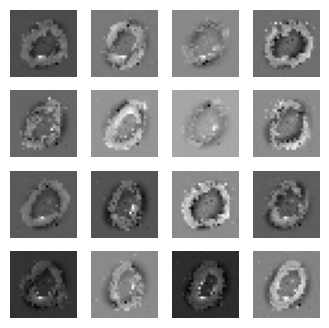

42
real_output: tf.Tensor(
[[3.341294 ]
 [3.4502716]
 [1.6249804]
 [2.380982 ]
 [1.8319683]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.1940346]
 [-5.4113045]
 [-4.2683434]
 [-3.4628754]
 [-2.645713 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4644308, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07326765, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06759806, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.48757  ]
 [1.4279017]
 [2.7111504]
 [1.7811115]
 [2.2998083]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.188798 ]
 [-3.0751364]
 [-5.4560175]
 [-3.4058604]
 [-3.3938296]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4172173, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06352267, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07611635, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.29384986]
 [ 3.4511085 ]
 [ 3.04638   ]
 [ 3.7774186 ]
 [ 4.2582555 ]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[2.3944857]
 [2.1724012]
 [2.957605 ]
 [2.0195706]
 [3.5163577]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1283956]
 [-3.539322 ]
 [-5.772165 ]
 [-2.9834015]
 [-2.59572  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5205095, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07319613, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07987575, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.891925 ]
 [2.4604874]
 [3.251416 ]
 [2.7208815]
 [2.9374948]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0179806]
 [-3.880528 ]
 [-1.7241304]
 [-5.2952647]
 [-2.2821064]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4733334, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.086525455, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.063370526, shape=(), dtype=float32)


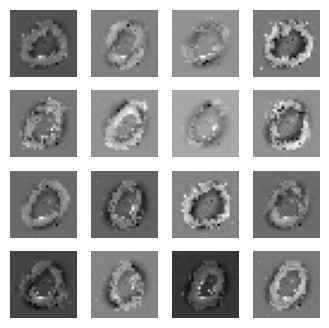

43
real_output: tf.Tensor(
[[2.88883  ]
 [2.4107437]
 [2.0024102]
 [2.7635071]
 [3.991754 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.2078147]
 [-4.234583 ]
 [-1.7709368]
 [-2.808268 ]
 [-2.5067677]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4522989, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0714446, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07469506, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.3438354]
 [2.8227246]
 [1.2415739]
 [2.4508903]
 [3.003517 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5368931]
 [-3.2507012]
 [-2.2146354]
 [-1.9356828]
 [-1.3775679]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.321587, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07853406, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09432817, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.520892 ]
 [2.6629827]
 [3.2561738]
 [2.8725998]
 [2.6549509]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[

real_output: tf.Tensor(
[[1.2047341]
 [1.4358008]
 [1.7459414]
 [1.6185875]
 [3.3922393]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9537916]
 [-6.104005 ]
 [-3.8080938]
 [-3.2629814]
 [-1.0468142]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3723648, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06307885, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0878592, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6470056 ]
 [4.877552  ]
 [3.331058  ]
 [0.11092658]
 [4.368932  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2360644]
 [-1.6854577]
 [-3.0463958]
 [-1.625217 ]
 [-5.221949 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3221297, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1354042, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10627376, shape=(), dtype=float32)


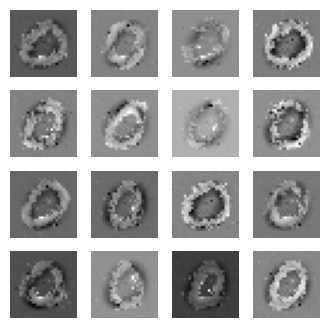

44
real_output: tf.Tensor(
[[3.157289 ]
 [3.8925376]
 [3.676367 ]
 [3.9983733]
 [1.7084299]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.67960143]
 [-3.898898  ]
 [-2.0578415 ]
 [-2.7203104 ]
 [-7.772985  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2852101, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06779228, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09479749, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.124823 ]
 [3.2672951]
 [3.9785829]
 [5.411088 ]
 [2.252164 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.1293578]
 [-1.4328305]
 [-1.3915666]
 [-4.4912167]
 [-4.6411657]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2978854, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08861389, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12934238, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.5350776]
 [2.744001 ]
 [2.8146248]
 [3.1818974]
 [3.6438541]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[2.840559 ]
 [2.39884  ]
 [3.099867 ]
 [2.4500377]
 [2.2890651]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.434694 ]
 [-4.211264 ]
 [-7.4687786]
 [-3.4372435]
 [-3.9802325]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4343905, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06481042, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07972009, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.662277 ]
 [1.7271017]
 [3.2967985]
 [3.4733915]
 [3.7827346]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4504225]
 [-3.652126 ]
 [-2.4018614]
 [-2.6126378]
 [-3.9552324]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.352302, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11730989, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08285886, shape=(), dtype=float32)


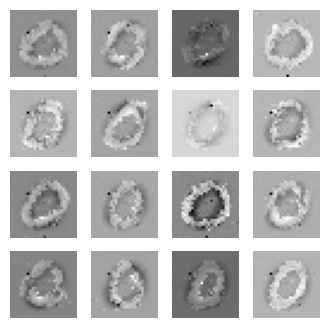

45
real_output: tf.Tensor(
[[3.2777257]
 [2.4258943]
 [4.4858456]
 [2.3934424]
 [2.0305517]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4212341]
 [-3.3148718]
 [-2.8533716]
 [-1.942716 ]
 [-4.09175  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2056627, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.052808158, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.092508584, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3110864]
 [3.2140045]
 [3.2454531]
 [1.6298716]
 [5.1895986]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4754088 ]
 [-2.6550539 ]
 [-0.33135825]
 [-5.549597  ]
 [-2.887568  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2399235, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.075499214, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.090057835, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7074466]
 [1.3832597]
 [4.504475 ]
 [4.4457297]
 [5.6541524]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[4.242343 ]
 [1.9098681]
 [3.5667481]
 [4.9577265]
 [4.0475016]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.0566506]
 [-6.0537457]
 [-2.1440213]
 [-6.1891203]
 [-3.5858734]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6311486, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06441725, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06726366, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6252673]
 [3.9654472]
 [4.496687 ]
 [1.9267356]
 [3.6784759]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9059079]
 [-3.6714556]
 [-3.999297 ]
 [-1.2275935]
 [-2.8591561]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4780772, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08610138, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07826843, shape=(), dtype=float32)


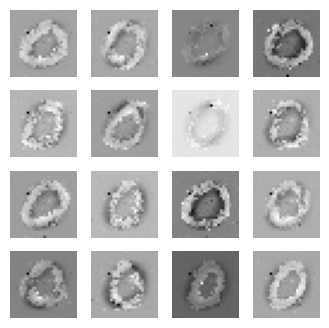

46
real_output: tf.Tensor(
[[1.9421816]
 [1.8770906]
 [3.768802 ]
 [1.9646164]
 [3.0816495]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1993723]
 [-4.0670123]
 [-2.4948432]
 [-2.1661608]
 [-4.581142 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5248966, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06815407, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.070534945, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1707714]
 [2.7593515]
 [2.871164 ]
 [2.9060972]
 [2.6986024]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1678886 ]
 [-5.416917  ]
 [-6.0527835 ]
 [-2.8129482 ]
 [-0.33084655]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.498768, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06329742, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07184409, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.0820208]
 [3.4847426]
 [3.4298158]
 [3.991244 ]
 [1.8715932]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[3.9443617]
 [4.0244265]
 [3.1477282]
 [4.2205715]
 [3.8789444]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.491449 ]
 [-4.18684  ]
 [-5.4027276]
 [-3.1653023]
 [-5.514201 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6630597, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06849384, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0752143, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.592798  ]
 [3.3932934 ]
 [4.114638  ]
 [0.09250355]
 [1.9421594 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.242621 ]
 [-2.516594 ]
 [-3.0953462]
 [-1.8018928]
 [-2.172712 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5343523, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09373052, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06832493, shape=(), dtype=float32)


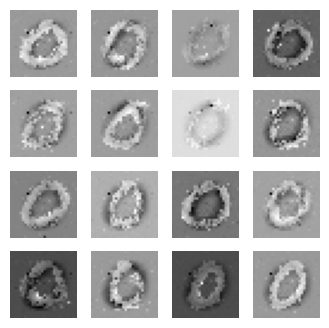

47
real_output: tf.Tensor(
[[3.314528 ]
 [4.007271 ]
 [2.6747267]
 [4.2939134]
 [4.1620755]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0852475]
 [-1.2015616]
 [-2.3596761]
 [-2.821943 ]
 [-0.7434716]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4982204, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05299174, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07566483, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.2065473]
 [3.355339 ]
 [2.9137065]
 [1.6430157]
 [3.9267414]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8196518]
 [-1.2484092]
 [-4.0925694]
 [-1.3016846]
 [-5.37857  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7033033, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06459889, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07069078, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5836365]
 [5.173244 ]
 [2.8185403]
 [2.3108032]
 [3.5588145]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[1.4617947]
 [2.527579 ]
 [4.21615  ]
 [4.1748934]
 [4.1901035]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-16.911095 ]
 [ -3.9083593]
 [ -3.9091437]
 [ -4.490927 ]
 [ -2.9356532]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5191631, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05190914, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0804108, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.466217 ]
 [ 3.9980643]
 [ 3.543691 ]
 [-2.1704879]
 [ 3.9057972]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ -3.7312884]
 [ -5.3188877]
 [-19.22562  ]
 [ -4.339753 ]
 [ -2.8495755]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.569777, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07173058, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08448409, shape=(), dtype=float32)


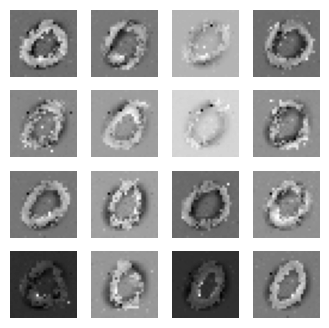

48
real_output: tf.Tensor(
[[4.044039 ]
 [2.3747125]
 [2.7887814]
 [3.5320084]
 [1.9720888]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-8.059749 ]
 [-4.189288 ]
 [-4.7154603]
 [-2.8795166]
 [-5.560172 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7767956, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.076646075, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0644836, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.31239  ]
 [3.4293492]
 [4.3062277]
 [4.4663534]
 [3.140083 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0038394]
 [-3.770944 ]
 [-1.3685533]
 [-1.6723498]
 [-3.546857 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.73991, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.05620087, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07866651, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7737973]
 [2.2786481]
 [3.5676534]
 [3.91669  ]
 [3.0720518]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[

real_output: tf.Tensor(
[[3.9678497]
 [3.4730027]
 [3.1436265]
 [2.3627203]
 [1.2504296]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.185187 ]
 [-2.7747934]
 [-7.8798184]
 [-3.5723522]
 [-2.690862 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5149179, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07536613, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06656644, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6925313]
 [1.0252289]
 [3.2535145]
 [2.2042158]
 [2.9943728]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9005485]
 [-3.3372104]
 [-3.3276205]
 [-2.9834979]
 [-4.142386 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5654206, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.077349745, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06433582, shape=(), dtype=float32)


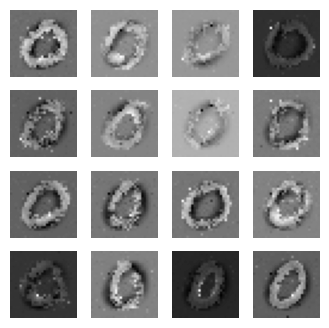

49
real_output: tf.Tensor(
[[2.3810484 ]
 [2.0580916 ]
 [1.9932686 ]
 [0.93305546]
 [4.0945897 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7299438]
 [-3.4611979]
 [-2.1140592]
 [-2.0967467]
 [-4.164963 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.445614, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0761006, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07300768, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3980469]
 [1.919506 ]
 [2.4881263]
 [1.8114599]
 [2.356804 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0334706]
 [-3.7264237]
 [-6.1314545]
 [-2.6064086]
 [-4.1312795]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6086507, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11936857, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.065267906, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3909491]
 [1.8699131]
 [3.1461012]
 [2.6154418]
 [3.2059615]], shape=(5, 1), dtype=float32)
fake_output: tf.Ten

real_output: tf.Tensor(
[[3.1681292]
 [1.7980747]
 [2.3533673]
 [3.889587 ]
 [2.7488773]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9116348]
 [-3.7392602]
 [-2.0545342]
 [-3.8622277]
 [-2.779618 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2480297, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.0649042, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08031697, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5105426]
 [2.070768 ]
 [4.2240562]
 [3.4259098]
 [3.408105 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.07309334]
 [-3.2651157 ]
 [-2.7956796 ]
 [-3.2207441 ]
 [-3.314192  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3747878, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10450515, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08939764, shape=(), dtype=float32)


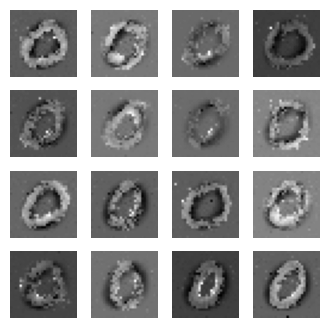

50
real_output: tf.Tensor(
[[2.4413257]
 [5.0328317]
 [2.3051147]
 [2.3664713]
 [4.3315635]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2873354]
 [-1.1842452]
 [-1.12716  ]
 [-3.1425996]
 [-3.2767396]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.314745, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.053535424, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08957786, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.442128  ]
 [0.99857163]
 [1.8717961 ]
 [2.9551191 ]
 [3.2805562 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0984561]
 [-2.432347 ]
 [-2.861652 ]
 [-2.6955125]
 [-2.4107394]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.433528, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.062281497, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.088772476, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2578945]
 [3.3428226]
 [3.439118 ]
 [2.0710402]
 [1.7194719]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[4.9047456]
 [2.7312267]
 [3.7053473]
 [1.8188355]
 [3.0599313]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1469197]
 [-5.6460886]
 [-3.2948515]
 [-3.5304751]
 [-3.914323 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.445221, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08011156, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08521365, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.544613 ]
 [2.4774847]
 [3.5432773]
 [3.1895895]
 [2.698226 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1951103]
 [-4.1385775]
 [-3.8072052]
 [-1.7585433]
 [-4.7631145]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2367566, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.065137774, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10473357, shape=(), dtype=float32)


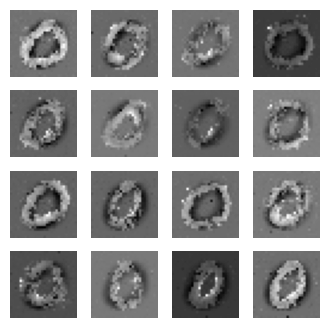

51
real_output: tf.Tensor(
[[1.1668209]
 [2.2631755]
 [6.613069 ]
 [3.2639775]
 [4.788301 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4679408]
 [-3.6868775]
 [-4.003445 ]
 [-2.4967887]
 [-4.4354568]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3010974, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.052133214, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10041946, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7156835]
 [4.2155356]
 [4.9852495]
 [3.6273942]
 [4.6984396]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.363699 ]
 [-2.2747028]
 [-1.9588273]
 [-3.700684 ]
 [-2.9420671]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1558247, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07703896, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13517466, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5579553]
 [1.9434417]
 [3.9336298]
 [5.998053 ]
 [6.9185185]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[3.513801 ]
 [3.2385216]
 [2.3752182]
 [4.4630356]
 [2.199018 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.859659 ]
 [-2.5869882]
 [-3.3389738]
 [-1.928826 ]
 [-4.4191146]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4928734, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08835168, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07822451, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0233884]
 [2.8667498]
 [2.7283802]
 [1.5049772]
 [2.760133 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2839799]
 [-3.4113097]
 [-2.7066767]
 [-3.082722 ]
 [-3.2537599]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.602633, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07362151, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08117049, shape=(), dtype=float32)


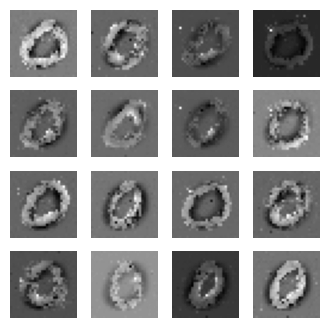

52
real_output: tf.Tensor(
[[3.2387488]
 [2.3567376]
 [2.3944068]
 [3.3675234]
 [2.4294627]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8961973]
 [-1.9832476]
 [-1.7259761]
 [-5.495432 ]
 [-2.9735372]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7310615, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11296618, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.0665992, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4756508 ]
 [4.859825  ]
 [3.6086726 ]
 [2.2510457 ]
 [0.97327125]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.4737916]
 [-4.2247205]
 [-4.1608243]
 [-3.1166582]
 [-3.1885834]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6442406, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.057810247, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07200873, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.094807 ]
 [3.797373 ]
 [1.1981096]
 [3.0986948]
 [1.9654598]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[2.9399488]
 [2.7463818]
 [3.6889815]
 [3.0703015]
 [0.897614 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2047472]
 [-2.965413 ]
 [-1.6171044]
 [-2.353354 ]
 [-6.340769 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5660396, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09704172, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.079623155, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6920301]
 [1.0283139]
 [2.5375326]
 [2.96514  ]
 [4.161884 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5573363]
 [-3.3657699]
 [-3.5098813]
 [-2.7136028]
 [-3.3631148]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3942485, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.077645354, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.08387304, shape=(), dtype=float32)


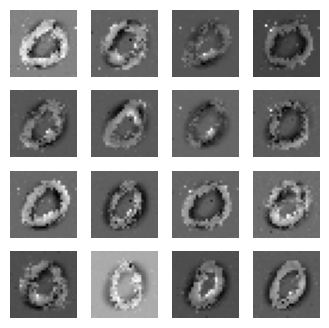

53
real_output: tf.Tensor(
[[2.55161  ]
 [3.0708106]
 [3.356088 ]
 [2.4761963]
 [2.6811132]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0651896]
 [-5.411499 ]
 [-3.6321797]
 [-3.4263625]
 [-4.0499163]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5340843, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.059941728, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06880583, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0822978]
 [3.0198116]
 [3.7792363]
 [0.9623288]
 [3.5019927]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.59769  ]
 [-4.0225997]
 [-3.5510626]
 [-3.5543914]
 [-2.4995942]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.356958, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06199313, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07318244, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2260854]
 [3.160632 ]
 [4.0363574]
 [4.761327 ]
 [2.7996817]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[4.7277503]
 [3.037164 ]
 [4.0042186]
 [3.4685292]
 [2.3174345]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1237268]
 [-3.0644028]
 [-2.7535305]
 [-3.2567723]
 [-5.579302 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.530594, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07990076, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09352733, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1200933]
 [3.793428 ]
 [3.9063394]
 [4.7091227]
 [4.538085 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.115264 ]
 [-4.23071  ]
 [-1.9244543]
 [-3.0261326]
 [-2.5294166]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5663867, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07202405, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.083227485, shape=(), dtype=float32)


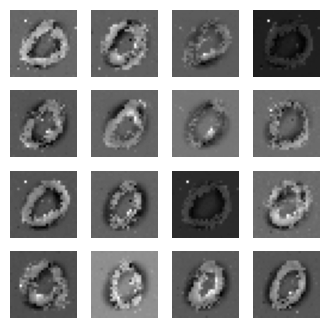

54
real_output: tf.Tensor(
[[2.158784 ]
 [3.4244297]
 [4.7378435]
 [4.2421246]
 [2.0349727]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1235435]
 [-2.440398 ]
 [-3.4921992]
 [-4.481175 ]
 [-4.6955376]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.545982, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.04985229, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07868709, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.1009355]
 [2.2420294]
 [2.8551128]
 [2.798371 ]
 [2.7560341]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.01979  ]
 [-3.2526543]
 [-2.2239692]
 [-3.8419309]
 [-1.8492849]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.7503262, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07485585, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07273399, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9375384]
 [2.4783692]
 [2.2817855]
 [3.634126 ]
 [3.933959 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[4.1573853]
 [2.8129916]
 [2.946256 ]
 [1.9892776]
 [1.787442 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.108875 ]
 [-3.6024249]
 [-3.0372565]
 [-6.134223 ]
 [-2.8785841]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6236067, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07305275, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06150143, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3129654]
 [1.8499842]
 [2.6280997]
 [3.4690669]
 [4.798845 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ -5.2666354]
 [-10.499582 ]
 [ -3.0474715]
 [ -2.0217063]
 [ -3.6616778]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6671078, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.083378255, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06314363, shape=(), dtype=float32)


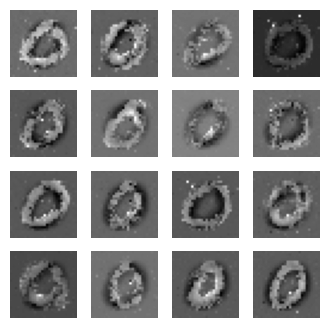

55
real_output: tf.Tensor(
[[2.5075433]
 [3.2091067]
 [2.8321133]
 [1.5309721]
 [1.5883442]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6983306]
 [-3.2897623]
 [-2.7320979]
 [-3.153381 ]
 [-3.3517349]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5147824, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.057040162, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.080715545, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4473016]
 [4.0429764]
 [4.8623815]
 [4.604747 ]
 [4.947928 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5625665]
 [-3.603821 ]
 [-2.3016834]
 [-3.8191898]
 [-5.689359 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.487186, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.04698065, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07188684, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9903123]
 [4.240661 ]
 [4.458304 ]
 [2.109556 ]
 [3.8992882]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[ 4.5510592 ]
 [ 3.327044  ]
 [-0.46742108]
 [ 0.6656832 ]
 [ 1.1844232 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.818384 ]
 [-1.7398833]
 [-1.9235275]
 [-5.037056 ]
 [-5.268136 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5294037, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10972021, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.12214419, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6399174]
 [3.4601376]
 [3.5533063]
 [3.4181488]
 [3.8254507]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.257824 ]
 [-5.3211393]
 [-2.2568083]
 [-6.582686 ]
 [-1.7801182]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5655403, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.068721876, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10268512, shape=(), dtype=float32)


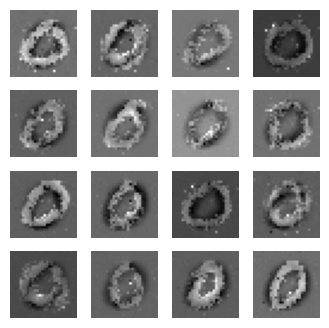

56
real_output: tf.Tensor(
[[3.3279386 ]
 [0.06595853]
 [2.858321  ]
 [2.6557794 ]
 [2.9423018 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.7621384]
 [-5.4768925]
 [-5.697374 ]
 [-2.0366416]
 [-3.0770817]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6128464, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10079143, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.072334714, shape=(), dtype=float32)
real_output: tf.Tensor(
[[6.7598557]
 [2.9107935]
 [3.0448117]
 [4.3781185]
 [2.7774355]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.0402427 ]
 [-2.1938722 ]
 [-1.7514676 ]
 [-2.9728832 ]
 [-0.09247056]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5105987, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.109407276, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10182378, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6847596]
 [5.319299 ]
 [3.7395225]
 [1.1744019]
 [4.3675833]], shape=(5, 1), dtype=float32)
fake_output

real_output: tf.Tensor(
[[2.7429454]
 [3.2020125]
 [0.8015272]
 [3.531052 ]
 [2.9322436]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2168047]
 [-3.8624494]
 [-3.0312312]
 [-0.9114352]
 [-3.3447156]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.589522, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09109819, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.077573955, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6488295]
 [1.6768388]
 [2.8171873]
 [3.008719 ]
 [2.5199876]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.602527 ]
 [-4.6325307]
 [-2.6464918]
 [-3.6668367]
 [-2.6637158]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6288333, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08577118, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.07619093, shape=(), dtype=float32)


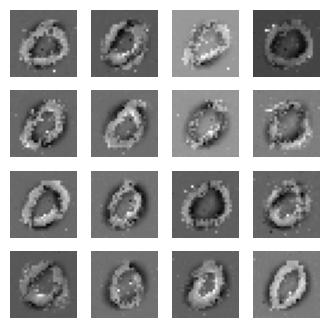

57
real_output: tf.Tensor(
[[1.8198111]
 [0.6114907]
 [1.5313398]
 [1.7200773]
 [1.1466053]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.5003943]
 [-3.8905528]
 [-3.1081645]
 [-3.955879 ]
 [-3.0390062]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.6211667, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11258874, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.06132343, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6066687]
 [4.8977804]
 [4.208324 ]
 [3.7656977]
 [2.5895562]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2185817]
 [-4.1807585]
 [-1.0216455]
 [-3.4794493]
 [-2.2088068]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4963374, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1050511, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.078532055, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6212423]
 [2.6944692]
 [2.0383801]
 [2.796246 ]
 [1.4068748]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[5.8024173]
 [4.0377812]
 [0.5911342]
 [3.3499405]
 [3.1383083]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-7.2295585]
 [-3.124199 ]
 [-2.669909 ]
 [-2.1083136]
 [-2.667393 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.469936, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.074226364, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10198062, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3575134]
 [2.2261715]
 [3.2674613]
 [1.0166078]
 [5.113136 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1969903]
 [-1.9658664]
 [-5.43231  ]
 [-2.6608646]
 [-1.0916442]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.5261571, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10281907, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09340273, shape=(), dtype=float32)


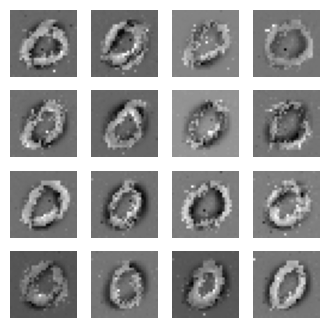

58
real_output: tf.Tensor(
[[2.11063  ]
 [4.550662 ]
 [2.4379349]
 [4.9534907]
 [2.245629 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.6200414]
 [-2.8694284]
 [-3.9386494]
 [-3.0747998]
 [-4.2336917]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.4712906, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09288151, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.082715765, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0293875]
 [2.613157 ]
 [3.2754145]
 [2.4481196]
 [3.3449197]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9881923 ]
 [-0.03542425]
 [ 1.1699929 ]
 [-3.5980277 ]
 [-2.3573568 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.3666608, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.070243835, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.121338695, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.668147 ]
 [2.800696 ]
 [4.0888495]
 [1.934457 ]
 [3.9941986]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[3.5925508]
 [2.9795341]
 [3.8670626]
 [2.5589912]
 [1.2074766]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.657053 ]
 [-4.250786 ]
 [-3.6678033]
 [-3.6286542]
 [-0.9466972]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.1394248, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.06661308, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.10375979, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.2875233]
 [3.0644197]
 [2.1111083]
 [5.579043 ]
 [2.7218041]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.3870177 ]
 [-4.358182  ]
 [-0.84109896]
 [-3.6183147 ]
 [-2.9223545 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.2049866, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07622893, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.09769736, shape=(), dtype=float32)


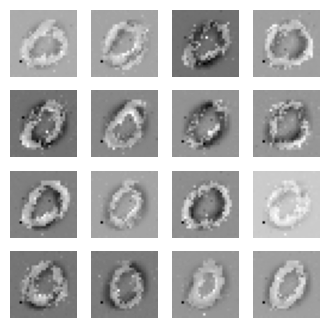

59
real_output: tf.Tensor(
[[2.4558654]
 [3.2271934]
 [4.202247 ]
 [3.6199465]
 [2.227756 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2297459]
 [-3.4528775]
 [-2.016874 ]
 [-1.6169406]
 [-0.0514283]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(3.0073073, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.068160325, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.119533114, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.912523 ]
 [1.0938079]
 [2.1121144]
 [3.6443918]
 [2.1627567]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4990695]
 [-0.5720872]
 [-1.0363292]
 [-1.7791239]
 [-2.3699625]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.935766, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.07800986, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13245708, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3172135]
 [0.66429  ]
 [3.1606445]
 [3.116049 ]
 [4.5546074]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[ 2.2312422 ]
 [ 1.5987377 ]
 [ 3.4418733 ]
 [ 1.9517738 ]
 [-0.39249885]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.24314462]
 [-3.90718   ]
 [-3.4305575 ]
 [-1.4704444 ]
 [-2.0346327 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.815957, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27920488, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15773016, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.281279  ]
 [3.7994509 ]
 [0.12008035]
 [0.7175039 ]
 [3.7049267 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8292036 ]
 [-0.587624  ]
 [-4.3692927 ]
 [-3.129118  ]
 [-0.98832977]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.830745, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17187653, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13334441, shape=(), dtype=float32)


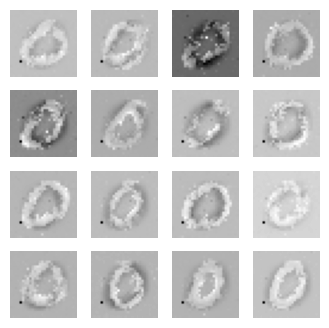

60
real_output: tf.Tensor(
[[ 5.3026676]
 [ 2.9082599]
 [ 2.3995183]
 [-4.1160097]
 [ 2.3711705]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5307464 ]
 [-1.7930582 ]
 [-4.2703524 ]
 [-0.49808526]
 [-2.251312  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5013227, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15095775, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19367732, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2886288]
 [2.8993065]
 [3.1150057]
 [2.316139 ]
 [3.8803074]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5211384 ]
 [-0.98447627]
 [-2.1788235 ]
 [ 0.36863822]
 [-1.2863532 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.581936, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.102947846, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18315352, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0449736]
 [1.6031481]
 [3.001082 ]
 [4.192945 ]
 [7.5324554]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[1.8454682]
 [1.8559285]
 [1.9503423]
 [2.1311889]
 [1.9362642]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.998135  ]
 [-2.3952997 ]
 [-0.37872526]
 [-0.23234472]
 [-2.1841142 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3400068, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20049328, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21212837, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6497219]
 [3.033014 ]
 [2.8225362]
 [3.2115977]
 [1.0815377]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2585816]
 [-2.557719 ]
 [-3.9078934]
 [-1.0803198]
 [-1.1680226]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3860903, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21908344, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19165449, shape=(), dtype=float32)


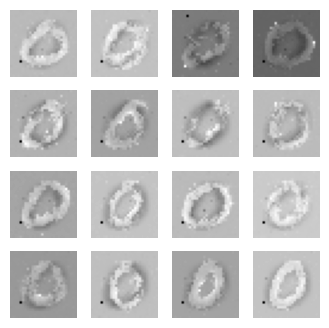

61
real_output: tf.Tensor(
[[2.0101783]
 [3.2522354]
 [1.2508115]
 [1.8284261]
 [1.8903846]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8515868]
 [-2.9482203]
 [-2.1644323]
 [-1.5242519]
 [-4.787697 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5648227, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1380345, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17262559, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5121987]
 [2.2953868]
 [2.0318904]
 [4.7009163]
 [3.1629531]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8380213 ]
 [-0.62986326]
 [-4.141138  ]
 [-1.9515826 ]
 [-3.7851748 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3546343, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16043445, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19179732, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.824631 ]
 [1.6056362]
 [2.9724393]
 [2.67051  ]
 [1.0392977]], shape=(5, 1), dtype=float32)
fake_output: tf.Ten

real_output: tf.Tensor(
[[0.83986276]
 [4.2914834 ]
 [1.983063  ]
 [0.94092816]
 [1.1408572 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.960479 ]
 [-1.1195575]
 [-1.9076025]
 [-1.3504709]
 [-3.3355153]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3874288, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21270269, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18981043, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9092865]
 [1.5845929]
 [3.2476087]
 [1.497853 ]
 [3.2730117]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5042224]
 [-2.6238708]
 [-1.7330246]
 [-1.9052156]
 [-2.0496924]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.506688, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14733204, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17009664, shape=(), dtype=float32)


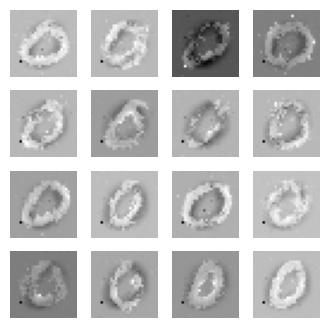

62
real_output: tf.Tensor(
[[3.159557 ]
 [2.0602012]
 [2.5331933]
 [1.709389 ]
 [2.5068939]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.632667 ]
 [-3.1091783]
 [-2.6275463]
 [-2.6470168]
 [-0.3765144]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6452923, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23304304, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17931393, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7172644]
 [1.9315139]
 [1.5154355]
 [2.6606257]
 [2.4432902]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.199223 ]
 [-2.4587421]
 [-4.2800183]
 [-3.8248744]
 [-3.6420138]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4847095, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18065745, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25785154, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3345928 ]
 [0.69888186]
 [3.9624426 ]
 [3.2605526 ]
 [2.3259163 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[4.6054506]
 [4.40683  ]
 [2.206181 ]
 [1.4188726]
 [2.0853374]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2289302]
 [-0.629996 ]
 [-1.3692075]
 [-1.1993431]
 [-3.8496685]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2046483, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17210835, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2725859, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8297865]
 [1.2600927]
 [2.645006 ]
 [0.8038132]
 [3.2108166]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.41763276]
 [-1.0754706 ]
 [-1.3506987 ]
 [-2.9769974 ]
 [-1.6581713 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.560038, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30406708, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19703731, shape=(), dtype=float32)


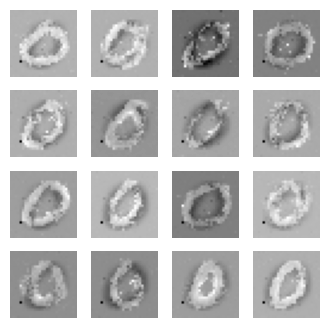

63
real_output: tf.Tensor(
[[1.6918317]
 [1.1289665]
 [2.4202054]
 [2.9642043]
 [3.540652 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.080737  ]
 [-5.278866  ]
 [-0.59775573]
 [-5.3432136 ]
 [-2.3895257 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5627947, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1890059, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16711536, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.566991 ]
 [2.2120388]
 [1.7829627]
 [3.7954948]
 [2.5060287]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.4636774]
 [-3.2680764]
 [-2.3022423]
 [-2.6879635]
 [-2.4643075]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.444683, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16280717, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17156902, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-2.2271442]
 [ 1.8750266]
 [ 1.5206245]
 [ 0.4173662]
 [ 2.9019668]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[2.5140421]
 [3.7464485]
 [2.1834903]
 [2.6901925]
 [2.8443258]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4375057 ]
 [-3.2285514 ]
 [-2.532278  ]
 [-0.91650784]
 [-3.7770102 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.442141, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19284183, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19905473, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3549184]
 [0.6096973]
 [5.705242 ]
 [4.6866   ]
 [1.7724301]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9475126 ]
 [-1.5024947 ]
 [-1.2981075 ]
 [ 0.18634158]
 [-0.6250449 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5119, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.35090607, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2310834, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6370327]
 [3.2536573]
 [3.9415047]
 [2.2915041]
 [1.316324 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

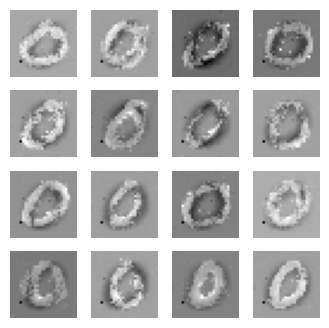

64
real_output: tf.Tensor(
[[2.9641876]
 [1.9236174]
 [3.1625454]
 [3.2126598]
 [1.4526798]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2525582 ]
 [ 0.2033728 ]
 [-3.6521504 ]
 [-3.3053596 ]
 [-0.38621166]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4688075, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14915179, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22297221, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.3404784]
 [3.1151576]
 [4.657375 ]
 [3.2423146]
 [3.1313694]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.917431  ]
 [-1.6535109 ]
 [-0.51394343]
 [-2.7242463 ]
 [-0.31313044]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4417157, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18224949, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20786735, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.550285 ]
 [2.6501918]
 [2.6850128]
 [2.0960932]
 [1.4603806]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[3.0163867]
 [0.6172202]
 [2.1528723]
 [4.2602944]
 [1.8031558]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.16392547]
 [-0.32412702]
 [-4.0920415 ]
 [-2.94292   ]
 [-0.12998313]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4981465, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22494332, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1926971, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4199326]
 [2.688606 ]
 [3.044689 ]
 [3.7285411]
 [0.4841125]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4542205]
 [-2.9169781]
 [-1.911823 ]
 [-3.385369 ]
 [-2.4091003]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4203439, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17724347, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19018297, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3310983]
 [3.783595 ]
 [1.5674154]
 [1.1618341]
 [2.925132 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

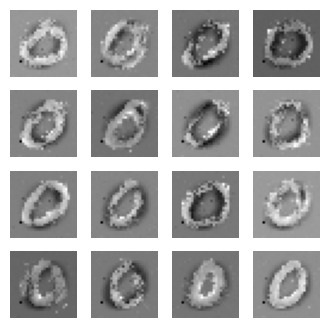

65
real_output: tf.Tensor(
[[1.5324636]
 [1.3095691]
 [1.0168679]
 [1.3713503]
 [2.711149 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4172454]
 [-1.0473901]
 [-6.346221 ]
 [-2.2440693]
 [-3.1499808]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5495389, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1583949, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16273975, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4960105]
 [2.964362 ]
 [1.7339373]
 [0.8922473]
 [1.0967628]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.61658883]
 [-3.3883412 ]
 [-2.5574567 ]
 [-1.8883735 ]
 [-2.696385  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4253042, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18459292, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1876219, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.8925515 ]
 [ 2.0459404 ]
 [-1.0894701 ]
 [ 2.996121  ]
 [ 0.78915405]], shape=(5, 1), dtype=float32)
fake_outpu

real_output: tf.Tensor(
[[3.3129158 ]
 [2.1935074 ]
 [2.138119  ]
 [0.89276373]
 [3.8966548 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.24280699]
 [-1.5385457 ]
 [-2.2999    ]
 [-3.8735418 ]
 [-1.534124  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3772292, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20185432, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20898539, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.60353607]
 [ 1.8505132 ]
 [ 3.0539465 ]
 [ 2.381226  ]
 [ 2.0323257 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.14412224]
 [-0.85548913]
 [-2.4252238 ]
 [-3.025457  ]
 [-2.740804  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1935143, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1977949, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21380405, shape=(), dtype=float32)


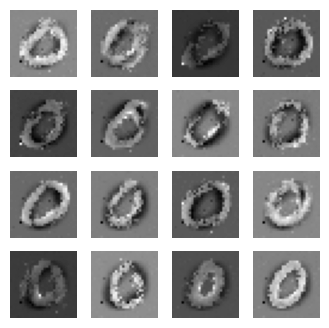

66
real_output: tf.Tensor(
[[0.24419346]
 [2.6228516 ]
 [2.6658368 ]
 [2.2718062 ]
 [2.2330775 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3649677]
 [-1.0995276]
 [-4.0158143]
 [-1.990362 ]
 [-1.793182 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4194152, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16025276, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26350892, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.9983373]
 [3.124448 ]
 [1.6075937]
 [1.317659 ]
 [2.7803366]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.7071314 ]
 [-1.1490886 ]
 [-0.60205054]
 [ 0.31729704]
 [-0.33354598]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4158192, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11414263, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21528377, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2893754]
 [3.537909 ]
 [2.2729392]
 [3.4253192]
 [1.6521071]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[1.7915398]
 [2.9502645]
 [2.448285 ]
 [2.0441077]
 [1.8330779]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1222584]
 [-2.8359554]
 [-1.7080299]
 [-2.59145  ]
 [-3.1800487]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3035305, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16407254, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17247486, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.6720916 ]
 [ 1.288334  ]
 [-0.97963655]
 [ 1.2754444 ]
 [ 2.8534105 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5433931 ]
 [-0.05407486]
 [-7.8270955 ]
 [-1.2276932 ]
 [-1.9112847 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9807143, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1631979, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2696389, shape=(), dtype=float32)


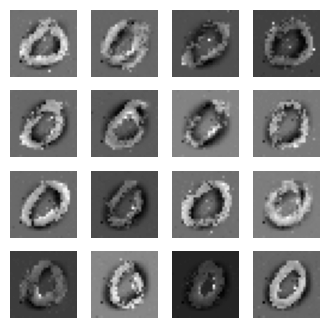

67
real_output: tf.Tensor(
[[2.6480184 ]
 [2.8078437 ]
 [0.53712755]
 [1.3368278 ]
 [1.5906674 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.05375187]
 [-2.2948165 ]
 [-2.3799512 ]
 [-2.948469  ]
 [-1.2686342 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.242421, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2515525, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2121475, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5605251]
 [3.2550035]
 [1.1320148]
 [1.9317648]
 [2.116394 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.789283  ]
 [-3.1447163 ]
 [-1.7217624 ]
 [ 0.70309764]
 [-4.3860397 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1498885, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12458828, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24856432, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.2184649 ]
 [ 3.052322  ]
 [ 4.1583076 ]
 [ 2.902844  ]
 [-0.11735757]], shape=(5, 1), dtype=float32)
f

real_output: tf.Tensor(
[[1.7824143]
 [3.119612 ]
 [1.9448481]
 [1.8545481]
 [2.028103 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8140364]
 [-3.1044836]
 [-0.5485841]
 [-0.5271119]
 [-2.81269  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.092536, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19592528, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23707354, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.82087296]
 [1.4120768 ]
 [0.34917617]
 [2.4077847 ]
 [1.1586008 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.022465 ]
 [-5.663372 ]
 [-2.7270439]
 [-0.1339399]
 [-1.3606951]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2785802, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18604772, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18501005, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9987116]
 [3.4518626]
 [3.6154947]
 [3.5046635]
 [1.7837429]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

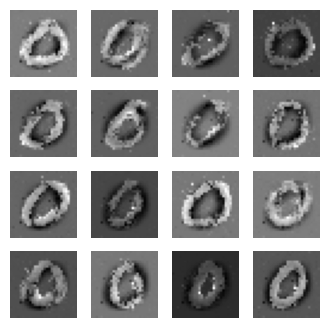

68
real_output: tf.Tensor(
[[-0.06667969]
 [-0.05009732]
 [ 1.6520996 ]
 [ 0.19625965]
 [ 2.1310391 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.151587 ]
 [-1.4422086]
 [-1.7785757]
 [-4.784815 ]
 [-1.9231217]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3606272, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20152228, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18206587, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.163283 ]
 [2.71385  ]
 [1.2509809]
 [2.5807953]
 [2.2119226]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.636555 ]
 [-2.0324996]
 [-0.3015166]
 [-2.4485106]
 [-3.3832886]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3752725, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17169544, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17626175, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7174293]
 [1.571031 ]
 [1.7944654]
 [1.8237556]
 [1.4474086]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[3.210295 ]
 [1.2351694]
 [1.1520257]
 [3.0648081]
 [2.1975162]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.67304116]
 [-3.129546  ]
 [-1.1078537 ]
 [-0.37786752]
 [-0.13545042]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1341872, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18351272, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22277904, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8345015]
 [2.761159 ]
 [2.741692 ]
 [2.7816205]
 [4.3211484]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.815406 ]
 [-3.3986611]
 [-3.4288623]
 [-1.0662612]
 [-2.034187 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3319936, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22310896, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19034168, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2067174]
 [2.86516  ]
 [4.5289116]
 [2.9107673]
 [3.0654516]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

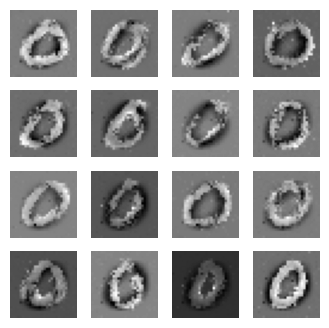

69
real_output: tf.Tensor(
[[1.2860379]
 [0.711025 ]
 [3.8394375]
 [2.852837 ]
 [2.8709674]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3176156]
 [-1.9737046]
 [-1.3673964]
 [-2.655255 ]
 [-1.580015 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2081537, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16777802, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21184784, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7697859]
 [1.5554655]
 [3.3016121]
 [2.7705686]
 [1.4695059]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.213253  ]
 [-0.03453912]
 [-2.5328677 ]
 [-1.2452385 ]
 [-4.4723845 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.376511, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2121848, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22500215, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4809098]
 [1.8347925]
 [3.5421033]
 [1.1811258]
 [2.4199994]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

real_output: tf.Tensor(
[[0.48523834]
 [3.3089576 ]
 [1.5810547 ]
 [1.0196564 ]
 [2.1525185 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.28808543]
 [-1.0736332 ]
 [-2.247136  ]
 [-0.1253083 ]
 [-5.7738237 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0929127, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20595855, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23349807, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.5406299 ]
 [ 3.8547473 ]
 [ 0.3659535 ]
 [-0.47008556]
 [ 1.3684237 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.0182457]
 [-2.557948 ]
 [-6.343855 ]
 [-1.4871311]
 [-2.4724798]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0609162, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24082392, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2566734, shape=(), dtype=float32)


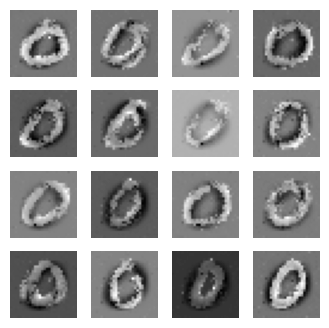

70
real_output: tf.Tensor(
[[ 2.0363476 ]
 [ 2.3407245 ]
 [ 4.66034   ]
 [ 2.7542531 ]
 [-0.19489282]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4008119]
 [-4.472714 ]
 [-2.2492125]
 [-0.1261819]
 [-3.0122306]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2393684, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21835461, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21835373, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5880568 ]
 [-0.17286624]
 [ 1.8269004 ]
 [ 2.0204504 ]
 [ 3.6762097 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2642344]
 [-2.8440006]
 [-2.4068456]
 [-2.7622173]
 [-0.4424085]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.303341, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16681243, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19597909, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.93276423]
 [1.3891003 ]
 [1.090697  ]
 [2.194015  ]
 [1.7506986 ]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[ 1.7859619 ]
 [ 1.6882716 ]
 [ 2.72989   ]
 [-0.30958304]
 [ 1.6815006 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8241136]
 [-1.1088575]
 [-3.4308498]
 [-1.012045 ]
 [-2.7662601]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2923255, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2660616, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21706618, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.793934  ]
 [2.2608476 ]
 [0.98373365]
 [2.9455307 ]
 [4.197085  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5552554]
 [-0.5765445]
 [-5.1881185]
 [-1.1741201]
 [-2.653692 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2386084, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18344223, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2054173, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2006761]
 [2.205832 ]
 [2.9923131]
 [1.5728755]
 [1.1968356]], shape=(5, 1), dtype=float32)
fake_output: 

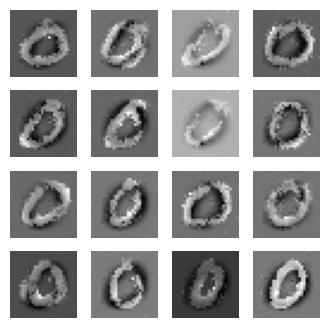

71
real_output: tf.Tensor(
[[2.399711 ]
 [2.4464343]
 [1.230865 ]
 [2.3637688]
 [1.6343713]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.58614564]
 [-2.2209988 ]
 [-1.5000341 ]
 [-1.1414804 ]
 [-2.543802  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.168594, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20314783, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24974549, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.3513157 ]
 [ 2.709692  ]
 [-0.77534086]
 [ 0.7610323 ]
 [ 2.674361  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.0453353]
 [-2.0539582]
 [-2.0138142]
 [-0.4893053]
 [-3.464537 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2460647, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19042616, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23073581, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0115874]
 [3.646884 ]
 [4.5241604]
 [2.4354696]
 [0.5962018]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[1.8836778 ]
 [0.40619123]
 [2.0084739 ]
 [0.92075443]
 [1.2463113 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.107552 ]
 [-1.8283483]
 [-3.5212874]
 [-2.4082983]
 [-4.4501   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.486843, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28640908, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1682547, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.779052 ]
 [-0.9307303]
 [ 1.6586692]
 [ 0.9985269]
 [ 1.7285355]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5026566]
 [-2.4941874]
 [-3.685729 ]
 [-3.2582986]
 [-2.9959536]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5608425, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25551432, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14712119, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.17865148]
 [ 2.5384526 ]
 [ 1.8898752 ]
 [-0.50984997]
 [ 1.9597533 ]], shape=(5, 1), dtype=float32)
fake_out

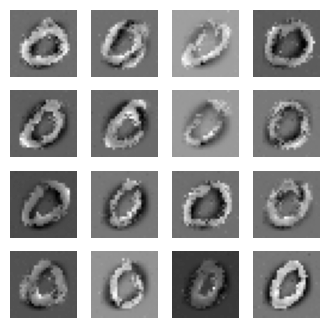

72
real_output: tf.Tensor(
[[4.0100355]
 [2.2939868]
 [1.8043039]
 [3.9234076]
 [3.3764248]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.75956887]
 [-4.230307  ]
 [-2.8322353 ]
 [-2.090241  ]
 [-1.5194268 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.234026, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14244938, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22860956, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.3903327]
 [1.8134296]
 [3.6113389]
 [1.8919365]
 [1.8558211]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9614894]
 [-1.2437627]
 [-3.4759674]
 [-4.7720976]
 [-4.0891747]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5444262, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25443807, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20696646, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0991511]
 [1.6091045]
 [1.5019653]
 [3.7092052]
 [0.9693765]], shape=(5, 1), dtype=float32)
fake_output: tf.Ten

real_output: tf.Tensor(
[[4.269041 ]
 [2.5015616]
 [5.1508446]
 [1.2795228]
 [3.2762423]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.394377 ]
 [-1.1119777]
 [-2.8579814]
 [-1.1439291]
 [-2.2457254]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3392568, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18317747, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22100028, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2984945]
 [2.9743454]
 [1.5478654]
 [2.725314 ]
 [2.4878542]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.31537834]
 [ 0.20649806]
 [-2.4934947 ]
 [-1.9204322 ]
 [-4.7980423 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3972456, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19600233, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23493727, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.178424  ]
 [ 2.9749453 ]
 [ 3.7487545 ]
 [-0.13335064]
 [-0.04473379]], shape=(5, 1), dtype=float32)
fake_output

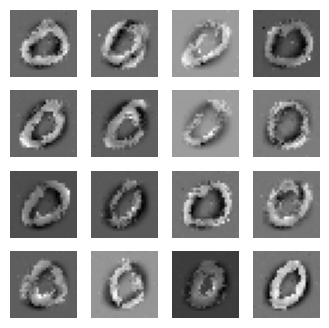

73
real_output: tf.Tensor(
[[3.0451322]
 [2.1066966]
 [2.7433865]
 [3.338273 ]
 [2.495455 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8008368]
 [-4.392394 ]
 [-3.2641487]
 [-4.003165 ]
 [-2.870231 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5019455, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20211557, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2138173, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1229739]
 [0.5437746]
 [1.5729492]
 [1.8217235]
 [1.7881126]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8913178]
 [-5.292602 ]
 [-0.7107285]
 [-1.1470773]
 [-1.7861309]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5249872, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24459562, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21696576, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5282564]
 [3.1192439]
 [2.0181286]
 [1.8092067]
 [4.2441583]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


real_output: tf.Tensor(
[[1.6692947]
 [2.2292373]
 [3.5894024]
 [0.4022851]
 [6.2472644]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.72577345]
 [-3.1400309 ]
 [-1.351002  ]
 [-2.6991937 ]
 [-1.9251814 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2461514, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14176483, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19916245, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.7890399]
 [ 3.6742523]
 [ 2.1267445]
 [-1.0286976]
 [ 1.3784741]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.4410990e+00]
 [-2.5307527e+00]
 [-8.1776991e-02]
 [-1.7170426e+00]
 [ 1.6488247e-03]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2268639, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2540214, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31671673, shape=(), dtype=float32)


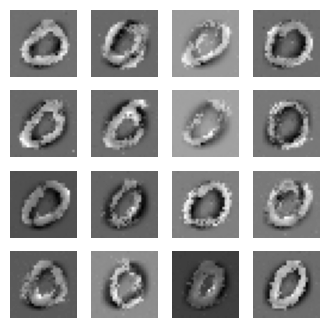

74
real_output: tf.Tensor(
[[2.7322502]
 [3.3281758]
 [1.8800492]
 [2.975632 ]
 [1.8319918]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.35078883]
 [-1.2041825 ]
 [-1.9471351 ]
 [-0.76092494]
 [ 0.3263359 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2383823, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15305884, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26525337, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2308632]
 [1.043653 ]
 [3.1004758]
 [2.8818958]
 [4.0680127]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0805874 ]
 [ 4.055874  ]
 [-1.4205141 ]
 [-2.0776377 ]
 [-0.76070833]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1928687, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13557763, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24341139, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.1696873 ]
 [ 1.6519157 ]
 [-0.31842428]
 [ 1.8918189 ]
 [ 4.3637276 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[ 2.5750163 ]
 [ 3.3165476 ]
 [-0.54742134]
 [ 4.0420876 ]
 [ 2.6381912 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.30072898]
 [-1.0582744 ]
 [-1.7031947 ]
 [ 0.81883126]
 [-2.9787898 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.333559, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19277528, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2684383, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7007866 ]
 [3.5907207 ]
 [0.36129442]
 [0.03853909]
 [5.5283146 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.99036604]
 [-2.2878327 ]
 [-0.69833   ]
 [-2.206388  ]
 [-3.4243138 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4977543, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3715366, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24317102, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.65833193]
 [ 1.4931388 ]
 [ 1.0763216 ]
 [ 1.7514436 ]
 [ 0.93181175]], shape=(5, 1), dtype=flo

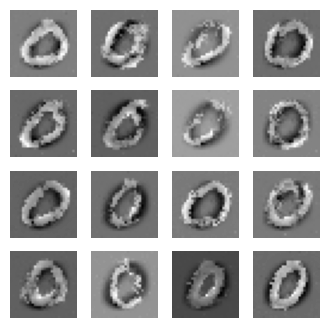

75
real_output: tf.Tensor(
[[1.3334316 ]
 [2.4751313 ]
 [2.7249546 ]
 [0.18952514]
 [1.1669986 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-8.667469 ]
 [-2.267643 ]
 [-2.08739  ]
 [-3.966804 ]
 [-0.8284799]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3122592, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23293443, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2617777, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.424815  ]
 [ 1.9576403 ]
 [ 2.424261  ]
 [-0.09402378]
 [ 2.6324956 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4901425]
 [-1.5197413]
 [ 0.0655071]
 [-5.582032 ]
 [-3.0316372]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1663978, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2116535, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3368441, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3805931]
 [2.2407732]
 [1.6196338]
 [2.064452 ]
 [1.4362626]], shape=(5, 1), dtype=float32)
fake_output

real_output: tf.Tensor(
[[-1.1077354]
 [ 2.7930717]
 [ 1.5579963]
 [ 3.1423962]
 [ 0.9261281]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.1615944]
 [-2.892036 ]
 [-1.1894611]
 [-3.0918846]
 [-1.5908191]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.406725, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2860121, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1944766, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-1.1019354]
 [ 1.4158828]
 [ 1.1958774]
 [ 1.1980622]
 [ 0.9378073]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.733913 ]
 [-2.9519906]
 [-1.6161928]
 [-2.8838997]
 [-1.3265884]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0604115, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22605574, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2508073, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.533823 ]
 [1.4633212]
 [2.8902457]
 [3.8691168]
 [1.9960383]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

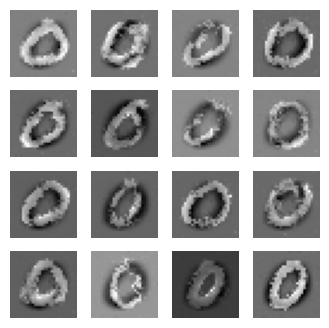

76
real_output: tf.Tensor(
[[2.4738345]
 [2.591915 ]
 [2.9172485]
 [1.8086889]
 [3.8295262]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5856938]
 [-2.9453633]
 [-4.0385356]
 [-1.8887049]
 [-1.3106933]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1735315, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18010318, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22959343, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-1.4146612]
 [ 3.2450092]
 [ 2.7787244]
 [ 0.6009146]
 [ 2.3996623]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4483044 ]
 [-1.2253935 ]
 [-1.849606  ]
 [-0.66513205]
 [-0.6950176 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3433113, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20307302, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2103076, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2449632]
 [1.9501492]
 [0.7293938]
 [2.4171069]
 [1.6204854]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[2.6481574]
 [2.0276322]
 [1.2110023]
 [3.194524 ]
 [2.1397576]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6275034]
 [-2.8702044]
 [-3.3589602]
 [-2.4737606]
 [-2.3021119]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.116373, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21769765, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26107568, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.9455829]
 [1.6643133]
 [1.8865857]
 [2.8055325]
 [1.8145946]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0020041]
 [-0.9612524]
 [-1.8043817]
 [-2.0928776]
 [-3.6916924]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0832932, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2001073, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22623149, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9430952]
 [1.8999069]
 [3.1292887]
 [2.0587132]
 [3.8536003]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0

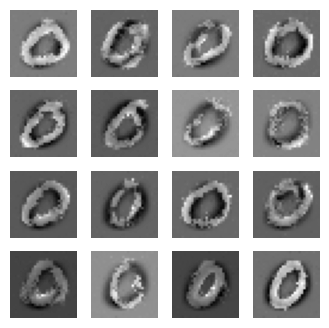

77
real_output: tf.Tensor(
[[3.3121479]
 [2.1144676]
 [0.4840806]
 [2.0320334]
 [3.006334 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9001185 ]
 [ 0.89853525]
 [ 0.02200272]
 [-4.1009874 ]
 [-1.971926  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1011605, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17100152, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24477905, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.7363602 ]
 [ 1.8715813 ]
 [ 0.09187795]
 [ 1.7671459 ]
 [-0.74402785]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.98591   ]
 [-0.39935324]
 [-0.9832423 ]
 [-2.6153526 ]
 [-0.29758486]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2224393, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19650201, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2123601, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.651356 ]
 [1.6272113]
 [1.766858 ]
 [2.5773418]
 [2.0284348]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[0.9347089 ]
 [0.17497213]
 [0.27374044]
 [3.0087454 ]
 [3.0079863 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.033575 ]
 [-2.4446428]
 [-1.4033147]
 [-1.0588738]
 [-1.3112997]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2637234, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.35177967, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19032066, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.3415372 ]
 [4.6007442 ]
 [0.54619783]
 [0.75205666]
 [2.1205354 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6380851]
 [-2.204929 ]
 [-2.677723 ]
 [-1.730086 ]
 [-2.7223802]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.148069, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23313421, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25191098, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.95396936]
 [1.8237447 ]
 [2.9071484 ]
 [1.5107752 ]
 [0.33785093]], shape=(5, 1), dtype=float32)
fake_output:

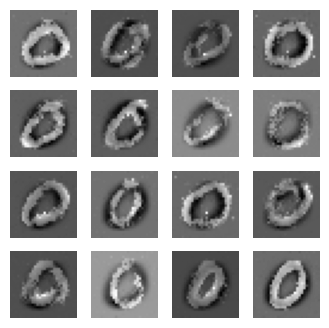

78
real_output: tf.Tensor(
[[2.311409 ]
 [2.3717756]
 [2.188335 ]
 [1.8315614]
 [2.755696 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.038257 ]
 [-3.203417 ]
 [-2.3414812]
 [-2.3682768]
 [-1.9226743]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1736183, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18288994, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2264167, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6583817 ]
 [2.7110412 ]
 [0.07184195]
 [2.255293  ]
 [3.077638  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.28309667]
 [-1.8032446 ]
 [-1.9775177 ]
 [-1.5084153 ]
 [-1.6245354 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9885749, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19786403, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2873931, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7648945]
 [1.0542945]
 [2.0471635]
 [2.5427873]
 [3.0005925]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[1.4821323]
 [2.3307545]
 [2.1114461]
 [1.6407999]
 [1.025331 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6729627 ]
 [ 0.02421425]
 [-2.7187507 ]
 [-2.9123745 ]
 [-1.6198803 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2574983, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19466758, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21018136, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7482624]
 [2.3471403]
 [2.1581511]
 [3.136709 ]
 [1.4095287]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.17827834]
 [-3.302205  ]
 [-1.7495692 ]
 [-2.6167042 ]
 [-3.0556958 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2114956, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17434192, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20170987, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.7182557 ]
 [2.7579014 ]
 [1.8829203 ]
 [0.6960742 ]
 [0.92400616]], shape=(5, 1), dtype=float32)
fake_output

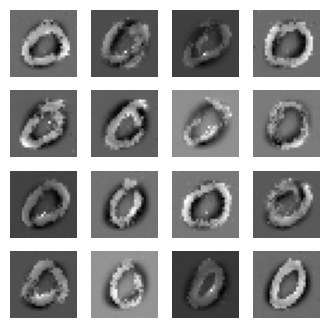

79
real_output: tf.Tensor(
[[1.9612908 ]
 [0.94464856]
 [2.160956  ]
 [3.2116973 ]
 [1.9620423 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0415766]
 [-4.5115123]
 [-2.6268508]
 [-5.0452385]
 [-3.0109012]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3136613, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19254015, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19802427, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8903555 ]
 [0.94435215]
 [1.9520826 ]
 [2.0580893 ]
 [2.9054136 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1489563]
 [-1.2564268]
 [-2.4178004]
 [-0.9288235]
 [-0.1823852]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9696795, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13428412, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.277358, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1693535]
 [2.7176807]
 [1.6196991]
 [2.8689556]
 [3.2899015]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[1.9456139]
 [2.409104 ]
 [1.8307537]
 [1.4876599]
 [0.9781998]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.212715  ]
 [-1.0799792 ]
 [-2.6943781 ]
 [ 0.62895054]
 [-2.023736  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.931634, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14969246, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2567593, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5428848]
 [3.5563917]
 [0.8130759]
 [3.189231 ]
 [2.725256 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4842205]
 [-3.9397256]
 [-0.5826205]
 [-2.7909763]
 [-2.774495 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0908885, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17773753, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23885071, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.555996 ]
 [1.737959 ]
 [1.0263147]
 [1.9025686]
 [2.0452416]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

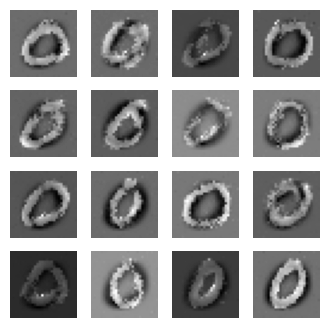

80
real_output: tf.Tensor(
[[3.424432  ]
 [3.004247  ]
 [1.6027912 ]
 [1.7872847 ]
 [0.17535627]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.764952 ]
 [-1.6021997]
 [-0.8883747]
 [-2.063298 ]
 [-0.9297321]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2341266, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15351835, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20607087, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.3878932 ]
 [ 1.389008  ]
 [-0.43406016]
 [ 3.4778156 ]
 [ 2.1249745 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.7557228 ]
 [-3.042117  ]
 [-3.28798   ]
 [-1.0745598 ]
 [-0.42364544]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1539335, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19778891, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24692973, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3371757 ]
 [0.8639306 ]
 [2.0928602 ]
 [2.385296  ]
 [0.88405514]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[1.1299261]
 [1.710299 ]
 [2.2220063]
 [2.0282676]
 [3.0689707]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7757542 ]
 [-1.3457854 ]
 [-1.4352436 ]
 [-0.78243494]
 [-1.5031128 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1758683, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21274655, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25432903, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8633174]
 [1.1950753]
 [2.5065413]
 [2.7911825]
 [3.5644364]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6277205]
 [-0.9482072]
 [-2.4363387]
 [-1.4106807]
 [-1.1182083]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3212354, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2486323, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17505015, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0206711 ]
 [1.498436  ]
 [1.8129617 ]
 [1.0785953 ]
 [0.07915957]], shape=(5, 1), dtype=float32)
fake_output: tf.T

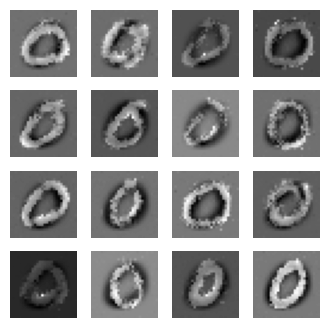

81
real_output: tf.Tensor(
[[1.4653713]
 [1.1699694]
 [1.9358749]
 [1.6859697]
 [2.8605583]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0027233 ]
 [-2.453842  ]
 [-0.08304735]
 [-0.32735047]
 [-1.8192778 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2016103, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2576447, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19129062, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5721872]
 [2.9044902]
 [2.4776986]
 [4.364785 ]
 [1.186872 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1918786 ]
 [-1.6644223 ]
 [-2.760879  ]
 [-0.75274336]
 [-1.9115908 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.226305, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21162787, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19558331, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8690459]
 [2.1672466]
 [2.8875875]
 [1.6318048]
 [2.7831903]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[3.8011901]
 [2.7192698]
 [3.1049678]
 [2.4558895]
 [2.713719 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5917536]
 [-1.1172082]
 [-2.1073158]
 [-1.5732174]
 [-1.5085351]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0670815, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19631998, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2420208, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8525367]
 [1.8007371]
 [3.0027783]
 [0.987507 ]
 [1.7843304]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0300064 ]
 [-1.3108468 ]
 [-2.9216075 ]
 [-0.74206114]
 [-3.0885875 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1916404, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21581998, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2325323, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2040044]
 [2.3511095]
 [0.6850108]
 [2.0817869]
 [2.0615644]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

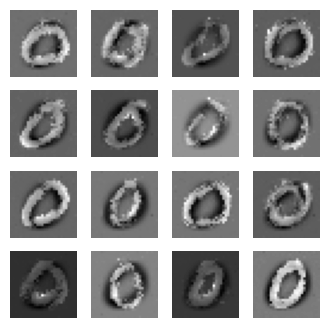

82
real_output: tf.Tensor(
[[ 2.7998261 ]
 [ 0.55404335]
 [ 2.7547867 ]
 [ 2.4321575 ]
 [-0.11683097]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1059127]
 [-2.8995974]
 [-2.5080683]
 [-1.5526232]
 [-1.932164 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1946144, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18785596, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22478524, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2772849 ]
 [0.15523314]
 [2.091696  ]
 [1.6670591 ]
 [0.24096048]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.4309101]
 [-5.889071 ]
 [-2.5239532]
 [-2.1523001]
 [-1.6212367]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0718672, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18962602, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24065463, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8310724 ]
 [0.07428695]
 [2.3107126 ]
 [0.22779919]
 [0.7637595 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[1.7906927]
 [1.5055093]
 [2.094326 ]
 [2.7874124]
 [3.1119616]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.42982954]
 [-2.1833353 ]
 [-1.9282814 ]
 [ 1.8729781 ]
 [-0.66937697]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0216668, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16310501, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27216005, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8527794]
 [2.2011786]
 [2.9984183]
 [0.8756932]
 [2.2855544]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.396491  ]
 [ 0.32697728]
 [-0.51874685]
 [-2.6374912 ]
 [-4.001967  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1926227, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15897718, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24396086, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.062821 ]
 [2.4177685]
 [1.3307651]
 [2.8968887]
 [2.195967 ]], shape=(5, 1), dtype=float32)
fake_output: tf.

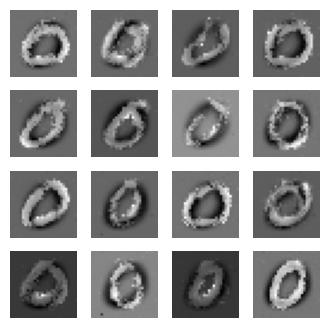

83
real_output: tf.Tensor(
[[1.9799914]
 [1.0692697]
 [2.4198685]
 [1.284068 ]
 [1.8993707]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.850574 ]
 [-2.5204144]
 [-1.5553434]
 [-0.5367724]
 [-3.1206808]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.329469, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28487164, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18396664, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8017026]
 [2.414434 ]
 [1.8390825]
 [3.8327763]
 [4.101434 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.796976 ]
 [-2.5968876]
 [-2.8412516]
 [-5.25388  ]
 [-2.4029706]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4370818, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1466383, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17956957, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.8586783]
 [1.8884811]
 [0.7124321]
 [3.0492594]
 [2.5132964]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[

real_output: tf.Tensor(
[[ 2.1511471 ]
 [ 0.28244558]
 [ 3.0091622 ]
 [ 1.217132  ]
 [-2.6328657 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3641771 ]
 [-0.12272509]
 [-1.2955503 ]
 [-3.7993498 ]
 [-3.4252765 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2755365, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3176488, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20918867, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.8227921 ]
 [0.12828997]
 [2.2741225 ]
 [2.133505  ]
 [0.846981  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9996717 ]
 [-3.7409928 ]
 [-2.7293816 ]
 [-2.0756109 ]
 [-0.80650455]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1267967, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17631522, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24667053, shape=(), dtype=float32)


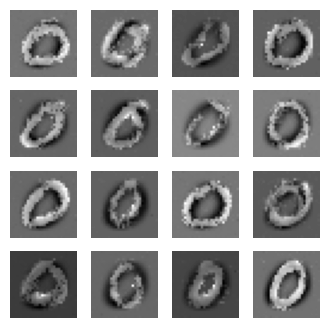

84
real_output: tf.Tensor(
[[3.1644835]
 [2.7297277]
 [2.7435403]
 [4.607422 ]
 [1.6417814]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9081392 ]
 [-1.1021466 ]
 [ 0.07351066]
 [-1.0832677 ]
 [-2.0822062 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.079505, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1532928, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23921339, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2817209 ]
 [3.3785276 ]
 [1.493019  ]
 [1.2651033 ]
 [0.17191948]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.149583  ]
 [-4.182496  ]
 [-2.7272227 ]
 [ 0.7689105 ]
 [-0.50953674]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.265293, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21610852, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19545367, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.496522  ]
 [ 2.131391  ]
 [-0.25527298]
 [ 3.8255706 ]
 [ 2.1630144 ]], shape=(5, 1), dtype=float32)
f

real_output: tf.Tensor(
[[1.7543063]
 [3.4800758]
 [1.7998319]
 [2.0872738]
 [1.4606714]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.09884275]
 [-0.52406716]
 [ 0.30596423]
 [-2.9907722 ]
 [-2.2280312 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2420325, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23028168, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2428303, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.38729092]
 [1.5034811 ]
 [2.5649416 ]
 [1.6498587 ]
 [1.5251982 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8168736]
 [-1.6770219]
 [-0.9977565]
 [-1.5372801]
 [-1.6058235]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2409196, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31028825, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23173012, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.7115958]
 [1.2047466]
 [1.7867945]
 [2.9296024]
 [3.3319218]], shape=(5, 1), dtype=float32)
fake_output: tf.T

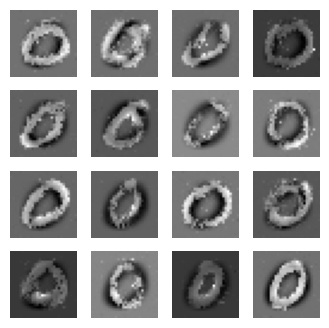

85
real_output: tf.Tensor(
[[ 1.9803032 ]
 [-0.10053764]
 [ 1.9357554 ]
 [ 0.22876105]
 [ 0.120483  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3582019 ]
 [-0.7330257 ]
 [ 0.32942328]
 [-2.465778  ]
 [-5.3866467 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1394913, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3020307, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23407444, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8489954]
 [3.835601 ]
 [1.1481647]
 [2.5545256]
 [3.0337155]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9416547]
 [-2.5394773]
 [-1.6747389]
 [-4.816138 ]
 [-1.2928292]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2208652, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19693616, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22438505, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.80367917]
 [0.6737126 ]
 [0.59708387]
 [1.1898164 ]
 [0.21352999]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[2.2302678]
 [1.3811282]
 [1.322174 ]
 [3.44877  ]
 [1.5635124]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1360242 ]
 [-0.07903978]
 [-2.169531  ]
 [-1.3262213 ]
 [-2.0293634 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0284486, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19170414, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25101107, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4216478 ]
 [2.8599792 ]
 [1.5162305 ]
 [0.22922544]
 [2.8451366 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.178155  ]
 [-1.3850546 ]
 [-0.04506619]
 [-0.6935609 ]
 [-6.053359  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4064422, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20262116, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20488942, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.8710747 ]
 [ 1.570752  ]
 [ 1.2412997 ]
 [ 0.5989182 ]
 [-0.24372289]], shape=(5, 1), dtype=float32)
f

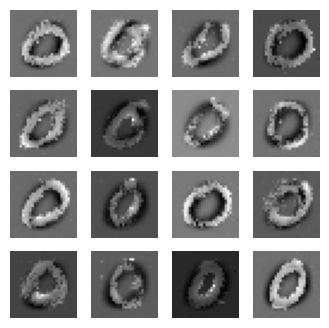

86
real_output: tf.Tensor(
[[ 1.6441222]
 [-0.8076732]
 [ 2.656236 ]
 [ 2.4573188]
 [ 2.1630836]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9431868]
 [-3.593309 ]
 [-2.5734043]
 [ 0.0173932]
 [-5.3838778]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2407308, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19378111, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2276558, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.54539394]
 [ 2.8355324 ]
 [ 1.7080499 ]
 [-1.098207  ]
 [ 1.177015  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6925904]
 [-2.3031137]
 [-1.7746888]
 [-2.9059095]
 [-2.3978503]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3281727, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23280302, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1827224, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4868848 ]
 [1.0365427 ]
 [0.85935444]
 [2.3745542 ]
 [1.1261946 ]], shape=(5, 1), dtype=float32)
fake_

real_output: tf.Tensor(
[[2.968085 ]
 [1.1393114]
 [2.8709116]
 [1.4036458]
 [1.3411748]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7369497]
 [-0.9673717]
 [-1.0073862]
 [-0.7324492]
 [-1.6520734]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1785424, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22207451, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22162098, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.2915583 ]
 [2.2844863 ]
 [2.8910537 ]
 [3.0740256 ]
 [0.92483133]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3513808 ]
 [-0.23472336]
 [-0.69527584]
 [-3.027749  ]
 [-2.0334868 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.015379, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2100752, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25498182, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2606851]
 [2.8031797]
 [2.011928 ]
 [1.8375162]
 [1.4560286]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

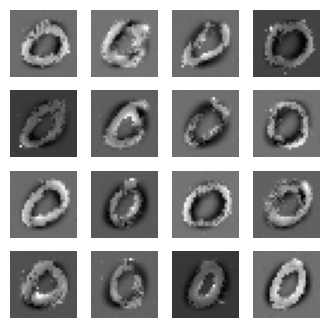

87
real_output: tf.Tensor(
[[ 0.6590984]
 [-0.9102491]
 [ 2.6828275]
 [ 1.3588185]
 [ 2.0025501]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1369922 ]
 [-0.75042945]
 [-0.51555514]
 [-2.952814  ]
 [-1.6139156 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1757922, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3299529, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26550388, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.3227672]
 [1.0270971]
 [2.4805484]
 [1.41768  ]
 [1.340431 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7390692]
 [-3.1732104]
 [-6.7137203]
 [-2.620532 ]
 [-0.8334119]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1106815, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1807591, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26475865, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6906208 ]
 [0.9110417 ]
 [0.3526521 ]
 [0.29969683]
 [2.3015382 ]], shape=(5, 1), dtype=float32)
fake_outpu

real_output: tf.Tensor(
[[0.6545535]
 [3.1174173]
 [1.7235339]
 [0.8600909]
 [1.7883611]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5764356]
 [ 2.9819634]
 [-1.3335285]
 [-3.8958905]
 [-3.5052273]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0731244, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23729253, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23614016, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5981293]
 [3.194109 ]
 [3.8365288]
 [2.0909042]
 [1.7208098]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0755677]
 [-1.029749 ]
 [-1.0716636]
 [-3.5294414]
 [-2.6538663]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0987272, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24588972, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29598075, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.188999  ]
 [4.74811   ]
 [1.9963033 ]
 [0.24479504]
 [2.5484009 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

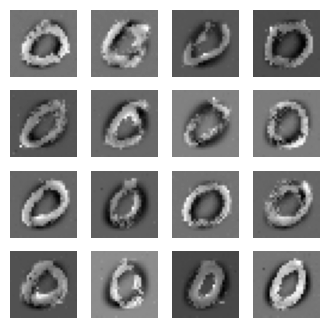

88
real_output: tf.Tensor(
[[0.26287398]
 [4.3346124 ]
 [1.3922619 ]
 [3.3058667 ]
 [1.7432952 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9099593]
 [-2.333774 ]
 [-1.8887864]
 [-4.633954 ]
 [-4.188411 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2161527, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21240342, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25734788, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.5722697]
 [1.0899291]
 [2.4035027]
 [3.2717702]
 [1.9807463]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.13000062]
 [-2.2444475 ]
 [-3.85669   ]
 [-0.72273636]
 [-2.0780509 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2189372, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27107275, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22011217, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.2271857 ]
 [ 2.1290855 ]
 [-0.21760693]
 [ 0.31621894]
 [ 3.8560176 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[3.730659 ]
 [2.2343345]
 [2.7588887]
 [2.9308622]
 [1.7266935]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5461657 ]
 [-4.2694464 ]
 [-3.9839165 ]
 [-0.28449154]
 [-0.39243126]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1052256, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20276639, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2935452, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9579308]
 [3.3900516]
 [0.4398491]
 [1.6188769]
 [1.6755716]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.58664   ]
 [-0.93574363]
 [-0.31872872]
 [-4.3895082 ]
 [-2.247114  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0699468, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2287929, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26748934, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.6057365 ]
 [ 1.0048939 ]
 [ 2.6168013 ]
 [-0.30199322]
 [ 0.28425533]], shape=(5, 1), dtype=float32)
fake_out

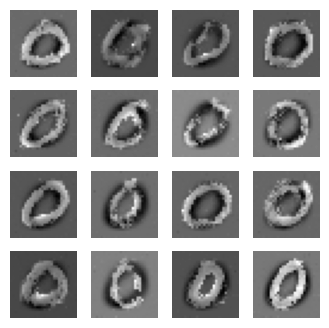

89
real_output: tf.Tensor(
[[3.6248472]
 [2.6159942]
 [2.9393845]
 [1.470167 ]
 [2.3017294]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8592136]
 [-1.2816427]
 [-2.541543 ]
 [-2.341897 ]
 [ 0.9654968]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3147233, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24661547, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22924703, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4860678]
 [2.8661075]
 [0.8470243]
 [1.4700317]
 [0.9406484]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5732392 ]
 [-0.300717  ]
 [-2.7167912 ]
 [-0.69978464]
 [-1.4582802 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3056545, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22527623, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19628513, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.370771 ]
 [1.8589922]
 [1.8116559]
 [2.1548264]
 [1.5903171]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[1.3349376]
 [2.276317 ]
 [2.0939538]
 [1.7117913]
 [0.7504127]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3719504]
 [-0.9064127]
 [-2.3149514]
 [-2.5700023]
 [-2.312739 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0580964, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2633659, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2577861, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.563788  ]
 [1.2551472 ]
 [0.7995084 ]
 [0.15254854]
 [1.0574741 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0044723 ]
 [-1.8051841 ]
 [-1.552948  ]
 [-1.8024807 ]
 [-0.52090997]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0278687, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19131702, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25658646, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.387638  ]
 [1.4912058 ]
 [2.106988  ]
 [0.18007326]
 [2.5197372 ]], shape=(5, 1), dtype=float32)
fake_output: 

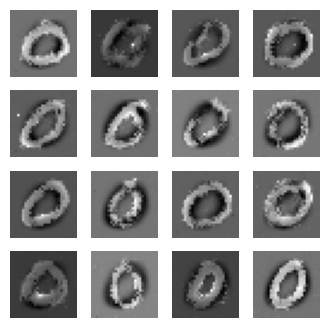

90
real_output: tf.Tensor(
[[4.394493  ]
 [1.3589057 ]
 [0.39756984]
 [3.296404  ]
 [1.5989735 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1813834]
 [-2.2146811]
 [-1.8735353]
 [-1.9331442]
 [-1.8659126]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4109948, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18872404, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19078125, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.9912405 ]
 [0.38716343]
 [2.2394688 ]
 [1.0919878 ]
 [1.3869734 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.297507 ]
 [-3.519667 ]
 [-4.0845623]
 [-2.0243971]
 [-3.0538597]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5662596, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29798707, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1754682, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.3620324]
 [ 1.4345188]
 [ 2.1681209]
 [ 0.9794912]
 [-0.623424 ]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[0.37721375]
 [1.4865643 ]
 [2.6727543 ]
 [1.6284198 ]
 [0.4172062 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.286061 ]
 [-2.5900578]
 [-0.5634221]
 [-0.7073449]
 [-2.5002742]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2635937, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20286426, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23499629, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1353133]
 [1.598164 ]
 [2.3072567]
 [1.6481106]
 [3.782365 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1054633 ]
 [-0.53247225]
 [-1.8153287 ]
 [-2.4444895 ]
 [-0.28011462]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.233725, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25810176, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21919298, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.8983191 ]
 [ 1.5106422 ]
 [ 0.5843109 ]
 [-0.44502735]
 [ 0.3876642 ]], shape=(5, 1), dtype=float32)
fake_ou

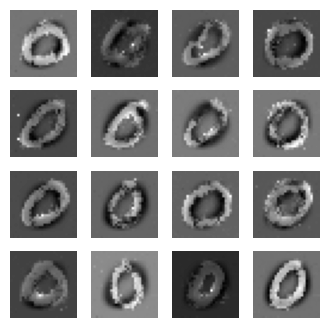

91
real_output: tf.Tensor(
[[2.281213 ]
 [2.6260626]
 [1.0818685]
 [2.357013 ]
 [1.0529045]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5861341]
 [-1.5193495]
 [-1.5140189]
 [-2.8200452]
 [-1.701973 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.286598, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23068315, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21087638, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9612018]
 [2.057283 ]
 [2.2609441]
 [3.0777524]
 [2.5750494]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5491955 ]
 [-1.1622555 ]
 [ 0.2112909 ]
 [-0.7401644 ]
 [-0.85057473]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.079349, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23289424, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2751113, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9897512 ]
 [2.6011066 ]
 [2.502057  ]
 [1.5375172 ]
 [0.46145755]], shape=(5, 1), dtype=float32)
fake_output: tf.

real_output: tf.Tensor(
[[ 0.7384593 ]
 [ 0.98778135]
 [-0.52791363]
 [ 1.0354288 ]
 [ 2.454682  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0515485]
 [-1.9588342]
 [-2.5696135]
 [-3.502365 ]
 [-2.576585 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0913672, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21253544, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2373048, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5079894 ]
 [-1.5284019 ]
 [ 2.5827613 ]
 [ 3.775401  ]
 [ 0.85375905]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3175044 ]
 [-1.9116604 ]
 [-4.369557  ]
 [ 0.07417297]
 [ 1.3972654 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2842054, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29089168, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26060832, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.360131  ]
 [ 1.9382308 ]
 [-0.08990861]
 [ 0.72603416]
 [ 1.5305947 ]], shape=(5, 1), dtype=f

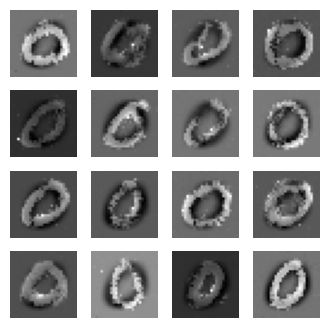

92
real_output: tf.Tensor(
[[1.1476476]
 [2.581127 ]
 [1.718303 ]
 [1.2493094]
 [0.6931274]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.577409 ]
 [-3.9823072]
 [-3.451967 ]
 [-2.53237  ]
 [-2.7700558]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.056058, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25932422, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27234572, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.7772648 ]
 [ 0.00936374]
 [-0.21450195]
 [ 2.321288  ]
 [-0.01051804]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1897496 ]
 [-0.63239866]
 [-4.5316033 ]
 [-0.9181745 ]
 [-0.6510095 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1457753, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25499588, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25699216, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.73304135]
 [2.7287087 ]
 [3.996912  ]
 [4.178918  ]
 [3.8312259 ]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[2.7022934]
 [3.335748 ]
 [2.607718 ]
 [0.9336567]
 [1.3819253]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9244852 ]
 [-1.4022503 ]
 [-1.7152119 ]
 [-0.74327075]
 [-2.0124228 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2338073, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24571936, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24713334, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.7529078]
 [2.539056 ]
 [1.7162719]
 [1.5157648]
 [1.6675358]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.2273855 ]
 [ 0.3592698 ]
 [-3.1846821 ]
 [-2.5204513 ]
 [ 0.10796778]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3429675, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21229154, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24477404, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1143959 ]
 [3.468708  ]
 [0.33284718]
 [3.9966724 ]
 [2.0153325 ]], shape=(5, 1), dtype=float32)
fake_output

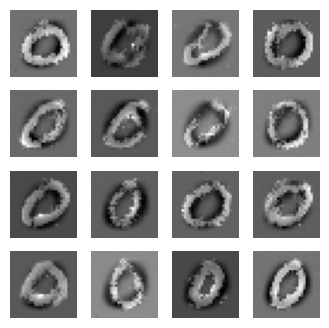

93
real_output: tf.Tensor(
[[2.6056042]
 [2.2433238]
 [1.1017355]
 [2.627461 ]
 [1.3018801]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7765656 ]
 [-1.9778218 ]
 [-0.8787829 ]
 [ 0.28985673]
 [ 0.00864415]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1026177, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15587124, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23899683, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1556396]
 [2.1918108]
 [1.0866337]
 [1.9318905]
 [2.9843225]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-10.176574  ]
 [ -2.8951685 ]
 [ -3.3294923 ]
 [  0.32542443]
 [ -0.06310297]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3762703, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19061841, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19532701, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5892668]
 [0.8542251]
 [4.2723994]
 [1.8250645]
 [3.170967 ]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[-2.9500241 ]
 [ 1.4034021 ]
 [ 2.4769156 ]
 [-0.95663095]
 [ 3.0294032 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1027505]
 [-1.3209503]
 [-2.3083389]
 [-2.0670855]
 [-2.809544 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2114253, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.38974035, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28797668, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.12410158]
 [ 1.6902285 ]
 [ 1.5282083 ]
 [ 0.5788186 ]
 [ 0.4137364 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9080188]
 [-2.5843444]
 [-1.1335762]
 [-2.9399858]
 [-3.3891416]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0872405, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37876245, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26930022, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7016578]
 [3.651267 ]
 [2.4763267]
 [3.7544901]
 [5.7169304]], shape=(5, 1), dtype=float32)
fake_o

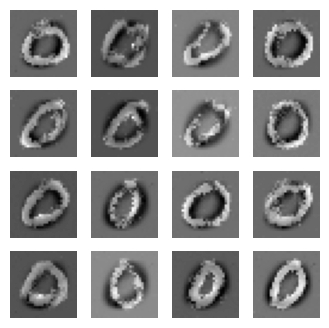

94
real_output: tf.Tensor(
[[-0.16239771]
 [ 1.5000281 ]
 [ 2.728833  ]
 [ 3.3358853 ]
 [-0.7939786 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3840516]
 [ 0.2841038]
 [-3.5664551]
 [-4.739469 ]
 [-2.1924086]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1476545, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28567332, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2649113, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2798445]
 [0.6422296]
 [2.1254718]
 [0.2371295]
 [1.9772618]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5999868]
 [-3.536626 ]
 [-3.517659 ]
 [-5.289638 ]
 [-2.75931  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3757463, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.341333, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22790757, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5883334]
 [1.1555911]
 [2.9974444]
 [2.1290984]
 [1.0436699]], shape=(5, 1), dtype=float32)
fake_output: tf.

real_output: tf.Tensor(
[[2.2385607 ]
 [1.3431925 ]
 [0.40429646]
 [1.1169703 ]
 [2.3310332 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3782332 ]
 [-0.4479664 ]
 [-0.07036465]
 [ 0.26736742]
 [-0.24526364]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2826424, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25581878, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21776813, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2117329]
 [2.4374585]
 [0.2674051]
 [2.5990217]
 [2.2157743]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.48725396]
 [-1.1162395 ]
 [-0.83039445]
 [-0.6855773 ]
 [-1.615185  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2230158, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23086652, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25060576, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9714377]
 [3.1232982]
 [0.4734977]
 [3.0330098]
 [4.6092567]], shape=(5, 1), dtype=float32)
fake_output

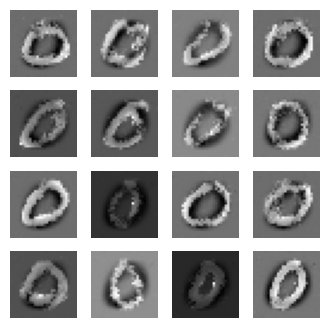

95
real_output: tf.Tensor(
[[1.9517788]
 [2.0938377]
 [3.1378179]
 [2.304028 ]
 [1.712833 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.009904  ]
 [-3.622069  ]
 [-3.3022585 ]
 [-0.54903287]
 [-3.0876403 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0799298, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1609919, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25806588, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6868348 ]
 [0.42235306]
 [5.2142277 ]
 [1.7800063 ]
 [1.9513353 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8336555 ]
 [-2.8448408 ]
 [ 1.4109888 ]
 [-3.2458622 ]
 [-0.13149689]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2745886, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2731744, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23760945, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1440253 ]
 [4.4198217 ]
 [0.77186716]
 [2.7468038 ]
 [1.7810154 ]], shape=(5, 1), dtype=float32)
fake_

real_output: tf.Tensor(
[[2.1499765]
 [2.5375042]
 [3.2115777]
 [1.6901293]
 [1.4834027]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7627677 ]
 [-2.7553039 ]
 [-0.16940032]
 [-4.2282844 ]
 [-2.231599  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0782073, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17652419, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.268798, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4165347]
 [4.448817 ]
 [1.6631918]
 [2.7600627]
 [4.1957135]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.052222  ]
 [-5.62266   ]
 [-4.2716556 ]
 [-0.09004192]
 [-1.6969969 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1195276, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29240805, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29562384, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4881818]
 [3.2982402]
 [4.7081575]
 [2.404225 ]
 [0.9873806]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

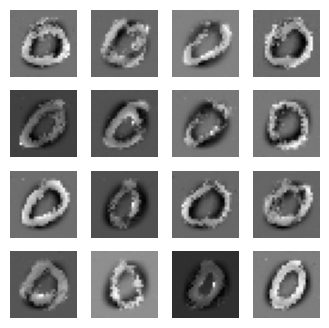

96
real_output: tf.Tensor(
[[ 2.9282887 ]
 [-0.05015261]
 [ 3.9283729 ]
 [ 2.260305  ]
 [ 3.7256975 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7432988]
 [-0.8657556]
 [-4.8614554]
 [-2.3327537]
 [-1.624545 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2673593, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18718341, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23731747, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2385644]
 [1.5820789]
 [4.2801175]
 [1.4320815]
 [1.8359587]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.058541 ]
 [-4.239297 ]
 [-2.4812858]
 [-0.8114841]
 [-0.6198559]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3248382, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19620466, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23283085, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.7048297]
 [4.2194166]
 [1.7446761]
 [2.966517 ]
 [0.6947963]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[3.5846932]
 [1.3890448]
 [1.4091011]
 [1.9141079]
 [1.7588009]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6408523]
 [-2.2433221]
 [-3.0479057]
 [-1.4324139]
 [-1.090474 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1735294, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21387339, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2341089, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.1422698 ]
 [ 1.9858742 ]
 [-0.08597824]
 [ 0.8182261 ]
 [-0.29054594]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6699554 ]
 [-2.6275175 ]
 [-1.2667278 ]
 [-0.06811664]
 [-2.6845853 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3364906, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3040897, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20169781, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 4.7986603 ]
 [ 3.5371592 ]
 [ 3.669791  ]
 [ 2.1327438 ]
 [-0.16675103]], shape=(5, 1), dtype=float32)
fak

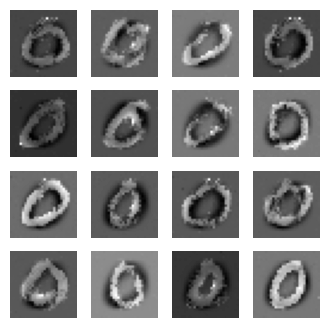

97
real_output: tf.Tensor(
[[1.880474 ]
 [1.3772095]
 [0.0464324]
 [2.7447515]
 [1.5404562]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0980285 ]
 [-2.2379866 ]
 [-2.6782045 ]
 [-0.71160275]
 [-1.2730482 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0971642, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22740677, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2585282, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.18211102]
 [ 0.8387761 ]
 [ 2.0597866 ]
 [ 1.5727253 ]
 [-0.54724526]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0176764 ]
 [-1.2554039 ]
 [ 0.56132567]
 [ 2.348796  ]
 [-1.0809188 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0696423, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24906854, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28311068, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.047165  ]
 [-0.69426095]
 [ 2.8613818 ]
 [ 1.4467915 ]
 [ 1.169825  ]], shape=(5, 1), dtype=flo

real_output: tf.Tensor(
[[-0.36224008]
 [ 1.4163467 ]
 [ 1.7102154 ]
 [ 2.0354335 ]
 [ 1.8539811 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8394704]
 [-6.6377034]
 [-1.1701349]
 [-2.1451268]
 [-2.4526758]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.222443, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24807455, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23742387, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.34804073]
 [ 4.252061  ]
 [ 4.0151477 ]
 [ 3.0687175 ]
 [-0.33293825]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.225103 ]
 [-1.9315859]
 [-1.0249869]
 [-1.7448004]
 [-2.1559408]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.382594, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.323785, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21799421, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0343443 ]
 [0.49771675]
 [2.3604715 ]
 [1.8544921 ]
 [1.5362244 ]], shape=(5, 1), dtype=float32)
fake_

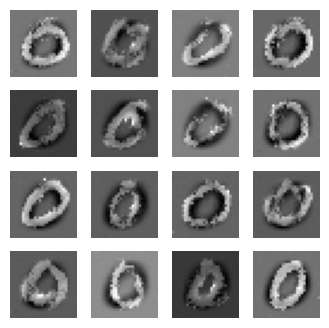

98
real_output: tf.Tensor(
[[1.5763782]
 [3.595235 ]
 [1.2041799]
 [2.951906 ]
 [2.084083 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.129503 ]
 [-2.5886762]
 [-0.3983382]
 [-1.6424899]
 [-2.217788 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.372901, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34576845, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18102652, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.08435903]
 [ 2.63985   ]
 [ 2.1465733 ]
 [ 2.449933  ]
 [ 2.3046587 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.44117916]
 [-3.0275571 ]
 [-2.8358033 ]
 [-4.356749  ]
 [-3.5252125 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.228047, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21291533, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2678324, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.07483324]
 [2.8868897 ]
 [4.400798  ]
 [0.42524013]
 [3.8439934 ]], shape=(5, 1), dtype=float32)
fake_o

real_output: tf.Tensor(
[[1.6229348]
 [2.0928144]
 [2.486926 ]
 [1.7433541]
 [2.3505025]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.207928  ]
 [-0.43767542]
 [-2.5752277 ]
 [-0.23783071]
 [-0.52644926]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1130102, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18927507, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25009182, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2600758]
 [2.6872113]
 [3.179917 ]
 [0.3660699]
 [3.1967843]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.8674521 ]
 [-1.9993311 ]
 [-1.5563542 ]
 [-0.36444974]
 [-2.3624368 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1569958, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20275348, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23569569, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5287344]
 [0.8247082]
 [1.7427764]
 [1.2713004]
 [1.904331 ]], shape=(5, 1), dtype=float32)
fake_output: tf.

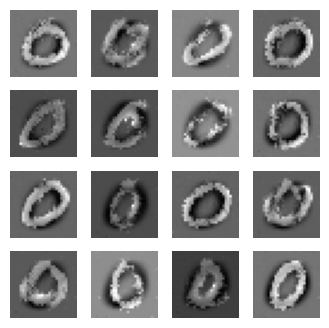

99
real_output: tf.Tensor(
[[3.5456684]
 [2.72264  ]
 [2.2508197]
 [2.83349  ]
 [1.1828976]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9003992 ]
 [-1.2133873 ]
 [-1.5711346 ]
 [-0.7515411 ]
 [-0.31423047]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9854264, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18999404, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25642622, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0735397]
 [2.1704142]
 [2.2000756]
 [2.4605699]
 [3.7586796]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5015812]
 [-3.3991804]
 [-0.8948381]
 [-2.9321117]
 [-2.3688827]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1168308, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.183012, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25429565, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.68246305]
 [ 2.4436495 ]
 [ 3.648839  ]
 [ 2.6053631 ]
 [ 0.9253744 ]], shape=(5, 1), dtype=float32)
fake_outpu

real_output: tf.Tensor(
[[0.85072744]
 [1.6745168 ]
 [2.4645534 ]
 [1.4385916 ]
 [1.8978771 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5283728]
 [-1.5431596]
 [-1.0756875]
 [-1.8270772]
 [-3.0959187]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.015908, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20118876, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25555536, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6662881]
 [1.592555 ]
 [2.469289 ]
 [2.4093726]
 [2.083687 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.974152 ]
 [-1.3893273]
 [-2.309765 ]
 [-1.8904734]
 [-1.787257 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9314086, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30962718, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28093857, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.1570473e+00]
 [ 1.2140300e+00]
 [ 2.0589218e+00]
 [-1.5563741e-03]
 [ 9.9830371e-01]], shape=(5, 1), dtype=float3

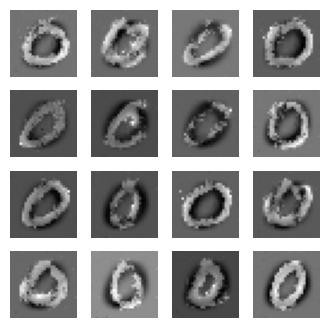

100
real_output: tf.Tensor(
[[ 1.4762213]
 [ 1.1772282]
 [-1.8282855]
 [ 1.9682231]
 [ 2.3974664]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8187592 ]
 [ 0.95590585]
 [-1.1813002 ]
 [ 0.5970523 ]
 [-1.1710174 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.7038037, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30194086, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3497737, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9691243]
 [2.0322032]
 [2.6537983]
 [2.724527 ]
 [2.6041484]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1161996 ]
 [-0.04591866]
 [-1.103767  ]
 [-1.0719942 ]
 [-1.2946283 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1133032, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21512622, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24181929, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5364711 ]
 [3.0746346 ]
 [0.24910463]
 [1.1365298 ]
 [1.3673222 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[0.55968213]
 [1.0085131 ]
 [1.6988947 ]
 [1.3124354 ]
 [2.1318243 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.336204 ]
 [-1.7921455]
 [-2.5277607]
 [-1.486222 ]
 [-0.6300584]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1809354, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18572426, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21518645, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.35386115]
 [0.85448873]
 [1.6274409 ]
 [2.3380847 ]
 [1.348691  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.91385293]
 [-1.8530347 ]
 [-4.150235  ]
 [-4.6177955 ]
 [-2.7787194 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8812449, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23739186, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29737478, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3226755]
 [3.138238 ]
 [1.2109761]
 [0.782474 ]
 [1.6224794]], shape=(5, 1), dtype=float32)
fake_output

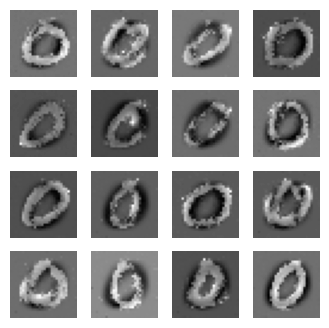

101
real_output: tf.Tensor(
[[2.0302124]
 [1.2052832]
 [2.6054158]
 [2.618324 ]
 [4.07362  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.8390652 ]
 [-3.3203516 ]
 [ 0.58193386]
 [-2.0743043 ]
 [-0.07812343]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.135847, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17321944, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21949717, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5464618]
 [2.5021005]
 [1.711322 ]
 [1.7758213]
 [4.0997205]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.454856  ]
 [-0.45363677]
 [-3.422169  ]
 [-1.9001805 ]
 [ 1.3961552 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.192475, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17849565, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2148143, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.1375203]
 [-0.0281079]
 [ 1.7277682]
 [ 2.3763883]
 [ 2.6097567]], shape=(5, 1), dtype=float32)
fake_outpu

real_output: tf.Tensor(
[[0.8675195]
 [3.714221 ]
 [1.9670058]
 [0.3709191]
 [0.7695339]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9935738]
 [-1.1388658]
 [-3.0426426]
 [-0.9390789]
 [-1.5315846]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0837102, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17081946, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23337612, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.57112  ]
 [2.0942109]
 [2.5503685]
 [2.0651805]
 [2.2689698]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.122303 ]
 [-2.2263298]
 [-0.917575 ]
 [-2.643853 ]
 [-2.7331612]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.312022, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31542948, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20960602, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.23916  ]
 [2.9446082]
 [6.085425 ]
 [2.133165 ]
 [2.0697675]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-

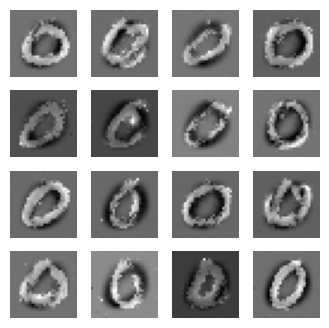

102
real_output: tf.Tensor(
[[3.0338953]
 [0.4266839]
 [1.6196413]
 [1.2293518]
 [0.47568  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.2945814 ]
 [-0.71536374]
 [-1.8374552 ]
 [-1.479436  ]
 [-3.0463905 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3025267, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27829453, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20686005, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4860104]
 [2.192192 ]
 [1.9828017]
 [1.2837955]
 [1.1639818]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5264431]
 [-2.5915408]
 [-2.4208713]
 [-0.7676543]
 [-3.2136154]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3082724, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20397091, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19111662, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2002008]
 [2.5275633]
 [2.3353345]
 [2.406903 ]
 [2.5278137]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[1.6399251]
 [4.017586 ]
 [2.2901628]
 [2.1747527]
 [4.9337344]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6877702]
 [-1.5927938]
 [-0.7589094]
 [-2.9026656]
 [-1.8113356]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2828925, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19148007, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21087423, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1276898 ]
 [1.3627195 ]
 [0.40055564]
 [1.7817683 ]
 [1.4127738 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0663328 ]
 [-0.09196946]
 [-1.3508911 ]
 [-4.7461224 ]
 [-4.170577  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.424263, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25941974, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17665638, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6954446 ]
 [1.6655838 ]
 [3.809503  ]
 [0.92023367]
 [1.9354752 ]], shape=(5, 1), dtype=float32)
fake_output:

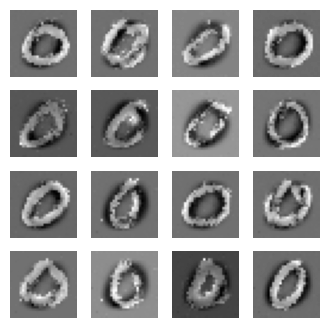

103
real_output: tf.Tensor(
[[ 1.2098042 ]
 [ 2.3969684 ]
 [ 2.9213073 ]
 [-0.4938887 ]
 [ 0.35940275]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7785228 ]
 [-2.2148108 ]
 [ 0.10926279]
 [-3.5377116 ]
 [-3.576693  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4123988, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27640575, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20476207, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 5.2002487]
 [-0.7468636]
 [ 1.4890978]
 [ 4.570741 ]
 [ 3.7518291]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.7391181]
 [-2.114234 ]
 [-1.1361609]
 [-1.6313329]
 [-2.229331 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2154937, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19386622, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23065995, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.750735 ]
 [2.2398448]
 [2.724056 ]
 [2.0916069]
 [2.3532758]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[3.463781  ]
 [2.7582593 ]
 [0.8122514 ]
 [0.16352014]
 [3.3945715 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.257646  ]
 [ 0.03936725]
 [ 0.31823522]
 [-2.208227  ]
 [-4.7727203 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5284848, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25357184, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17477694, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.21588363]
 [0.801265  ]
 [0.29018024]
 [4.572119  ]
 [3.1841993 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3606665]
 [-3.289291 ]
 [-4.4161816]
 [-3.2986264]
 [-3.3244321]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4310508, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30955368, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20797303, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6147113]
 [1.8108282]
 [2.6495533]
 [2.9410017]
 [2.6940181]], shape=(5, 1), dtype=float32)
fake_output

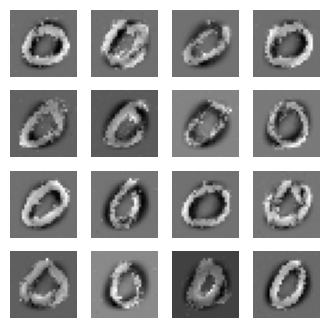

104
real_output: tf.Tensor(
[[2.4737437]
 [2.8362095]
 [1.1837533]
 [2.0942764]
 [3.6180596]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.47332668]
 [-1.7207336 ]
 [ 0.45174393]
 [ 0.01311565]
 [-1.155246  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.137299, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19899307, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23690349, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.7628105]
 [1.6275848]
 [1.7391323]
 [2.1814618]
 [2.6049042]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.0894203]
 [-3.9915345]
 [-1.7602999]
 [-1.7722901]
 [-2.0439746]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.183888, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13678834, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23429634, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9574289 ]
 [1.3381186 ]
 [1.372029  ]
 [2.8691568 ]
 [0.19265136]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[2.8582416]
 [2.109346 ]
 [0.5422704]
 [3.369506 ]
 [3.679434 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1176198 ]
 [-0.6494763 ]
 [ 0.26756743]
 [-3.7873964 ]
 [-0.66196454]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1551635, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21969411, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2327517, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9919057 ]
 [ 1.0033746 ]
 [-0.18144415]
 [ 0.5894551 ]
 [ 1.222918  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.15627895]
 [-0.6365657 ]
 [-0.766067  ]
 [-2.1777132 ]
 [-4.7584033 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.211611, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37478757, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27561963, shape=(), dtype=float32)


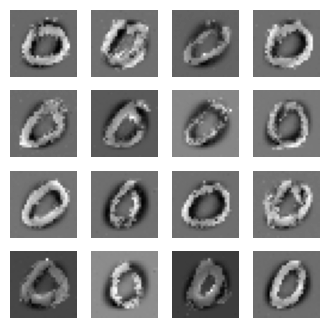

105
real_output: tf.Tensor(
[[2.1972065]
 [2.5828025]
 [2.330235 ]
 [2.4235072]
 [2.173862 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.027595  ]
 [-4.008419  ]
 [-3.3715584 ]
 [-0.99906915]
 [-1.024837  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3407393, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1945369, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21786074, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7407899]
 [1.8872544]
 [1.220223 ]
 [1.4646995]
 [1.2969028]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.59944594]
 [-2.7990131 ]
 [-0.5710758 ]
 [-0.5997108 ]
 [-1.5317857 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1088207, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23693977, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22742891, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.0619807]
 [2.120258 ]
 [3.467197 ]
 [0.9628031]
 [2.3560722]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[1.6947538]
 [2.371707 ]
 [1.9568039]
 [2.8516304]
 [2.0797386]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3365616]
 [-2.008128 ]
 [-2.3048275]
 [-7.2401876]
 [-4.3979197]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1119566, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28734353, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24481025, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.0216961 ]
 [ 1.801741  ]
 [-0.17723626]
 [ 3.067689  ]
 [ 1.1508806 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0192361]
 [-0.8583154]
 [-0.9207825]
 [-2.527443 ]
 [-3.2422397]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1300411, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20043305, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27221715, shape=(), dtype=float32)


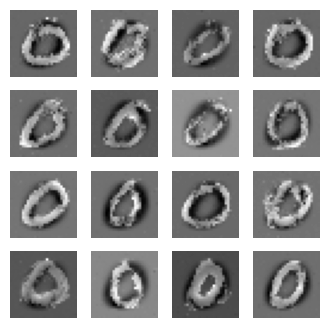

106
real_output: tf.Tensor(
[[1.3718582]
 [0.4861568]
 [2.4897099]
 [1.9001669]
 [0.928659 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6613137]
 [-0.1798872]
 [-2.045064 ]
 [-1.5505587]
 [-4.2839074]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2178936, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.35546607, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2257861, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1810365]
 [2.7350569]
 [2.9458203]
 [1.3308606]
 [2.12452  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2218924]
 [-0.0155735]
 [-2.870853 ]
 [-1.7813659]
 [-2.4946299]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2800336, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20107639, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20383438, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1486541]
 [2.934032 ]
 [2.0402536]
 [2.6891692]
 [1.2619458]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[2.746678 ]
 [2.207169 ]
 [2.9928393]
 [1.5366068]
 [1.8953903]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2831191]
 [-2.7144108]
 [-2.4981709]
 [-1.3274902]
 [-2.9918985]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1401649, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.33377463, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2733625, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.602689 ]
 [2.319179 ]
 [3.8909664]
 [1.2229629]
 [1.2955232]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6746159 ]
 [-5.0216823 ]
 [-3.5324433 ]
 [-0.7767458 ]
 [-0.41709328]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2656078, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2310157, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19772811, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.417883  ]
 [ 1.9530648 ]
 [-0.7119313 ]
 [ 0.31326956]
 [-1.7201172 ]], shape=(5, 1), dtype=float32)
fake_output: 

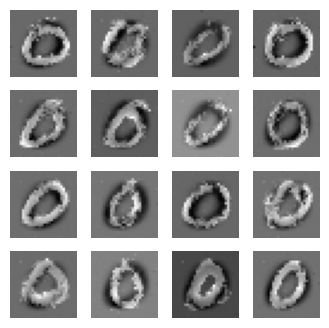

107
real_output: tf.Tensor(
[[1.443196 ]
 [1.2011979]
 [1.5573711]
 [1.6750515]
 [2.7541974]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.56643957]
 [-2.313982  ]
 [-0.37123907]
 [-2.0604825 ]
 [ 1.0016868 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2762845, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26060462, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20501482, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8824337]
 [3.5836203]
 [1.5099986]
 [1.3588285]
 [4.3271155]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9767599]
 [-1.4825168]
 [-2.241439 ]
 [-2.4281294]
 [-2.5091593]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2326524, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23232864, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2321487, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.47701272]
 [ 3.0138013 ]
 [ 0.86265254]
 [ 1.8705262 ]
 [ 1.9693624 ]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[ 2.431345 ]
 [ 1.0313096]
 [-0.1290859]
 [ 2.6986485]
 [ 1.5677329]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0794668 ]
 [-1.9722843 ]
 [-0.57595414]
 [-2.5406065 ]
 [-0.74788785]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2265906, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17675033, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21791631, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8176197]
 [2.4311266]
 [1.4735113]
 [3.0470402]
 [2.678993 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.277793 ]
 [-1.8903776]
 [-1.5390785]
 [-1.2358884]
 [-2.0699914]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3950963, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1665172, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18678129, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.14799844]
 [1.3471226 ]
 [0.19968913]
 [4.294923  ]
 [0.03189813]], shape=(5, 1), dtype=float32)
fake_output:

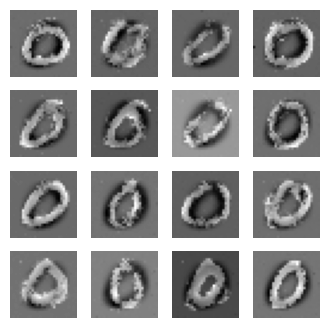

108
real_output: tf.Tensor(
[[1.6654454]
 [2.1392424]
 [1.3435756]
 [3.2474072]
 [4.234917 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.39791504]
 [-4.1818953 ]
 [ 0.31455627]
 [-1.3543955 ]
 [-1.1667818 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9961541, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20431201, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2952311, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.249183  ]
 [0.44518083]
 [1.3729562 ]
 [1.3919073 ]
 [2.5083554 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.86751205]
 [-2.0332112 ]
 [-4.6744323 ]
 [-3.8381364 ]
 [-2.7675312 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3832984, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15455697, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18776156, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2344098 ]
 [0.9460032 ]
 [1.9145024 ]
 [0.31857157]
 [1.3274691 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[1.3048614 ]
 [2.1440177 ]
 [0.59324354]
 [1.4847664 ]
 [3.0497258 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.26642093]
 [-3.6393642 ]
 [-1.005135  ]
 [-2.9620657 ]
 [-0.48773107]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1731377, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16071647, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24851026, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0326302]
 [2.1509352]
 [1.5947275]
 [2.6897297]
 [1.577877 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.658298  ]
 [ 0.31478631]
 [ 0.5803971 ]
 [-0.8471807 ]
 [-2.8415122 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0614777, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19105904, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28249604, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.2954436 ]
 [ 1.3610059 ]
 [ 0.5981555 ]
 [-0.83752143]
 [ 1.2551506 ]], shape=(5, 1), dtype=float32)
f

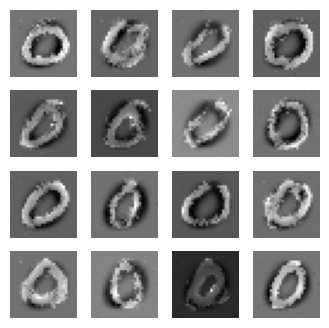

109
real_output: tf.Tensor(
[[2.4654918]
 [3.486657 ]
 [0.8315527]
 [2.040618 ]
 [3.3659832]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1900325]
 [-2.5554729]
 [-2.0773368]
 [-2.7033997]
 [-2.172969 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4110913, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15566, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17845474, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4997973]
 [1.0964674]
 [1.0419397]
 [2.7688284]
 [2.4795997]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0465767]
 [-0.8783884]
 [-1.6549194]
 [-1.3822101]
 [-1.4841044]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.409471, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26582968, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18250847, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5750437]
 [2.5921798]
 [1.5570085]
 [1.9952745]
 [0.6641011]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[

real_output: tf.Tensor(
[[1.2787946]
 [2.3057265]
 [1.0269591]
 [3.4476645]
 [2.4624474]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.550376 ]
 [-2.1580162]
 [-1.2393659]
 [-2.973119 ]
 [-3.096781 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1810892, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23740613, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2435243, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0491729]
 [0.8994775]
 [1.1639676]
 [0.7933707]
 [2.169895 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5122354 ]
 [-2.9550483 ]
 [-1.1449199 ]
 [-0.29992127]
 [ 0.09641135]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9997644, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17310643, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27359635, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9441786 ]
 [ 2.1573403 ]
 [-0.4153295 ]
 [ 0.91429263]
 [ 1.0624483 ]], shape=(5, 1), dtype=float32)
fake_output:

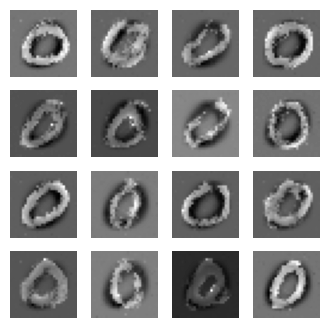

110
real_output: tf.Tensor(
[[3.4190898]
 [2.829547 ]
 [1.677273 ]
 [1.7678404]
 [2.2694159]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.729254 ]
 [-1.9004989]
 [-2.2474852]
 [-1.5511857]
 [-4.473037 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2593699, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20555711, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20637573, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3909445 ]
 [2.0097418 ]
 [1.6544387 ]
 [0.37496266]
 [1.0036111 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7635903]
 [-3.1519907]
 [-2.6300335]
 [-1.5157597]
 [-3.721754 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2127762, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2160398, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21632996, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8051555]
 [2.8573544]
 [3.635292 ]
 [1.4730718]
 [2.3025455]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[-0.22791941]
 [ 0.9956774 ]
 [ 1.7305709 ]
 [ 0.5660915 ]
 [ 0.01939837]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2139895]
 [-1.9837788]
 [-3.2675836]
 [-2.90026  ]
 [-1.4714898]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1505008, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3065669, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23963828, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.957226  ]
 [0.08503683]
 [0.88802296]
 [2.0295055 ]
 [2.767012  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.31013095]
 [-1.6161069 ]
 [-0.21695463]
 [-4.1446376 ]
 [-2.5661988 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0391006, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16375038, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27308267, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.05126106]
 [ 2.7415936 ]
 [ 1.0692896 ]
 [ 2.1117988 ]
 [ 5.1225452 ]], shape=(5, 1), dtype=float3

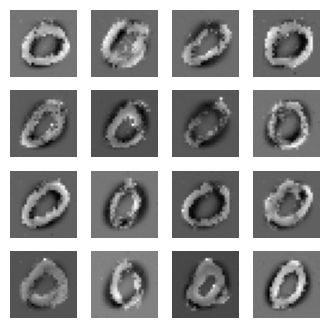

111
real_output: tf.Tensor(
[[1.4031075 ]
 [2.9138725 ]
 [0.36521932]
 [0.9158151 ]
 [3.0749357 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6301599 ]
 [-4.2322097 ]
 [-0.57183206]
 [-0.73107433]
 [-1.6703007 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1147451, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16632158, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26334065, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0038183 ]
 [0.769129  ]
 [3.8750942 ]
 [4.8308845 ]
 [0.80442744]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.493915  ]
 [-2.959552  ]
 [-0.38656658]
 [-3.549473  ]
 [-2.1541288 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1490767, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21925654, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23805156, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1287066]
 [2.0260415]
 [3.3743322]
 [0.9847395]
 [2.5242302]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[1.901437  ]
 [1.0374902 ]
 [0.43188342]
 [3.5790384 ]
 [2.7186816 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6979953]
 [-3.0530412]
 [-2.558018 ]
 [-0.7806124]
 [-1.8393315]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3386421, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25574592, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20492703, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2117727]
 [1.5297402]
 [2.4051821]
 [1.7514813]
 [5.670199 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.475599 ]
 [-3.085345 ]
 [-1.4946826]
 [-1.7176359]
 [-2.0387602]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1959429, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17700376, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23684457, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8324217]
 [1.9842037]
 [2.8947299]
 [2.9464526]
 [3.1723583]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

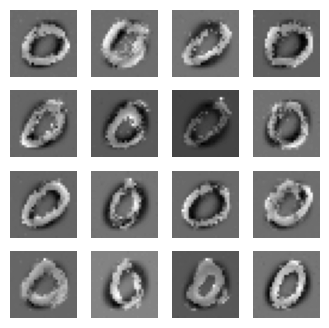

112
real_output: tf.Tensor(
[[3.051009 ]
 [2.0536735]
 [1.5614386]
 [3.3685267]
 [3.6206138]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.72392696]
 [-2.619583  ]
 [-0.10272962]
 [ 1.1317477 ]
 [-2.4950128 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2491808, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18573746, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24414523, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7577531]
 [2.8552387]
 [3.048949 ]
 [3.108341 ]
 [2.6128156]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.9720354]
 [-1.6882062]
 [-1.572501 ]
 [-4.551708 ]
 [-3.528307 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.198865, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16597247, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22090143, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-2.2055793]
 [ 1.4805373]
 [ 1.5821176]
 [ 3.7836294]
 [ 1.3323983]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[3.0420058 ]
 [2.604578  ]
 [0.8708729 ]
 [0.93252057]
 [3.8705175 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4444785 ]
 [-2.1237519 ]
 [-2.5345445 ]
 [-0.01442939]
 [-3.0931804 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0240226, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.32116687, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30415446, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8087833]
 [6.1560593]
 [3.5030336]
 [2.0215049]
 [2.4271157]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.3991835 ]
 [-2.9987235 ]
 [-1.1301836 ]
 [ 0.24607551]
 [-2.422106  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.238137, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.108837515, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2174649, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5825497]
 [0.7989305]
 [1.8291451]
 [1.6523315]
 [3.1145465]], shape=(5, 1), dtype=float32)
fake_output:

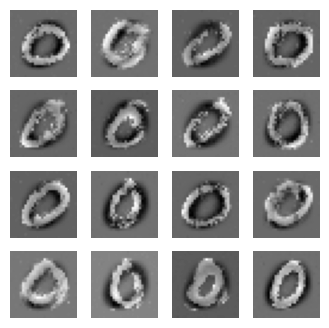

113
real_output: tf.Tensor(
[[2.7467666]
 [1.6278352]
 [2.5158913]
 [2.2529085]
 [3.1680295]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1384829]
 [-2.0970056]
 [-3.3100946]
 [-1.6442249]
 [-2.0169013]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3107734, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20065981, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2267577, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6141708]
 [3.0806577]
 [0.7322418]
 [2.366385 ]
 [2.5530536]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7431462 ]
 [-3.4580724 ]
 [ 1.0210319 ]
 [ 0.69131964]
 [-2.3243802 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.182117, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2211984, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22640619, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6852682]
 [2.9713705]
 [3.6481435]
 [1.9379785]
 [0.9268702]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

real_output: tf.Tensor(
[[ 1.5115929 ]
 [ 3.4178467 ]
 [ 1.6793647 ]
 [-0.21735549]
 [ 1.5242896 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3546815 ]
 [-0.61027956]
 [-1.6457686 ]
 [-4.495028  ]
 [ 1.9891963 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9716427, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20144458, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3053399, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6891187]
 [1.2131804]
 [2.536397 ]
 [2.122087 ]
 [1.9286374]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5120838]
 [-0.5093614]
 [-4.5912232]
 [-0.9112706]
 [-2.1647158]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1744344, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19370008, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23855105, shape=(), dtype=float32)


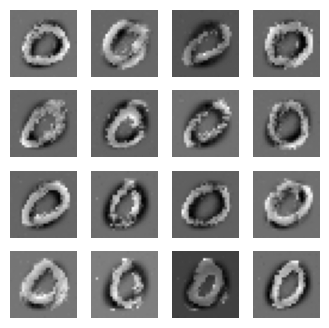

114
real_output: tf.Tensor(
[[ 3.7015529 ]
 [-0.1284528 ]
 [ 3.3015594 ]
 [ 0.5361028 ]
 [ 0.24212383]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6593075]
 [-1.1117668]
 [-2.2897077]
 [-4.4591937]
 [ 1.1251588]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.089782, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21359074, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31000188, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6036707]
 [1.2849259]
 [2.1638615]
 [1.1978382]
 [2.7276013]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9060221]
 [-0.686018 ]
 [-1.3018471]
 [-2.1773927]
 [-1.1310565]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.164638, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16288406, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.262132, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5907608 ]
 [ 1.4068468 ]
 [ 0.37627813]
 [ 1.6700253 ]
 [-1.0484945 ]], shape=(5, 1), dtype=float32)
fake_o

real_output: tf.Tensor(
[[-0.1676262 ]
 [ 0.8520771 ]
 [ 0.77489364]
 [ 1.594792  ]
 [ 3.2381234 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1104931]
 [-2.8656297]
 [-3.5175853]
 [-1.1762937]
 [-2.2040715]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1755145, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26690853, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25021547, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.12406801]
 [ 1.1099479 ]
 [ 0.31121463]
 [ 0.0499825 ]
 [ 2.4770038 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5783129 ]
 [-2.6585562 ]
 [-2.2346573 ]
 [-3.053499  ]
 [ 0.24715348]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1443791, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.45445165, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24808949, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.1139479]
 [-1.0891224]
 [ 3.559269 ]
 [ 3.9183238]
 [ 3.9906955]], shape=(5, 1), dtype=float

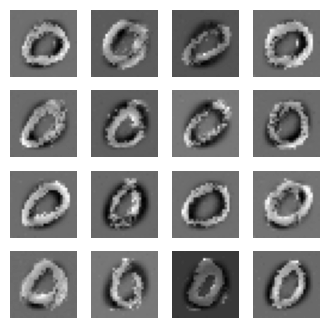

115
real_output: tf.Tensor(
[[ 2.7108705]
 [ 3.0217807]
 [-1.2173907]
 [ 1.6327561]
 [ 1.1835604]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4310539]
 [ 1.3972772]
 [-3.433692 ]
 [-2.0558138]
 [-1.2660996]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1330428, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37457675, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24475965, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.36722153]
 [-0.10225803]
 [-0.28596133]
 [ 0.6678937 ]
 [ 3.3282108 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.864048  ]
 [-0.59630483]
 [-3.0750852 ]
 [-0.49707597]
 [-4.4544015 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3078744, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30906892, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2326788, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.478154 ]
 [1.2836051]
 [3.808798 ]
 [2.7790325]
 [1.9914463]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[3.0895457]
 [3.4512453]
 [0.5318097]
 [2.1626263]
 [3.4573116]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3832378 ]
 [-1.2144213 ]
 [ 0.22435568]
 [-1.6842299 ]
 [-2.718451  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1657977, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27994078, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27499473, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0478648]
 [1.8615636]
 [1.393749 ]
 [2.4116168]
 [2.2688653]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5461698]
 [-1.7491274]
 [-1.0161881]
 [-2.7434976]
 [-2.9946373]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.217578, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21669479, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2629471, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.7946036 ]
 [ 0.47303247]
 [ 2.4736786 ]
 [ 4.3157487 ]
 [-1.0938134 ]], shape=(5, 1), dtype=float32)
fake_output: 

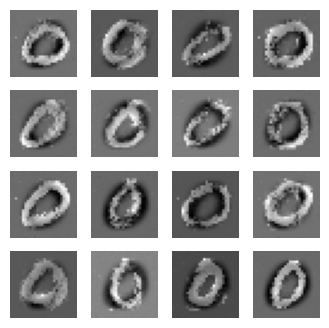

116
real_output: tf.Tensor(
[[ 3.3456297 ]
 [ 2.549108  ]
 [-0.29345447]
 [ 2.8347304 ]
 [ 3.283323  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6201751]
 [-1.4167622]
 [-0.5974664]
 [-4.7819457]
 [-2.1498957]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1893947, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1728751, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28531623, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5483792]
 [1.3857158]
 [1.3265032]
 [2.5776644]
 [3.055732 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2238903]
 [-2.0921898]
 [-2.368601 ]
 [-1.8656737]
 [ 1.2900575]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1204338, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18869483, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28759718, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.26162174]
 [1.8115771 ]
 [1.6637633 ]
 [1.0370228 ]
 [2.3250098 ]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[ 1.9470599]
 [-0.4365003]
 [ 1.7688959]
 [ 3.3982089]
 [ 0.7090808]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9456292]
 [-2.086823 ]
 [-1.4330878]
 [-1.0696898]
 [-4.0731015]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3874958, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23982035, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23629121, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.58216244]
 [ 2.4896038 ]
 [ 1.9429498 ]
 [ 2.1043162 ]
 [ 3.5128179 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8535368 ]
 [-2.9809442 ]
 [-0.31689364]
 [-0.77498895]
 [-3.00667   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2788396, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31470782, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2294527, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.2107538]
 [ 1.8443006]
 [ 1.2852488]
 [ 2.3298123]
 [-1.6028463]], shape=(5, 1), dtype=float32)
fa

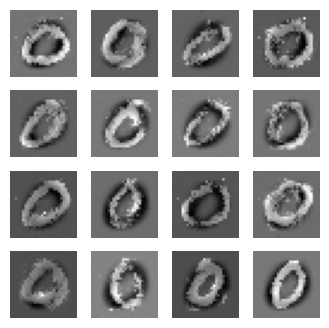

117
real_output: tf.Tensor(
[[3.1893578]
 [1.3902376]
 [2.158001 ]
 [3.0150046]
 [3.440756 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.0089153 ]
 [-0.06675421]
 [-2.012662  ]
 [-0.5068151 ]
 [-3.1450117 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0354168, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1766803, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27874157, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.99784887]
 [2.424608  ]
 [0.891745  ]
 [3.5332744 ]
 [3.9473803 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.0530304 ]
 [ 0.01639423]
 [-1.9788402 ]
 [-0.27078882]
 [ 0.02086237]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1932588, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17802924, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2771903, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.5442883 ]
 [ 1.9853017 ]
 [-3.5796907 ]
 [ 2.047827  ]
 [ 0.42763555]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[0.02725867]
 [3.5998628 ]
 [3.4132953 ]
 [2.1695828 ]
 [3.200199  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0607362 ]
 [-1.3095915 ]
 [-0.30360958]
 [-3.6032183 ]
 [-3.5507877 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4450898, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26927403, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26952606, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.5163829 ]
 [2.0926018 ]
 [0.28528208]
 [1.4295393 ]
 [1.3863958 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.8027842]
 [-2.1029208]
 [ 1.0741535]
 [-1.0334901]
 [-1.1463274]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3899906, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.40716428, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22077137, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5941002 ]
 [ 2.4910712 ]
 [ 0.22196865]
 [ 1.0526483 ]
 [-0.21810126]], shape=(5, 1), dtype=float32)
f

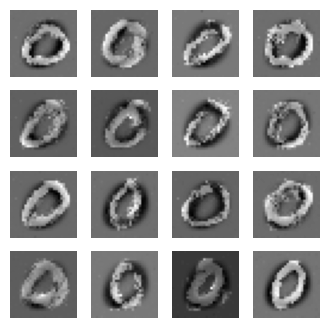

118
real_output: tf.Tensor(
[[0.21227232]
 [1.06474   ]
 [1.1948123 ]
 [2.2303483 ]
 [1.3873701 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0526834 ]
 [-4.900579  ]
 [ 0.5653918 ]
 [-1.5927236 ]
 [-0.47975346]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0444517, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20162047, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2851439, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.9333889 ]
 [-0.05204921]
 [ 4.186488  ]
 [ 3.6560347 ]
 [ 2.86204   ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.057873  ]
 [ 0.13589281]
 [-3.535996  ]
 [-0.9902014 ]
 [-3.2650874 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2269268, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17693865, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30736154, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.7136475]
 [3.4299579]
 [2.8160517]
 [2.3413248]
 [1.3671113]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[4.2145395]
 [2.0701256]
 [1.98243  ]
 [1.0949342]
 [1.6236998]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.77896136]
 [-3.0297909 ]
 [-3.9036453 ]
 [-0.3509454 ]
 [-0.5771732 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9306667, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22619024, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2997895, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1468823]
 [2.6566117]
 [4.339713 ]
 [1.3150921]
 [0.5102999]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0994656]
 [-2.0926807]
 [-1.469836 ]
 [-1.6860086]
 [-1.2704315]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9009799, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2080139, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3527426, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7703599]
 [4.343837 ]
 [0.0739859]
 [2.8309343]
 [3.1021738]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(


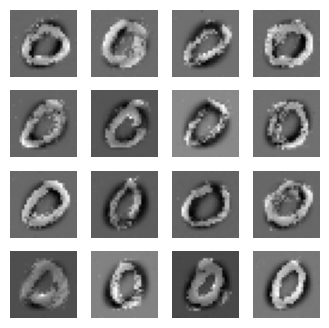

119
real_output: tf.Tensor(
[[1.7054272 ]
 [3.1977143 ]
 [1.8613306 ]
 [0.69311357]
 [2.5682542 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.470779 ]
 [-2.5949504]
 [-1.9288125]
 [ 0.0918214]
 [ 0.2039127]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1784477, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22453782, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22973801, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0474728]
 [2.0039008]
 [3.1481628]
 [2.834625 ]
 [1.6066848]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5278496 ]
 [-4.8914843 ]
 [-2.8487718 ]
 [-0.34249598]
 [-0.7664793 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1074548, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2429699, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26403487, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.468059  ]
 [1.9893564 ]
 [0.9441731 ]
 [2.2566562 ]
 [0.17449509]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[ 0.39832583]
 [ 3.5097442 ]
 [ 0.53513813]
 [-0.05648968]
 [ 1.0741961 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4609082]
 [-3.1252604]
 [-1.8342376]
 [-2.9168253]
 [-1.3438349]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0449543, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22117338, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2399187, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1035342]
 [0.8089787]
 [1.315852 ]
 [3.8307045]
 [2.7161217]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.47306886]
 [ 0.5734154 ]
 [-3.2356687 ]
 [-1.4557885 ]
 [-2.441561  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9553292, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16402966, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27773982, shape=(), dtype=float32)


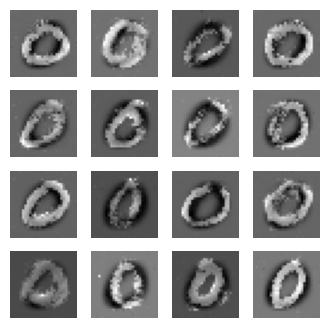

120
real_output: tf.Tensor(
[[2.1837478]
 [1.8083007]
 [1.86138  ]
 [1.8983111]
 [2.2801752]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6160617]
 [-3.253992 ]
 [-2.4573627]
 [-2.0032835]
 [-3.0132837]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2226524, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.186531, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20675024, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.00899063]
 [ 1.9206183 ]
 [ 3.1587832 ]
 [ 0.06860842]
 [ 0.95126283]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.990379  ]
 [-1.4567448 ]
 [-3.8946955 ]
 [ 0.03627981]
 [-3.9040945 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1117017, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21463606, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24710537, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.7735765 ]
 [ 1.9911066 ]
 [-0.85409653]
 [ 3.5879788 ]
 [ 1.5213281 ]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[1.8681971 ]
 [2.392236  ]
 [4.0666847 ]
 [0.95382154]
 [3.904188  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8571556 ]
 [-1.8612988 ]
 [-3.3746603 ]
 [-0.84222996]
 [-2.782217  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1014814, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2907195, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23803987, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6543605]
 [1.8719782]
 [1.808846 ]
 [0.7876687]
 [2.917432 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5140119 ]
 [ 0.07559451]
 [-1.1575027 ]
 [-1.8497579 ]
 [-1.4138349 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1184716, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2953602, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28838754, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8753984 ]
 [2.2425168 ]
 [2.7748837 ]
 [0.16839647]
 [2.7956743 ]], shape=(5, 1), dtype=float32)
fake_out

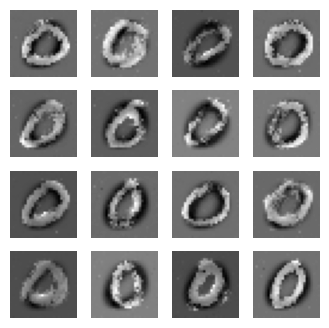

121
real_output: tf.Tensor(
[[2.3316424 ]
 [1.6296377 ]
 [0.61837226]
 [0.9212093 ]
 [1.454423  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9216263 ]
 [-0.67100424]
 [-2.714842  ]
 [-1.4423454 ]
 [-3.0472298 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3522682, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34129518, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2984476, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.58978283]
 [0.7766504 ]
 [1.9628578 ]
 [1.2722839 ]
 [1.983024  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.35498863]
 [-1.0434183 ]
 [-3.0897713 ]
 [-4.114126  ]
 [-2.0998366 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.140146, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22972672, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27977204, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-1.5357165]
 [ 1.6274543]
 [ 0.9980614]
 [ 4.7192373]
 [ 3.8409128]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[ 1.6435041]
 [ 2.5082998]
 [-2.642319 ]
 [ 1.6641922]
 [-1.0762198]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1314418 ]
 [-2.8481703 ]
 [-0.24290466]
 [-4.4494367 ]
 [-0.8903775 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1355803, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3585806, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2568888, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.65297836]
 [ 1.4428623 ]
 [-0.28093404]
 [ 1.288913  ]
 [-0.41613454]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0789034 ]
 [-1.2007892 ]
 [-0.88055176]
 [-1.5495765 ]
 [-1.5600576 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1730442, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34486964, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2787911, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.134677 ]
 [2.5783126]
 [2.566392 ]
 [1.1474605]
 [2.1210477]], shape=(5, 1), dtype=float32)
fake

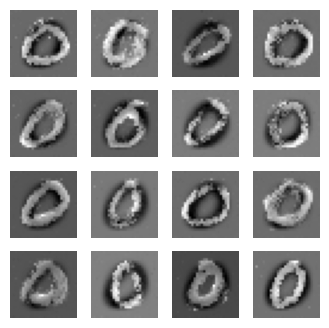

122
real_output: tf.Tensor(
[[1.8982747]
 [2.8241594]
 [0.8763928]
 [1.7520435]
 [1.1818302]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.923995 ]
 [-1.9518011]
 [-2.2300215]
 [-2.7422829]
 [-1.270252 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2451968, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1890023, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2789276, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.105332 ]
 [1.0990528]
 [2.291067 ]
 [2.15534  ]
 [1.5054488]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9364154]
 [-1.530099 ]
 [-2.9065819]
 [-3.3393555]
 [-1.5009446]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1806264, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1938889, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2638786, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4361665]
 [2.4203272]
 [0.9031127]
 [4.7006755]
 [2.3232286]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[

real_output: tf.Tensor(
[[0.5384879]
 [0.8399858]
 [2.7609127]
 [3.9738662]
 [1.5109226]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.2748229]
 [-0.8087035]
 [-1.442108 ]
 [-1.1948348]
 [-3.0501173]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.255587, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19068319, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23845723, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4916404]
 [3.786703 ]
 [3.2631257]
 [1.8882264]
 [1.017383 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.11535677]
 [-2.7970786 ]
 [-0.74608433]
 [ 1.5587145 ]
 [ 0.06195936]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1405282, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17914292, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2748486, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4857442]
 [2.153365 ]
 [3.6972945]
 [1.0378237]
 [1.0654514]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

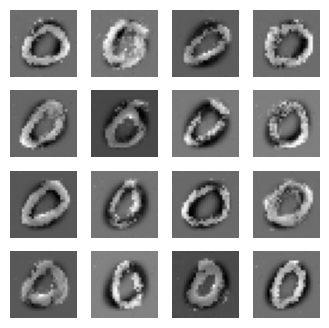

123
real_output: tf.Tensor(
[[4.418408  ]
 [3.623922  ]
 [0.59399164]
 [3.6138978 ]
 [0.5717846 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.8089466]
 [-1.4385318]
 [-1.8096482]
 [-4.732528 ]
 [-3.1717732]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1728776, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21886969, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25081837, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6508822]
 [1.3862104]
 [1.2549801]
 [2.235167 ]
 [1.574889 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.04001431]
 [-0.5132683 ]
 [-2.3093572 ]
 [-0.6594642 ]
 [-1.0999594 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.058012, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2243256, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29204503, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5997758 ]
 [ 1.0687723 ]
 [ 1.7019916 ]
 [-0.09941436]
 [ 0.28044334]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[1.9721084]
 [1.2476053]
 [2.0991833]
 [1.8350494]
 [2.550764 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.201226 ]
 [-2.2597604]
 [-1.2542903]
 [-1.2758754]
 [-2.2085533]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.616269, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34901717, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17016435, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0093929]
 [2.1748772]
 [1.332496 ]
 [2.6394114]
 [1.1582748]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3252873 ]
 [-0.18155658]
 [-7.4310017 ]
 [-1.8829378 ]
 [-1.1309114 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4444296, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.36598912, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18132526, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9038565 ]
 [1.9313376 ]
 [1.1684437 ]
 [0.41778368]
 [1.1495192 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

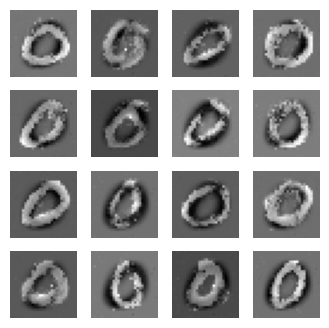

124
real_output: tf.Tensor(
[[0.7798837]
 [1.689139 ]
 [1.8352321]
 [2.457408 ]
 [1.9878782]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.8528996]
 [-2.3127298]
 [-2.6320195]
 [-3.6128297]
 [-2.5438097]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0437193, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24034429, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2796296, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.71246  ]
 [1.5826076]
 [2.8339534]
 [2.3887455]
 [1.6191816]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4428098]
 [-2.2790518]
 [-1.2069403]
 [-1.1663862]
 [ 0.4402485]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0941663, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14217933, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28122213, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.779363 ]
 [2.6892931]
 [1.4997054]
 [3.1486576]
 [2.0392864]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[1.1558094]
 [1.5090241]
 [1.3653648]
 [1.7548798]
 [3.7140787]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.4868429 ]
 [-0.89229494]
 [-0.11360447]
 [-0.34412912]
 [-1.951757  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.888861, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20718803, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.35001105, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6510637]
 [2.5622556]
 [0.9562124]
 [2.057905 ]
 [0.9236444]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0565884 ]
 [-2.7690742 ]
 [-0.65418303]
 [-4.214681  ]
 [-1.3092979 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1118033, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23602939, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25439405, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7644186 ]
 [3.143002  ]
 [3.1225576 ]
 [2.3595934 ]
 [0.60142046]], shape=(5, 1), dtype=float32)
fake_output:

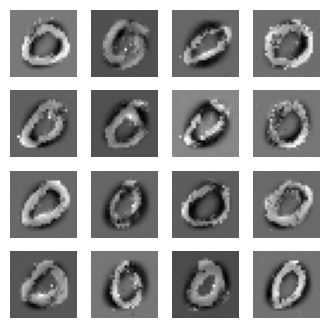

125
real_output: tf.Tensor(
[[1.4358054]
 [3.677876 ]
 [2.0945609]
 [1.5984861]
 [1.6630654]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.942891 ]
 [-5.408985 ]
 [ 0.479488 ]
 [-0.5151514]
 [-0.5826681]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4603243, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26710892, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21430644, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.34803888]
 [3.2577069 ]
 [2.9136662 ]
 [1.5344133 ]
 [1.1092405 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.88446164]
 [-3.4671369 ]
 [-1.3339717 ]
 [-2.4474008 ]
 [-0.7690066 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3065023, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.209177, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2198487, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.075833  ]
 [-0.12365375]
 [ 2.0078392 ]
 [ 2.945591  ]
 [ 2.0981653 ]], shape=(5, 1), dtype=float32)
fake_

real_output: tf.Tensor(
[[-0.786348  ]
 [ 1.5404658 ]
 [ 1.1391277 ]
 [ 0.80646276]
 [-0.22505578]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3106096]
 [-5.0774627]
 [-1.4337854]
 [-2.4337173]
 [-1.4261583]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.457692, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.43737054, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19611569, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.146944  ]
 [-0.47783557]
 [ 0.24375115]
 [ 0.31674275]
 [ 2.1092553 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5592985]
 [-2.2300062]
 [-2.910996 ]
 [-3.280719 ]
 [-0.9506465]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2742672, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.33525923, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2462221, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2757001]
 [1.7846651]
 [1.209496 ]
 [3.135524 ]
 [2.860273 ]], shape=(5, 1), dtype=float32)
fake_out

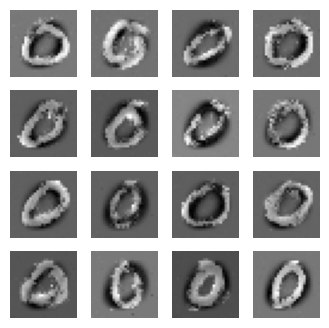

126
real_output: tf.Tensor(
[[2.306903  ]
 [0.8377889 ]
 [0.99991876]
 [0.05340033]
 [2.381289  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.679461 ]
 [-2.5607934]
 [-4.8921866]
 [-1.8265476]
 [-1.7090015]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9882374, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28975928, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29990277, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0715606]
 [1.3739715]
 [1.5356505]
 [2.202583 ]
 [1.8445914]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.871296  ]
 [-3.4788988 ]
 [-3.0299144 ]
 [-0.56325245]
 [-3.0419354 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0619981, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18635465, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28546047, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.19134447]
 [2.4313307 ]
 [0.9566097 ]
 [2.9101803 ]
 [2.4809391 ]], shape=(5, 1), dtype=float32)
fake_ou

real_output: tf.Tensor(
[[2.1698751]
 [2.6165223]
 [1.981409 ]
 [1.8178724]
 [1.3926467]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9612309]
 [-1.3789314]
 [-3.5809488]
 [-1.0127294]
 [-2.6265693]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8079069, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16509378, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.36463147, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2585983 ]
 [3.4213648 ]
 [1.7846237 ]
 [0.06321776]
 [1.8183268 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.23630416]
 [-1.7501376 ]
 [ 0.07266819]
 [-2.720965  ]
 [-0.79247105]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.7175975, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18582281, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.34661195, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.255727 ]
 [2.4203777]
 [2.7759175]
 [2.2813869]
 [1.6239383]], shape=(5, 1), dtype=float32)
fake_output: tf.

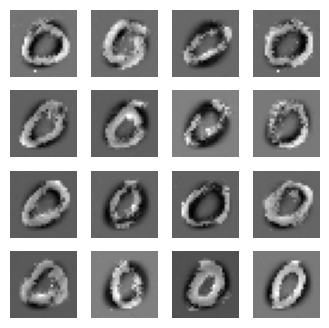

127
real_output: tf.Tensor(
[[1.4414821 ]
 [0.06200716]
 [1.2792265 ]
 [0.6303041 ]
 [1.3550396 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4871254]
 [-1.3760314]
 [-4.238887 ]
 [-1.1718459]
 [-2.253404 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2018728, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29562053, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20790793, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.5293987]
 [ 1.8020768]
 [-1.7192932]
 [-0.0737142]
 [ 2.2013838]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.288613 ]
 [-2.9893568]
 [-1.4795847]
 [-4.1274414]
 [-3.162186 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3415473, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2529193, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19020408, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.7717237 ]
 [ 2.071299  ]
 [ 1.816593  ]
 [ 1.856054  ]
 [-0.25626025]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[1.8171202]
 [2.340409 ]
 [2.7661726]
 [2.1416297]
 [2.3066502]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9546677]
 [-3.973794 ]
 [-6.0324826]
 [-2.7877445]
 [-1.707054 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1969664, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2745452, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24556537, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.31772572]
 [ 3.049606  ]
 [ 3.1263344 ]
 [-0.18884021]
 [-0.08089482]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5149142 ]
 [ 1.9117516 ]
 [-2.7557218 ]
 [-2.5917015 ]
 [-0.03381269]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2949612, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20722578, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23925525, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1335502 ]
 [2.8613117 ]
 [0.8882865 ]
 [0.01843116]
 [4.0379834 ]], shape=(5, 1), dtype=float32)
fake_ou

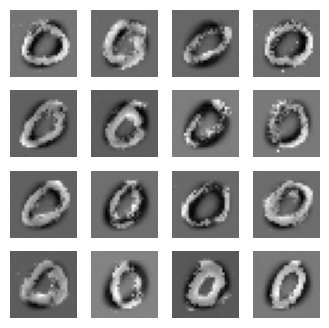

128
real_output: tf.Tensor(
[[2.3489509]
 [3.337794 ]
 [1.7304956]
 [3.3293016]
 [2.4260056]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.07881315]
 [-3.8017142 ]
 [-0.27189344]
 [-4.2723584 ]
 [-3.1017342 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.229064, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2344041, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25957066, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1693851e+00]
 [4.8965077e+00]
 [4.4713526e+00]
 [3.4710094e-03]
 [4.9134688e+00]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.7408502]
 [-1.4204348]
 [ 0.7884828]
 [-1.2810768]
 [-1.5470527]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9415821, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1794737, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31191808, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.84689164]
 [ 2.468212  ]
 [-0.45157397]
 [ 1.4317853 ]
 [-0.04494242]], shape=(5, 1), dtype

real_output: tf.Tensor(
[[1.5079325 ]
 [0.9555091 ]
 [0.42788127]
 [3.4710598 ]
 [2.29185   ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0698644]
 [-1.7331867]
 [-1.2398292]
 [-3.1963482]
 [-3.0493946]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9821765, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.32740158, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27119726, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4300594]
 [1.2952182]
 [1.7601423]
 [3.7882352]
 [2.0357184]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.6775684]
 [-1.3327005]
 [-2.4835002]
 [-1.6156402]
 [-0.9265042]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1806026, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1966466, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23643301, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.4729602]
 [ 1.7125694]
 [ 2.8108478]
 [ 2.803259 ]
 [ 2.0732765]], shape=(5, 1), dtype=float32)
fake_output: tf.T

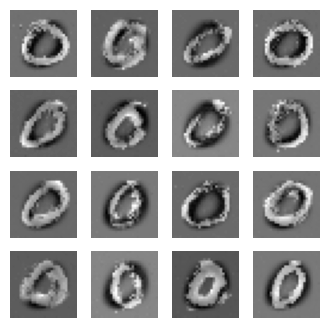

129
real_output: tf.Tensor(
[[-0.25938427]
 [ 0.1835965 ]
 [ 0.23393776]
 [ 2.3350575 ]
 [ 1.0724196 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.01967861]
 [ 0.04426064]
 [-0.45394087]
 [ 0.9698435 ]
 [-1.5762689 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.213748, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3645614, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22828498, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8674037]
 [1.961354 ]
 [1.946057 ]
 [0.9004143]
 [0.9209061]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5592337 ]
 [-2.8843577 ]
 [-0.63113743]
 [-5.6862335 ]
 [-1.2356236 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.206522, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2615924, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24749188, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.2223022 ]
 [-0.01252158]
 [ 1.3915595 ]
 [ 1.2041024 ]
 [ 1.5788801 ]], shape=(5, 1), dtype=float

real_output: tf.Tensor(
[[-0.27845436]
 [ 5.2153873 ]
 [ 0.7869914 ]
 [ 0.3769824 ]
 [ 2.6879296 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7132306 ]
 [-2.5308251 ]
 [-0.33070117]
 [ 0.05235548]
 [-1.6699657 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8234487, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22594033, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3406632, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1057754]
 [2.6490078]
 [3.13449  ]
 [1.8912297]
 [1.1970555]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.524287  ]
 [-2.4112875 ]
 [-2.5902839 ]
 [-2.0699558 ]
 [-0.30134052]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0632577, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20412469, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25567865, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.961825 ]
 [2.9439783]
 [3.0720437]
 [2.104097 ]
 [2.5151556]], shape=(5, 1), dtype=float32)
fake_ou

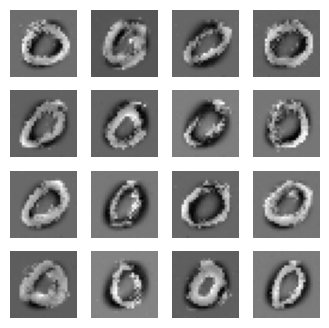

130
real_output: tf.Tensor(
[[1.0074024]
 [1.9205987]
 [2.8125868]
 [2.1104662]
 [2.5431397]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3669217]
 [-1.3457718]
 [-2.3618124]
 [-0.8909333]
 [-0.3756282]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6366343, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23808143, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15429983, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.132047  ]
 [1.4099884 ]
 [2.9813638 ]
 [1.8498459 ]
 [0.81212854]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7274576 ]
 [-3.1742582 ]
 [-3.0199869 ]
 [-3.7961335 ]
 [-0.21924017]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1932693, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21567696, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23722012, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.6335734 ]
 [ 2.7534187 ]
 [-0.09602491]
 [ 1.6127716 ]
 [ 3.8810897 ]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[-1.0775347]
 [ 1.6794554]
 [ 1.7487317]
 [ 1.8770081]
 [ 1.8291012]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0909493 ]
 [-2.7171333 ]
 [-0.6753601 ]
 [-0.6012243 ]
 [-0.21842799]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6541119, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22867927, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18328214, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.8229866]
 [2.4611135]
 [2.290932 ]
 [2.011956 ]
 [1.70062  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.99053   ]
 [ 0.2559766 ]
 [-4.9392114 ]
 [ 0.25706747]
 [-4.0444655 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4579072, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.35088968, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21972203, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.7741975 ]
 [ 0.98759454]
 [-0.04373127]
 [ 3.7489867 ]
 [-0.13020474]], shape=(5, 1), dtype=float32)
f

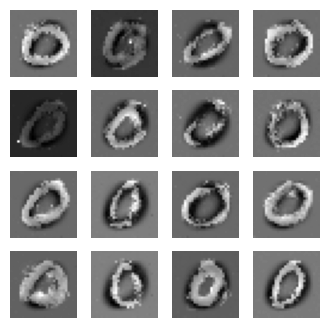

131
real_output: tf.Tensor(
[[0.513429  ]
 [2.0602853 ]
 [0.96519417]
 [1.3875301 ]
 [0.44208902]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.53086   ]
 [-0.7461568 ]
 [-2.693009  ]
 [-3.3446026 ]
 [-0.16541821]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2802634, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24410775, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21921292, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.9810138 ]
 [ 1.6639842 ]
 [-0.22049776]
 [ 3.0721474 ]
 [ 1.3475336 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.35442  ]
 [-1.6886438]
 [-1.5282482]
 [-4.1258097]
 [-3.6866891]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2495267, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15173559, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22053227, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.84645444]
 [ 1.4345902 ]
 [ 2.7188656 ]
 [-0.01498886]
 [ 1.2950262 ]], shape=(5, 1), dtype=f

real_output: tf.Tensor(
[[2.0873525]
 [1.1530147]
 [3.3652704]
 [1.9055722]
 [3.9342415]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.26951978]
 [-3.1091697 ]
 [-1.8156874 ]
 [-2.1530142 ]
 [-1.2672178 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2038014, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19503027, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29047516, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.53698707]
 [1.3076906 ]
 [2.1625881 ]
 [0.15610626]
 [1.7258741 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4504588]
 [-1.367128 ]
 [-1.902664 ]
 [-3.3465626]
 [-1.8643818]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1737473, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.45143956, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24190265, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4087207]
 [2.911944 ]
 [1.7237127]
 [1.5645392]
 [2.2605116]], shape=(5, 1), dtype=float32)
fake_output: tf.

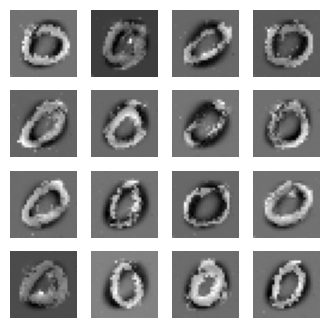

132
real_output: tf.Tensor(
[[0.9442121]
 [2.3763099]
 [1.7584138]
 [1.3496532]
 [1.4927062]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1595497 ]
 [-0.13595584]
 [-1.828237  ]
 [-0.7560577 ]
 [-1.839282  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.287172, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23792815, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21754795, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.748292  ]
 [2.5264485 ]
 [0.21165583]
 [2.7911725 ]
 [1.439458  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.7242162]
 [-1.7981476]
 [-0.6337877]
 [-2.6964455]
 [-1.699974 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.832342, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25432426, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3743518, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7620609]
 [1.4751613]
 [1.540974 ]
 [0.822622 ]
 [1.2061276]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[1.6619533]
 [1.9900271]
 [1.8622618]
 [3.091474 ]
 [1.1864733]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5807176]
 [-1.0214845]
 [-0.6523184]
 [-1.5713333]
 [ 1.4049221]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0778217, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37690955, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26509333, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5689331]
 [2.3566759]
 [0.838567 ]
 [2.0790813]
 [2.27683  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.62151676]
 [-1.5174488 ]
 [ 1.0422002 ]
 [-2.2609036 ]
 [-2.5335758 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0196004, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19776455, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27363843, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.889057  ]
 [-0.12961574]
 [ 0.59027106]
 [ 1.681652  ]
 [-0.7078709 ]], shape=(5, 1), dtype=float32)
fake_output

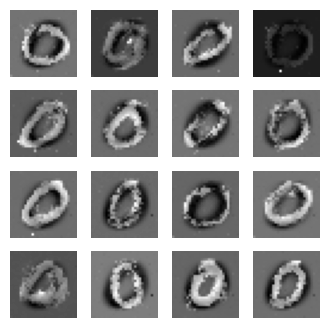

133
real_output: tf.Tensor(
[[2.8706632]
 [1.1329817]
 [2.2115653]
 [0.7216466]
 [4.332842 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1712525]
 [-1.4095685]
 [-2.6804864]
 [-3.771579 ]
 [-1.5901345]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.111713, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26198408, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24611977, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.43681124]
 [4.2627854 ]
 [0.95697486]
 [3.3517072 ]
 [2.2543726 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.623912  ]
 [ 0.92007935]
 [ 2.7703485 ]
 [-2.415673  ]
 [-2.3330333 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0442524, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19329116, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29841813, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9462729]
 [1.5104313]
 [3.3907607]
 [1.3977712]
 [1.1610576]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[1.5593698]
 [2.3289118]
 [2.6049247]
 [2.4368942]
 [4.0410805]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6163623]
 [-3.4400177]
 [-1.5562342]
 [-2.4063892]
 [-2.6829953]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2863317, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20549577, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18966343, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6373734 ]
 [0.96348023]
 [1.0600687 ]
 [2.8717973 ]
 [2.1794744 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0700788]
 [-3.8157666]
 [-1.1843086]
 [-2.9961874]
 [-2.517603 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4621434, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19124727, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17390218, shape=(), dtype=float32)


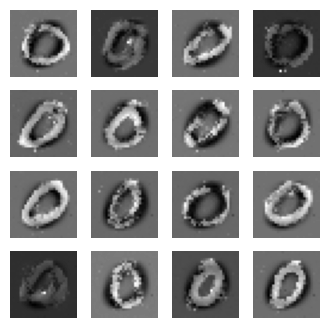

134
real_output: tf.Tensor(
[[ 0.8968401]
 [ 2.1418402]
 [-0.9702103]
 [ 2.5487263]
 [ 0.1041462]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.34531233]
 [-0.79245925]
 [-1.9577799 ]
 [-3.6962037 ]
 [-2.5755413 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4702363, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19448732, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16910563, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9323928]
 [2.1066027]
 [2.0561574]
 [2.59775  ]
 [1.6412194]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5587442]
 [-2.0151658]
 [-1.0838935]
 [-0.3069472]
 [-3.1860042]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.123074, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18877594, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22063123, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3772898]
 [2.2476187]
 [2.121613 ]
 [3.1055026]
 [2.366908 ]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[ 0.71206284]
 [ 3.496487  ]
 [ 0.9293293 ]
 [-0.4824833 ]
 [ 2.6962109 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0260136]
 [-1.3544997]
 [ 1.7617404]
 [-2.0511284]
 [-2.999755 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1263814, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23931223, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2746246, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8718772 ]
 [0.44577613]
 [2.6186748 ]
 [1.3817568 ]
 [0.5440929 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.028612  ]
 [-1.635885  ]
 [-0.40954655]
 [-2.2812638 ]
 [-1.7656156 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.951091, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22328718, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.32601723, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.251743 ]
 [2.2327454]
 [3.1437452]
 [1.6667049]
 [1.8807065]], shape=(5, 1), dtype=float32)
fake_out

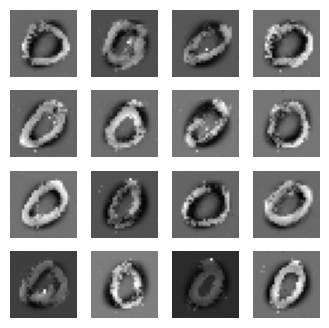

135
real_output: tf.Tensor(
[[2.683171  ]
 [2.1390066 ]
 [2.4060094 ]
 [0.99233544]
 [3.4631078 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1852368]
 [-1.6276426]
 [-1.8845023]
 [-2.7013533]
 [-4.0370774]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1157377, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19183128, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.261151, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0370662 ]
 [0.28889045]
 [2.2047677 ]
 [0.91147524]
 [1.2585875 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.546743 ]
 [-1.3955079]
 [-1.0630674]
 [-0.6097663]
 [-7.7608933]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0265355, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18413223, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31369108, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.97745  ]
 [-0.832184 ]
 [ 1.7989172]
 [ 2.4019618]
 [ 1.2415144]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[-0.20506418]
 [ 1.582895  ]
 [ 1.6664593 ]
 [ 0.53820026]
 [ 1.1366954 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1827242]
 [-2.4893723]
 [-3.6240697]
 [-1.3962525]
 [-2.2504723]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.227077, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2905882, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2416569, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.4257142 ]
 [ 2.9097207 ]
 [-0.30523974]
 [ 2.652927  ]
 [ 2.8647258 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4970363]
 [-3.3780518]
 [-2.4185069]
 [-3.3091855]
 [-3.3234508]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0589368, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24569097, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2952928, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2675946]
 [1.4721006]
 [1.7153187]
 [2.3696806]
 [1.5392516]], shape=(5, 1), dtype=float32)
fake_outpu

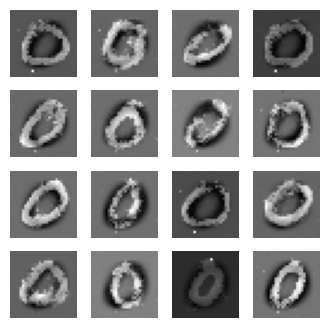

136
real_output: tf.Tensor(
[[0.7484653]
 [2.0712137]
 [1.1888912]
 [3.564684 ]
 [2.4244106]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.79969203]
 [-1.7025895 ]
 [-3.8362775 ]
 [-0.11183332]
 [-2.279825  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8425884, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24197648, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.32161096, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1017907 ]
 [1.2304542 ]
 [0.9409214 ]
 [0.98036504]
 [2.0107112 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6648854 ]
 [-2.5551012 ]
 [-1.7765574 ]
 [-1.9185483 ]
 [-0.60094666]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.013472, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3017041, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29546928, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.73166364]
 [0.6246459 ]
 [1.1684482 ]
 [2.8050978 ]
 [1.8508967 ]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[1.7121711 ]
 [2.1922731 ]
 [0.03288288]
 [1.0729887 ]
 [1.1843722 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.5217555 ]
 [-1.3810669 ]
 [-1.7488654 ]
 [-0.89039594]
 [-2.3342397 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.256845, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1924512, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22831017, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1138616]
 [2.0114145]
 [2.8677697]
 [0.7370915]
 [4.3095894]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.015848 ]
 [-5.2911744]
 [-4.04832  ]
 [-2.7703712]
 [-2.682844 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.256226, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22611246, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23727354, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6846181 ]
 [1.0166897 ]
 [0.91685826]
 [2.1246593 ]
 [0.9229546 ]], shape=(5, 1), dtype=float32)
fake_output: t

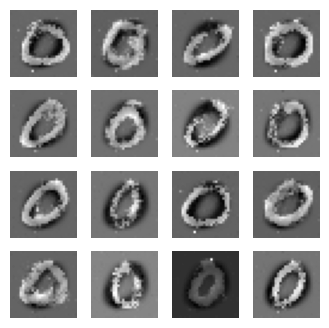

137
real_output: tf.Tensor(
[[2.7323985]
 [2.816237 ]
 [0.7870935]
 [1.6175151]
 [0.3395282]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 2.5297766 ]
 [-1.9230824 ]
 [-5.37171   ]
 [-0.03535043]
 [-1.3040946 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.234888, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21433061, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26166686, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4828784 ]
 [2.749192  ]
 [0.05187791]
 [3.127416  ]
 [0.45070451]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.12871712]
 [-1.4261471 ]
 [-0.9057961 ]
 [-1.1961834 ]
 [ 0.57703316]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1482716, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23368329, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2613685, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.8903943 ]
 [0.38592348]
 [2.5423722 ]
 [2.1313407 ]
 [0.6339486 ]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[0.4661657]
 [0.7860084]
 [1.7705483]
 [1.8298527]
 [2.8870254]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3147244 ]
 [-3.8762212 ]
 [-1.3438677 ]
 [-0.67431253]
 [-1.2724572 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1849504, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.32507867, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2575863, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.94762474]
 [-1.0937612 ]
 [ 1.4032943 ]
 [ 1.3806477 ]
 [ 0.57344633]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.60737926]
 [-1.4137031 ]
 [-0.7510558 ]
 [-2.5118732 ]
 [-1.5967914 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2522087, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30879033, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23951453, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.48043314]
 [ 1.0226687 ]
 [ 2.5897112 ]
 [ 1.5752691 ]
 [-0.04166613]], shape=(5, 1), dtype=float3

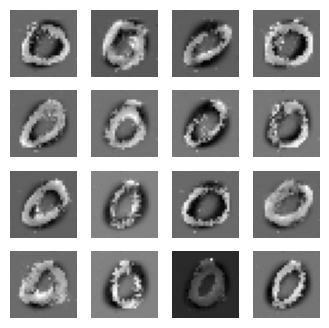

138
real_output: tf.Tensor(
[[-0.42562175]
 [ 1.7411412 ]
 [ 0.9285635 ]
 [ 0.99733007]
 [ 2.877745  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9862448]
 [-0.6913117]
 [-1.463894 ]
 [-1.53042  ]
 [-0.4645815]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.311225, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23207466, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2064273, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.9864832 ]
 [1.3236772 ]
 [0.82542694]
 [0.87804437]
 [2.0912006 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6243095]
 [-2.6439471]
 [-2.3392162]
 [-3.6464698]
 [-2.1108837]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3644838, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22380264, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19226435, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9535451 ]
 [ 1.139236  ]
 [ 2.9621453 ]
 [-0.03639882]
 [ 2.7229512 ]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[2.5173116]
 [3.7381055]
 [0.5733065]
 [2.2425623]
 [2.7752903]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.481314  ]
 [-0.61075884]
 [-1.484915  ]
 [-3.4089346 ]
 [-4.4510484 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2322538, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22897226, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2678852, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.217967 ]
 [0.817806 ]
 [2.3790925]
 [3.934958 ]
 [1.6896241]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.743056  ]
 [-0.01748183]
 [-2.8484359 ]
 [-0.38291648]
 [-1.0374057 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.264566, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24622093, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2070792, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.3687298 ]
 [-0.03132623]
 [ 0.45251042]
 [ 1.0651114 ]
 [ 3.2955372 ]], shape=(5, 1), dtype=float32)
fake_outp

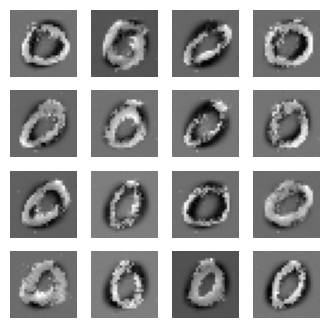

139
real_output: tf.Tensor(
[[3.0594757]
 [1.3227409]
 [1.7641078]
 [1.6153542]
 [2.510435 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4562868 ]
 [-3.2251248 ]
 [ 0.7327572 ]
 [-0.8113481 ]
 [ 0.54698884]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0929992, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20133312, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23374335, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2019804 ]
 [1.243665  ]
 [0.95189714]
 [3.5163546 ]
 [2.7704785 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.490403  ]
 [-4.560775  ]
 [-0.03386257]
 [-2.9789214 ]
 [-1.7677543 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2124867, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14506963, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27769232, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.9825476]
 [2.2983072]
 [2.107532 ]
 [2.1228595]
 [3.2773988]], shape=(5, 1), dtype=float32)
fake_ou

real_output: tf.Tensor(
[[1.5127647]
 [0.9385532]
 [1.0963463]
 [1.2746842]
 [1.1967785]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8053082]
 [-1.0729634]
 [-3.0577552]
 [-0.9513627]
 [-3.1268635]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2236028, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25127938, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2142641, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3596733 ]
 [0.16683757]
 [2.296941  ]
 [1.6959606 ]
 [1.0710858 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.3205299 ]
 [-2.7441978 ]
 [-2.1676786 ]
 [-0.75203145]
 [-3.6387517 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2707088, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24901572, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21659179, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.0766783 ]
 [ 1.3528981 ]
 [ 3.84196   ]
 [ 2.9667513 ]
 [-0.11243411]], shape=(5, 1), dtype=float32)
fake_ou

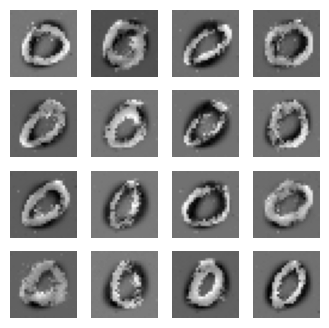

140
real_output: tf.Tensor(
[[2.7648327]
 [1.1718044]
 [2.0962098]
 [1.5859171]
 [2.9629629]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.38943824]
 [-0.39483166]
 [-0.69311756]
 [-5.2160573 ]
 [-1.6635817 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2350261, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18024094, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23125151, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6324203]
 [2.1228957]
 [1.9887813]
 [1.4431666]
 [2.0331101]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.046408 ]
 [-3.082815 ]
 [-0.9091841]
 [-5.237818 ]
 [-1.0444924]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.233592, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14211553, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23341678, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.57932866]
 [ 2.719325  ]
 [ 2.4179897 ]
 [-0.3132365 ]
 [ 1.0499487 ]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[2.2897234 ]
 [1.3341384 ]
 [2.0526447 ]
 [0.05037153]
 [0.8526665 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6089569]
 [-1.666197 ]
 [-1.3096949]
 [-3.7819443]
 [-1.7846242]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1655889, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29439178, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22957806, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.679328  ]
 [0.79055125]
 [1.0401483 ]
 [1.7115574 ]
 [4.594356  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2511245 ]
 [-3.5892882 ]
 [-1.1032069 ]
 [-0.479889  ]
 [-0.49399778]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3175275, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.40789613, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20423016, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6164573 ]
 [0.82347965]
 [1.1237187 ]
 [2.3361194 ]
 [0.9740539 ]], shape=(5, 1), dtype=float32)
fake_o

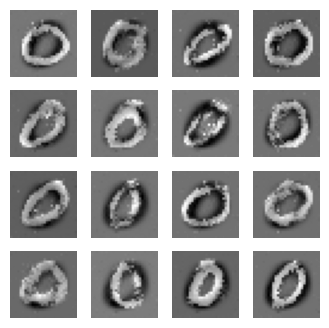

141
real_output: tf.Tensor(
[[1.5218202]
 [2.1807795]
 [3.2039075]
 [3.4832442]
 [1.2895336]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5520486]
 [-3.5011616]
 [-2.4454958]
 [-2.7492645]
 [-1.1667265]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9907368, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16129664, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27097207, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.9559383 ]
 [ 0.36979648]
 [ 2.7319827 ]
 [-1.7967418 ]
 [ 1.5766035 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8111775]
 [-2.7801661]
 [-1.9172691]
 [-1.5207816]
 [-2.0971944]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0676184, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28026053, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2532458, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.27364403]
 [ 3.2758622 ]
 [ 1.542267  ]
 [ 1.9706838 ]
 [ 0.7002786 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[-0.9073935 ]
 [ 3.736509  ]
 [ 1.0751563 ]
 [-0.41273934]
 [ 2.5578563 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.5456727]
 [-2.0118396]
 [ 1.3831104]
 [-4.5382175]
 [ 0.3507989]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1110873, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.5210775, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3413353, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.9572246]
 [1.3070167]
 [2.298116 ]
 [0.9284059]
 [3.5775805]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.673735 ]
 [-2.1977973]
 [-2.195863 ]
 [-2.3164499]
 [-1.1456088]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.079294, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18005922, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26184678, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.451744  ]
 [ 1.4003878 ]
 [ 1.6591178 ]
 [ 0.81450534]
 [-0.01530336]], shape=(5, 1), dtype=float32)
fake_outp

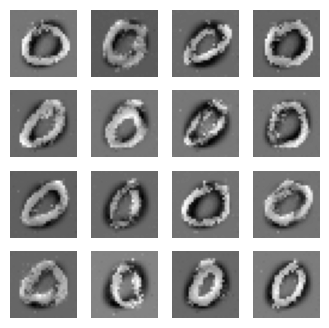

142
real_output: tf.Tensor(
[[2.8390162]
 [1.136324 ]
 [1.6945971]
 [2.8002114]
 [2.0446458]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1819444 ]
 [-0.513838  ]
 [-0.25695413]
 [-2.473692  ]
 [-0.66365427]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1017551, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19691925, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23581752, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.446048  ]
 [4.910592  ]
 [1.9723724 ]
 [0.67356455]
 [2.0755315 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7743871]
 [-2.8511188]
 [ 2.329215 ]
 [-2.1243434]
 [-1.9572332]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1895332, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18245703, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27028993, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.4151998 ]
 [ 1.8559922 ]
 [ 0.8058289 ]
 [-0.00815093]
 [ 0.5149066 ]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[3.9879565 ]
 [1.668188  ]
 [0.40659168]
 [1.9047246 ]
 [1.205653  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.037367 ]
 [-2.779874 ]
 [-3.6795387]
 [-2.8834102]
 [-1.1272486]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.125293, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19625002, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25222918, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.95732874]
 [1.8786446 ]
 [4.886277  ]
 [0.26295668]
 [5.511551  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.0891628]
 [-2.547851 ]
 [-2.6435905]
 [-1.5656329]
 [-0.0635062]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4723458, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15751858, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17982203, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.7449285 ]
 [ 0.34386304]
 [ 0.12046842]
 [ 1.5737457 ]
 [-0.5687292 ]], shape=(5, 1), dtype=float32)
fake_ou

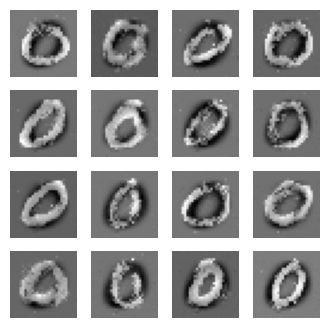

143
real_output: tf.Tensor(
[[3.4572663]
 [1.5661973]
 [1.7301   ]
 [1.7730421]
 [3.5393686]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9486358 ]
 [-2.1983397 ]
 [-2.291891  ]
 [-0.80567944]
 [-1.9492742 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1772337, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19752792, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2476058, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.3662094]
 [-1.6776848]
 [ 2.519646 ]
 [ 1.7500331]
 [ 1.5169442]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6826266]
 [-3.4731295]
 [-2.9110947]
 [-2.7285135]
 [-2.3865476]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2301457, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3559073, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24684359, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6843193]
 [1.1781092]
 [1.8056023]
 [2.7014985]
 [2.2215528]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[0.8300373 ]
 [3.0151649 ]
 [1.7497252 ]
 [0.41760427]
 [1.7980279 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6908516 ]
 [ 0.32074696]
 [-5.5393705 ]
 [-3.1566064 ]
 [ 0.0214165 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3712773, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20286974, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2324272, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.956394  ]
 [2.807724  ]
 [1.7692437 ]
 [0.05271244]
 [1.4535589 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3975314]
 [ 0.7021122]
 [-2.0694602]
 [-2.1443355]
 [-3.699191 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4874883, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18174723, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26856458, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0164256]
 [2.3509755]
 [3.821432 ]
 [1.6907022]
 [2.8048134]], shape=(5, 1), dtype=float32)
fake_output:

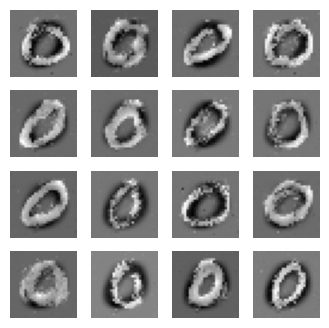

144
real_output: tf.Tensor(
[[0.88195145]
 [3.1666677 ]
 [2.1720188 ]
 [2.8518007 ]
 [3.7001448 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0850322 ]
 [-2.055547  ]
 [-0.10867869]
 [-4.0681214 ]
 [-2.4124298 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.357358, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1992799, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2697865, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6832042]
 [1.4137853]
 [3.3882475]
 [1.362008 ]
 [4.102036 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.5741158]
 [-3.2358804]
 [-2.9821749]
 [-4.8078156]
 [-3.0898538]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6235466, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17034319, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17166722, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3683969]
 [1.621689 ]
 [3.3281767]
 [3.0345926]
 [1.8408415]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[2.5838475]
 [2.4543705]
 [3.9825475]
 [1.5911549]
 [0.7375072]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.2356774]
 [-2.3614976]
 [-1.4596184]
 [-3.1170223]
 [-3.4913032]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.198031, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21833499, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2648611, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.002882 ]
 [1.7617129]
 [2.3886309]
 [3.5826359]
 [1.0135101]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.84072375]
 [-0.4140215 ]
 [-3.7181478 ]
 [-3.8386436 ]
 [-0.5038028 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2191906, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2184427, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21885896, shape=(), dtype=float32)


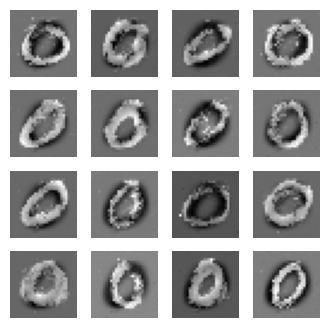

145
real_output: tf.Tensor(
[[3.5683615]
 [1.598803 ]
 [1.816637 ]
 [2.979326 ]
 [2.1204426]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.67875594]
 [-2.2489402 ]
 [-2.1976154 ]
 [-1.4970655 ]
 [-1.8397841 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4771895, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17772944, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19585854, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3403113 ]
 [0.63005865]
 [0.53803706]
 [2.1593764 ]
 [2.5501292 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5695536]
 [-3.3795722]
 [-6.1259575]
 [-2.2731483]
 [-1.0935585]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5139327, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30637378, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22554873, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5673127 ]
 [ 1.544432  ]
 [ 2.5917003 ]
 [-0.45703033]
 [ 0.90283847]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[3.2537804]
 [3.0378954]
 [2.5189075]
 [1.7826012]
 [1.9260191]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.65704006]
 [-2.8580465 ]
 [-2.0150719 ]
 [-4.3713107 ]
 [-3.3806648 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2585826, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17593607, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2207121, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.55549   ]
 [ 3.489051  ]
 [-0.59492916]
 [ 2.419238  ]
 [ 2.107814  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.6899861 ]
 [-2.3862891 ]
 [-3.2878838 ]
 [-0.04104559]
 [-3.3027048 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4834251, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27716258, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2043955, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1037188]
 [3.1783977]
 [2.033203 ]
 [3.3444352]
 [1.3106285]], shape=(5, 1), dtype=float32)
fake_out

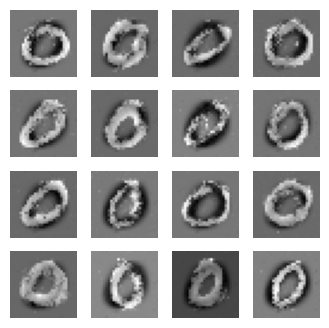

146
real_output: tf.Tensor(
[[2.4670002 ]
 [1.0823709 ]
 [3.1291792 ]
 [1.8825451 ]
 [0.59863275]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.8743819]
 [-2.7182884]
 [-2.9273183]
 [-1.239612 ]
 [-1.5533358]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0996366, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20587806, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23467928, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.119129 ]
 [2.8102121]
 [3.188503 ]
 [0.6535221]
 [2.5242825]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0611138 ]
 [-1.9701676 ]
 [-1.984195  ]
 [ 0.26224977]
 [-0.5702413 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1983576, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31938145, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23470409, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.7797443 ]
 [ 0.45146236]
 [ 0.10199007]
 [ 0.59348816]
 [ 1.7085606 ]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[1.5719854]
 [1.4303888]
 [2.7144804]
 [0.7987666]
 [3.5612087]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.24687609]
 [-2.7688506 ]
 [ 0.10746088]
 [-0.40969214]
 [ 0.94887316]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0313284, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22575498, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24981901, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.5032152 ]
 [-0.16647881]
 [-0.8435563 ]
 [ 2.703554  ]
 [ 1.3983047 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.8161269]
 [-1.3540766]
 [-1.7871332]
 [-1.7108605]
 [-1.0632393]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3668482, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31814858, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17619233, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.1201806 ]
 [ 3.410687  ]
 [-0.12260531]
 [ 2.4661975 ]
 [ 0.80698085]], shape=(5, 1), dtype=float32)
f

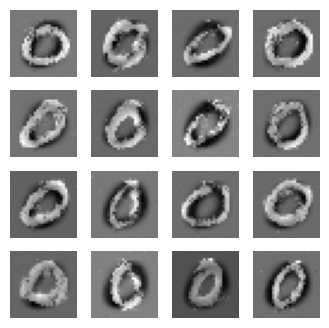

147
real_output: tf.Tensor(
[[3.8443382 ]
 [0.33084488]
 [1.190264  ]
 [1.7174306 ]
 [0.03401459]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.72370946]
 [-2.4316034 ]
 [-1.1618243 ]
 [-4.4599385 ]
 [-1.7560395 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2477195, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31905782, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2644081, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0950382]
 [4.0550833]
 [2.8071575]
 [2.2740724]
 [1.7514997]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6729856 ]
 [-1.5113614 ]
 [ 0.14608723]
 [-0.31421083]
 [-2.1989558 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3579688, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1823052, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20593664, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9198117]
 [1.8758683]
 [2.463823 ]
 [3.9582715]
 [2.6024446]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[2.062728  ]
 [2.2336416 ]
 [1.4137187 ]
 [0.05643172]
 [0.3508975 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7070087]
 [-4.2313967]
 [-0.5202506]
 [-2.6483471]
 [-4.159113 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2855558, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3973843, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21534264, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.3580667 ]
 [ 2.0615609 ]
 [-0.30265754]
 [ 1.6622701 ]
 [ 0.87308747]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0968915 ]
 [-2.2816849 ]
 [ 0.7501133 ]
 [ 0.05172832]
 [-4.224912  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2184129, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2998133, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24074289, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.7434368 ]
 [-0.21261041]
 [ 1.6101211 ]
 [ 1.6488832 ]
 [ 2.4998028 ]], shape=(5, 1), dtype=float32

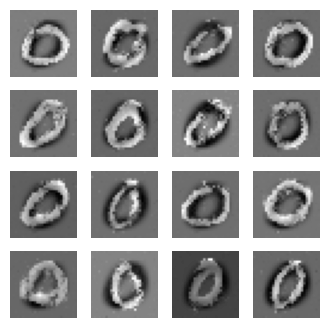

148
real_output: tf.Tensor(
[[1.082445 ]
 [3.594233 ]
 [2.4994535]
 [2.2998288]
 [1.3010529]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2358093]
 [-1.8669959]
 [-3.02724  ]
 [-2.173902 ]
 [-3.200812 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1704907, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16935772, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2618745, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3403317 ]
 [2.0775473 ]
 [2.4847198 ]
 [1.8187926 ]
 [0.16546011]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0515528]
 [-2.21655  ]
 [-4.110517 ]
 [ 0.2608065]
 [-2.3210707]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.044213, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18205103, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29867786, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.3164908 ]
 [2.4327326 ]
 [3.2273831 ]
 [0.48041645]
 [1.6430132 ]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[0.6930824]
 [1.1088797]
 [1.416135 ]
 [2.041133 ]
 [2.7410798]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4004343]
 [-2.9640708]
 [-3.2683673]
 [-4.01763  ]
 [-2.6055741]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0833292, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1920566, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28441274, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.70592016]
 [-1.9127815 ]
 [ 4.01212   ]
 [ 0.30235696]
 [ 2.7078536 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.056032 ]
 [-2.275429 ]
 [-1.8955204]
 [-1.5262344]
 [-3.5652087]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3691905, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37134087, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19951162, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5902025 ]
 [3.260632  ]
 [0.88631594]
 [1.6699582 ]
 [2.224066  ]], shape=(5, 1), dtype=float32)
fake_output:

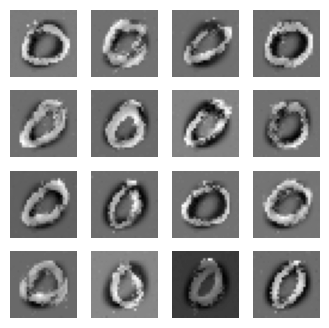

149
real_output: tf.Tensor(
[[ 1.8038744]
 [ 2.2273126]
 [-0.4194895]
 [ 2.0829008]
 [ 2.8401346]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4464827 ]
 [ 0.10570186]
 [-2.3123617 ]
 [-3.496547  ]
 [ 0.9135541 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0755682, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3475942, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25425926, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0864394 ]
 [0.22855572]
 [1.6271915 ]
 [1.6361035 ]
 [2.172632  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.1092834 ]
 [-0.18458267]
 [-2.245278  ]
 [-1.9168003 ]
 [ 3.9641213 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.338852, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1975736, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26958394, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.47934386]
 [2.9715621 ]
 [2.3588588 ]
 [2.7472072 ]
 [1.7126789 ]], shape=(5, 1), dtype=float32)


real_output: tf.Tensor(
[[0.82748073]
 [2.1681004 ]
 [0.46929428]
 [0.70167285]
 [3.1802256 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1558814 ]
 [ 0.6078288 ]
 [-3.9722493 ]
 [-0.860468  ]
 [-0.29224685]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0106366, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18021378, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29252434, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5483841]
 [1.3211092]
 [3.8145657]
 [1.6326982]
 [3.5209446]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3247125 ]
 [ 0.05016525]
 [-1.3608025 ]
 [-2.5145793 ]
 [-0.41333503]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2112613, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37635764, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22348225, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2425072]
 [1.9255427]
 [2.289872 ]
 [2.5472398]
 [1.6981114]], shape=(5, 1), dtype=float32)
fake_output

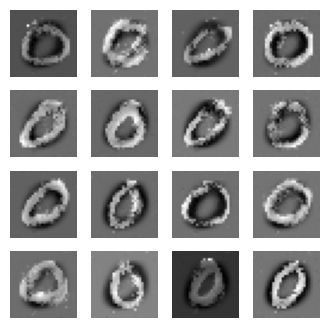

150
real_output: tf.Tensor(
[[1.2329501 ]
 [0.39907768]
 [2.953954  ]
 [1.5979388 ]
 [2.3226297 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3590744 ]
 [-3.211991  ]
 [-3.1308706 ]
 [-0.92114836]
 [-5.9897876 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.333783, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20756552, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20819613, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.16338  ]
 [1.6826094]
 [2.7778397]
 [3.8964512]
 [1.8380319]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.86871916]
 [-2.3080742 ]
 [-3.3852694 ]
 [-2.2111685 ]
 [-3.1797996 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3068218, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15449713, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2140555, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0193007]
 [1.8277891]
 [1.5326396]
 [2.45133  ]
 [4.329591 ]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[1.9724237]
 [1.4292885]
 [1.3833143]
 [4.12292  ]
 [1.6935968]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8546318 ]
 [-2.923914  ]
 [-0.56048095]
 [-1.3295175 ]
 [-2.8671741 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.012998, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37055033, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26460764, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.3352804 ]
 [-0.14047572]
 [ 1.4058553 ]
 [ 0.6079502 ]
 [ 2.4070113 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.30604216]
 [-3.9379487 ]
 [-0.8283243 ]
 [-1.3119053 ]
 [-4.1751647 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2919705, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23696065, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2026064, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2630413]
 [4.490313 ]
 [3.699135 ]
 [1.9832051]
 [4.303179 ]], shape=(5, 1), dtype=float32)
fake_out

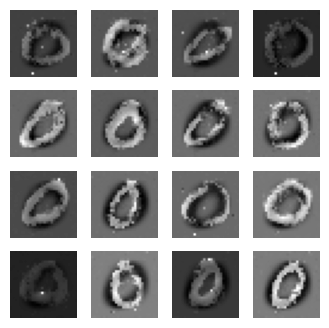

151
real_output: tf.Tensor(
[[1.4088647]
 [3.5491083]
 [2.0828776]
 [4.1848035]
 [3.2277172]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1581059]
 [-4.0300317]
 [-3.1179745]
 [-2.921608 ]
 [-2.6617463]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5735304, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25910014, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16980031, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-1.5892318]
 [ 1.7470037]
 [ 1.4261454]
 [ 2.6804466]
 [ 2.2513514]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1143713]
 [-0.3635148]
 [-2.623888 ]
 [ 1.2734436]
 [-2.7081802]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4483755, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3866449, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22785707, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.01702842]
 [ 2.822873  ]
 [ 1.9542388 ]
 [ 2.8205643 ]
 [ 1.6822585 ]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[1.0890509 ]
 [1.7169083 ]
 [0.97877675]
 [3.4832997 ]
 [3.392274  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.575747 ]
 [-2.5161736]
 [-0.4034386]
 [-2.3162785]
 [-1.5358226]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5312488, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16285756, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2010192, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.3585348 ]
 [ 3.0234342 ]
 [-0.25710878]
 [ 0.86101055]
 [ 0.29340467]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.5708942]
 [-4.5486517]
 [-3.0159194]
 [-3.8501837]
 [-0.5514777]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.461337, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.33824235, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19509727, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.8742336 ]
 [1.7371763 ]
 [1.2182267 ]
 [0.15378653]
 [0.8268298 ]], shape=(5, 1), dtype=float32)
fake_out

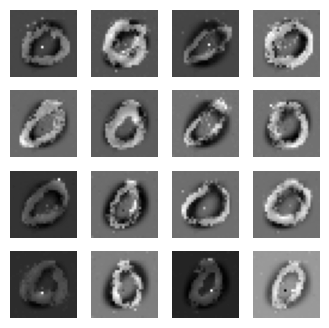

152
real_output: tf.Tensor(
[[ 2.560951 ]
 [-0.5419707]
 [ 3.372046 ]
 [ 2.5949125]
 [ 3.325207 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.98156387]
 [ 0.5823708 ]
 [ 0.5189071 ]
 [-2.3870573 ]
 [-2.4979599 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0182495, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20687002, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3214326, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9388113]
 [1.9996674]
 [1.3920839]
 [2.0621903]
 [5.140398 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3390357]
 [-1.9876134]
 [-3.0503576]
 [-1.7462791]
 [-2.7044005]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1288285, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.113381445, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24789964, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5090563]
 [2.1383955]
 [3.5698318]
 [3.8548656]
 [2.016674 ]], shape=(5, 1), dtype=float32)
fake_output:

real_output: tf.Tensor(
[[0.65258765]
 [1.9243915 ]
 [1.6804411 ]
 [1.5454125 ]
 [2.5773556 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8747737 ]
 [-4.2048745 ]
 [-2.1871178 ]
 [-6.3557525 ]
 [-0.66999567]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2873476, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13353102, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28677127, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5437452 ]
 [1.519047  ]
 [0.67907625]
 [3.8467064 ]
 [1.7821573 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4269557 ]
 [-2.4305382 ]
 [-0.805132  ]
 [-3.0339313 ]
 [-0.51552945]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2439609, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27454036, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23646286, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.754719  ]
 [0.12386973]
 [0.43334323]
 [1.710298  ]
 [1.0294665 ]], shape=(5, 1), dtype=float32)
f

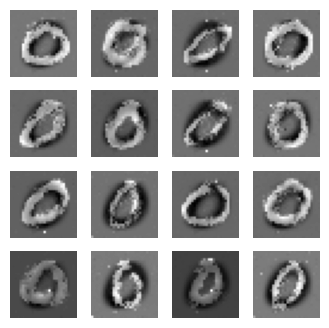

153
real_output: tf.Tensor(
[[6.009288 ]
 [2.2937078]
 [2.6371264]
 [0.4443602]
 [1.7274116]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5572653]
 [-1.8586804]
 [-2.4291215]
 [-4.004539 ]
 [-2.3063407]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3162394, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24245703, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19560632, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8076402]
 [0.7507743]
 [4.3313284]
 [2.5147176]
 [2.1277575]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.2569782 ]
 [ 0.279092  ]
 [-1.9075452 ]
 [ 0.253308  ]
 [-0.38091904]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.502585, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1799905, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21549907, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.01110936]
 [0.59299135]
 [0.4259807 ]
 [1.3985287 ]
 [3.2650251 ]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[ 2.8985612 ]
 [-0.18176186]
 [ 1.2548355 ]
 [ 1.491251  ]
 [ 2.1983268 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1961789 ]
 [-1.8645296 ]
 [ 0.52604747]
 [-5.311672  ]
 [-0.45107388]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.203001, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19425745, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23305234, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0167495]
 [3.3499064]
 [2.3621683]
 [1.775833 ]
 [3.8921094]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.281175  ]
 [-1.1510559 ]
 [-1.5844196 ]
 [-3.08851   ]
 [ 0.05890883]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3952591, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27271935, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21344593, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3793693]
 [1.942606 ]
 [1.9951427]
 [1.4132617]
 [1.3774958]], shape=(5, 1), dtype=float32)
fake_ou

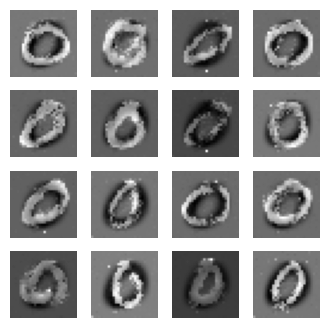

154
real_output: tf.Tensor(
[[2.989069  ]
 [1.3581066 ]
 [0.53711706]
 [2.4026527 ]
 [1.3926042 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9595141]
 [-2.4254217]
 [-0.9902871]
 [-0.9524343]
 [-1.687957 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3685622, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16019669, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19029972, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7192572]
 [1.4326878]
 [2.93838  ]
 [1.517274 ]
 [1.7506057]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.04309  ]
 [-4.354853 ]
 [-1.0489398]
 [-1.9795946]
 [-2.9779613]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.250944, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2009744, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2360791, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.13167292]
 [3.16206   ]
 [0.86002976]
 [0.43359357]
 [1.5468092 ]], shape=(5, 1), dtype=float32)
fake_output: tf

real_output: tf.Tensor(
[[2.1489863]
 [3.8848798]
 [3.1499143]
 [3.7996492]
 [2.5583084]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0223982]
 [-3.0293846]
 [-1.2949355]
 [-3.0236886]
 [-1.1785171]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4570136, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23296206, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23472778, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1234248 ]
 [1.182923  ]
 [0.62841237]
 [4.3311095 ]
 [2.5557206 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0210204]
 [-2.5819514]
 [-2.6965983]
 [-3.955468 ]
 [-2.5380836]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.401352, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20277762, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21947563, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5551552 ]
 [0.66978675]
 [2.405368  ]
 [2.493733  ]
 [1.0709672 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

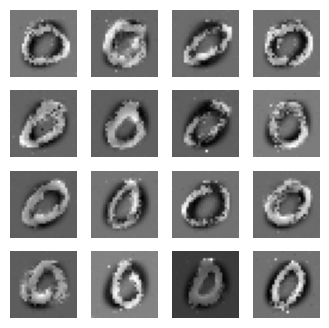

155
real_output: tf.Tensor(
[[3.9463282]
 [1.5210528]
 [2.352178 ]
 [1.323481 ]
 [1.5859802]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.90219283]
 [-3.1132529 ]
 [-2.3446128 ]
 [-2.6734385 ]
 [-1.4411309 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1619334, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2405393, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23463514, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7699327]
 [1.7501218]
 [3.0329018]
 [2.586512 ]
 [1.991662 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7294394]
 [-0.888484 ]
 [-2.5406861]
 [-0.6825075]
 [-0.1939659]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4777894, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15742475, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22460607, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.116778 ]
 [2.3755789]
 [1.6449671]
 [1.4640677]
 [3.6554856]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[ 0.95831424]
 [-0.9853118 ]
 [ 2.0419    ]
 [ 0.1765137 ]
 [-1.2808793 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6566479]
 [-5.7894993]
 [-2.8335822]
 [-1.5649707]
 [-1.2971977]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.469587, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3910742, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2092818, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.9110446 ]
 [ 2.7966044 ]
 [ 0.8985736 ]
 [-1.0751376 ]
 [ 0.66055125]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8780084]
 [-2.4842713]
 [-2.2298923]
 [-2.31286  ]
 [-2.2689788]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7794828, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24633047, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1593129, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0397758 ]
 [1.709211  ]
 [2.385253  ]
 [0.7974681 ]
 [0.37445244]], shape=(5, 1), dtype=float32)
fake_

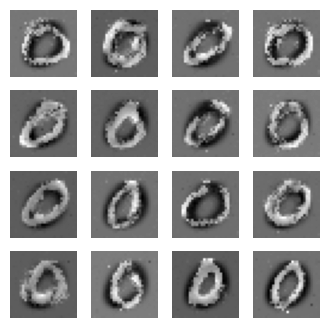

156
real_output: tf.Tensor(
[[ 1.9154098]
 [ 3.6723173]
 [ 2.128504 ]
 [ 2.0856993]
 [-0.6094711]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.01361176]
 [-1.677509  ]
 [-4.9194217 ]
 [-1.3634958 ]
 [-2.498243  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2044506, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16070116, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26711413, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.36323637]
 [ 3.1393073 ]
 [ 3.5632386 ]
 [ 1.301744  ]
 [ 1.7480974 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.28856635]
 [-3.4670994 ]
 [ 1.2144632 ]
 [-2.4513903 ]
 [-0.1096065 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0507526, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2000449, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30638534, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9226735]
 [ 2.705142 ]
 [ 2.4943314]
 [-1.0893135]
 [ 4.084303 ]], shape=(5, 1), dtype=fl

real_output: tf.Tensor(
[[-0.44454768]
 [ 1.2706323 ]
 [ 1.3535953 ]
 [ 0.8477394 ]
 [ 1.0461204 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5812345]
 [ 0.2190927]
 [ 0.5897662]
 [-2.397351 ]
 [-1.7561185]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4349446, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.32852018, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20779699, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.1119566]
 [1.8763492]
 [1.1359987]
 [1.459386 ]
 [2.4751778]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4034576]
 [-2.396744 ]
 [-2.0974348]
 [-2.4416196]
 [-3.950622 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4248414, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2841457, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21470715, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8819466]
 [2.393195 ]
 [2.0295115]
 [2.457304 ]
 [3.3721108]], shape=(5, 1), dtype=float32)
fake_output: tf.T

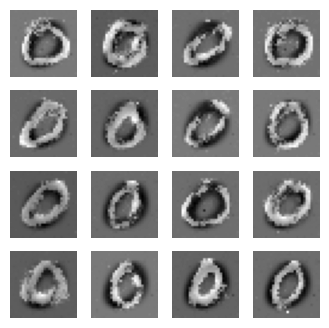

157
real_output: tf.Tensor(
[[2.5124044]
 [2.5763547]
 [1.5076729]
 [1.9313189]
 [2.3077416]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.8728886]
 [-4.456326 ]
 [-1.0954894]
 [-1.7774309]
 [-1.4989246]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.332096, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13373768, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20091212, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.621142 ]
 [3.4463696]
 [1.647271 ]
 [1.8103086]
 [3.685288 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.7310646 ]
 [-6.8067827 ]
 [-2.2848513 ]
 [-0.04030856]
 [ 0.39212337]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1923795, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13061772, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29145598, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6181688]
 [2.697907 ]
 [3.0824304]
 [1.9837828]
 [1.4631768]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

real_output: tf.Tensor(
[[2.2108197]
 [2.3164399]
 [3.5102308]
 [2.6648629]
 [2.1577485]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5953112]
 [-2.5921166]
 [-3.6217988]
 [-5.063283 ]
 [-4.9478455]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1004028, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17913717, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2625264, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.595896  ]
 [2.304167  ]
 [3.1121643 ]
 [3.0679185 ]
 [0.39729524]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4950522 ]
 [-2.3790083 ]
 [-2.4365175 ]
 [-0.09470255]
 [ 0.5763919 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0505564, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14865658, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26833546, shape=(), dtype=float32)


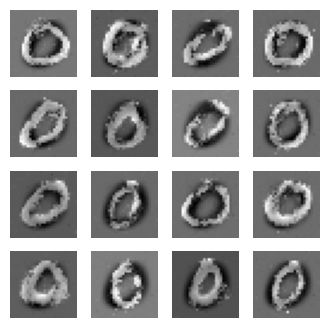

158
real_output: tf.Tensor(
[[ 2.2288961 ]
 [ 3.3692067 ]
 [-0.07277965]
 [ 0.12517345]
 [ 0.6371528 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.107982  ]
 [-1.266124  ]
 [-1.1808599 ]
 [-0.8636347 ]
 [ 0.14677954]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2877762, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37180504, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23450232, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.8413618 ]
 [ 1.0602403 ]
 [-0.01981692]
 [ 1.0699303 ]
 [ 1.1347902 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.01356621]
 [-2.2549713 ]
 [-2.5542364 ]
 [-1.2092767 ]
 [-3.4856875 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.642757, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28019428, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18152384, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.692974  ]
 [1.9140795 ]
 [0.9524551 ]
 [2.5706863 ]
 [0.40234613]], shape=(5, 1), dty

real_output: tf.Tensor(
[[2.7522008 ]
 [0.99887294]
 [0.5777715 ]
 [2.0378702 ]
 [1.7485244 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3347678]
 [-2.2923853]
 [-2.7189944]
 [-2.6913218]
 [-2.721544 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5427184, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22895397, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17951714, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3263686]
 [1.4440627]
 [2.2510674]
 [3.0012763]
 [2.0572164]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.2788343]
 [-2.5131297]
 [-0.4819104]
 [-3.5959342]
 [-4.0226064]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4907782, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20067038, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18733177, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.49103808]
 [2.0224771 ]
 [3.0013926 ]
 [1.4961104 ]
 [1.7954249 ]], shape=(5, 1), dtype=float32)
fake_output: tf.

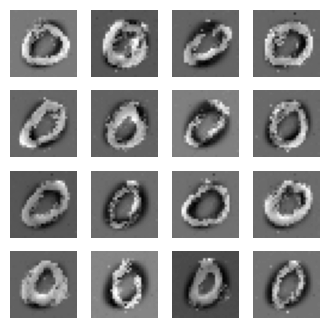

159
real_output: tf.Tensor(
[[1.6939154]
 [2.479239 ]
 [2.5861619]
 [2.345092 ]
 [2.3144097]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.458365 ]
 [-2.7956357]
 [-1.4159011]
 [-2.0872931]
 [-1.932762 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.370474, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15080744, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19153072, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.7460477]
 [1.9538554]
 [1.4592806]
 [1.8116114]
 [1.243665 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.78307956]
 [-3.1634448 ]
 [-2.729589  ]
 [-2.9820266 ]
 [-3.9870298 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4323773, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3374346, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20190395, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1758447 ]
 [2.4674115 ]
 [0.76080054]
 [1.8843958 ]
 [1.074723  ]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[3.3782408]
 [1.8111022]
 [2.6720283]
 [2.7359319]
 [1.912508 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9155300e+00]
 [-2.3344343e+00]
 [-8.5010457e-01]
 [ 2.5645532e-03]
 [ 1.0390329e-01]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0482807, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13676757, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2576911, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7991385]
 [2.9727502]
 [1.9886146]
 [2.5342946]
 [1.2085464]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9704283]
 [-1.4056818]
 [-2.8071516]
 [-2.2779543]
 [-2.5686507]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1879876, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19427466, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23497444, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.6029387 ]
 [ 0.42120215]
 [ 1.2334815 ]
 [ 2.3025613 ]
 [-0.8144398 ]], shape=(5, 1), dtype=float3

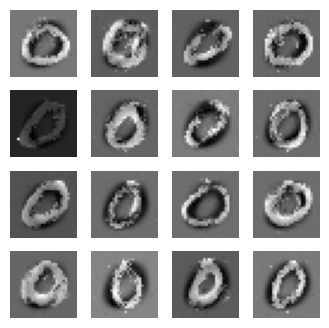

160
real_output: tf.Tensor(
[[3.0179882]
 [1.982726 ]
 [3.442406 ]
 [1.1328253]
 [5.193193 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.6712843 ]
 [-1.6654187 ]
 [-3.0425024 ]
 [-0.58519506]
 [-1.48696   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.184403, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1975126, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28419566, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2966316]
 [1.8111801]
 [4.0938473]
 [2.197295 ]
 [1.7698214]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0545685]
 [-4.5228176]
 [-3.253101 ]
 [-2.7488215]
 [-2.6969266]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2501857, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22214164, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21921095, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6141427]
 [2.1905143]
 [1.6552291]
 [1.7608451]
 [3.0679836]], shape=(5, 1), dtype=float32)
fake_output: tf.Ten

real_output: tf.Tensor(
[[1.2017591]
 [2.624605 ]
 [2.106504 ]
 [2.288088 ]
 [1.6821926]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.70581794]
 [-3.148533  ]
 [-3.1035187 ]
 [-2.884562  ]
 [-0.3698595 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3930554, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25426537, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26263198, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.37720153]
 [ 1.1717826 ]
 [ 1.2520684 ]
 [ 2.7470021 ]
 [ 0.26672602]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.4029572 ]
 [-2.6429484 ]
 [-0.72021544]
 [-3.3938723 ]
 [-2.975994  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.288721, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30201045, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24165355, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5153093 ]
 [1.2620783 ]
 [0.21874382]
 [3.1193547 ]
 [1.3794696 ]], shape=(5, 1), dtype=float32)
fa

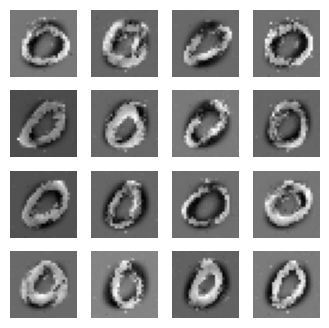

161
real_output: tf.Tensor(
[[3.1833003]
 [0.6556552]
 [2.8106983]
 [1.0210598]
 [2.71432  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3465745 ]
 [-0.5664646 ]
 [-0.96201295]
 [-2.1612403 ]
 [-5.40183   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3698928, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13576855, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24700464, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.751984  ]
 [ 3.576716  ]
 [ 1.2808491 ]
 [ 4.16578   ]
 [-0.55275476]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.27571195]
 [-1.3424855 ]
 [-0.16614595]
 [-2.568948  ]
 [-1.8532902 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5310388, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.42474133, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2258264, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4303935]
 [2.9428587]
 [2.0210018]
 [1.3835982]
 [2.1622877]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[1.377808 ]
 [2.8385956]
 [3.6653593]
 [3.688443 ]
 [2.9806883]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.464944  ]
 [-3.1908433 ]
 [-3.1857307 ]
 [-0.71064854]
 [-0.72761726]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.395608, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14139444, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22563101, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.2573226]
 [ 3.5653758]
 [ 0.808793 ]
 [ 1.3230591]
 [ 2.0886686]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.3855267 ]
 [-5.6079617 ]
 [-2.61141   ]
 [-0.49365193]
 [-2.2475471 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3543267, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18235007, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23925103, shape=(), dtype=float32)


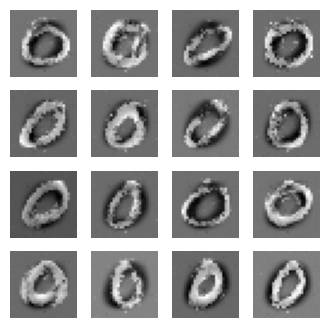

162
real_output: tf.Tensor(
[[2.223536 ]
 [1.5485733]
 [1.5262387]
 [2.186031 ]
 [1.9042294]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.6255906 ]
 [-0.86874646]
 [-3.8124578 ]
 [ 0.3153413 ]
 [-3.899629  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4045792, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.259961, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21961236, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9924222]
 [2.7001696]
 [3.3109517]
 [3.214304 ]
 [2.4938576]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.63264596]
 [-1.9812754 ]
 [-5.0744443 ]
 [-1.808689  ]
 [-2.1792603 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4234257, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09989942, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19996625, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5758344]
 [2.4768791]
 [6.7526817]
 [1.280455 ]
 [2.8329475]], shape=(5, 1), dtype=float32)
fake_output: t

real_output: tf.Tensor(
[[-0.1938873]
 [ 2.9543257]
 [ 1.755004 ]
 [ 1.837038 ]
 [ 1.4360179]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.77242666]
 [-6.4815087 ]
 [-3.0434575 ]
 [-3.542273  ]
 [-0.44427353]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3642278, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21351545, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24807715, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.85432   ]
 [1.4098164 ]
 [0.84493077]
 [1.5885473 ]
 [1.5610591 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.615872  ]
 [-0.32932666]
 [-1.8381623 ]
 [-2.5337234 ]
 [-3.1208556 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1551442, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23341984, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23955825, shape=(), dtype=float32)


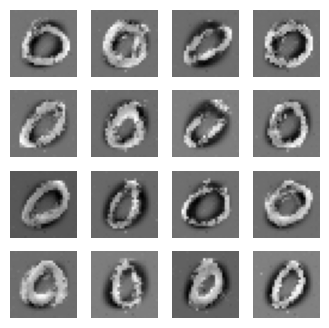

163
real_output: tf.Tensor(
[[2.181107 ]
 [0.8027857]
 [0.9043848]
 [1.6050715]
 [1.6490874]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0678742]
 [-1.2280427]
 [-1.3706954]
 [-6.014058 ]
 [-1.403777 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3555412, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17421147, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22303851, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2543168]
 [1.1902677]
 [2.0444736]
 [1.4809397]
 [1.732739 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5904322]
 [-1.7893318]
 [-0.8082274]
 [-4.1687927]
 [-3.315763 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4945192, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1982097, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1984317, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9113448]
 [-1.6339902]
 [ 1.2778679]
 [ 1.9424056]
 [ 1.4328407]], shape=(5, 1), dtype=float32)
fake_output: tf.Ten

real_output: tf.Tensor(
[[2.8250813]
 [2.3170035]
 [1.7260094]
 [2.1626291]
 [3.04843  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.30425203]
 [-4.160903  ]
 [-3.9240656 ]
 [-2.2890468 ]
 [-1.8224411 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3897393, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1478363, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20918733, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7852523]
 [1.5379394]
 [1.3475783]
 [1.722743 ]
 [2.3024452]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.3045223]
 [-3.590104 ]
 [-1.2903548]
 [-1.7169878]
 [-2.8419085]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.568442, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27796346, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22042443, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.1836782 ]
 [-0.02864925]
 [ 0.8046578 ]
 [ 1.162255  ]
 [ 2.4519677 ]], shape=(5, 1), dtype=float32)
fake_output: 

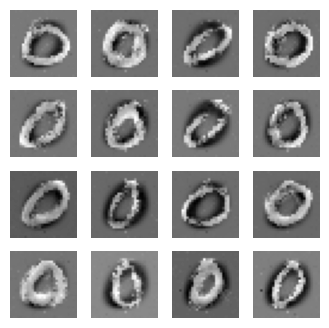

164
real_output: tf.Tensor(
[[1.0907928]
 [3.1541882]
 [2.467435 ]
 [1.6388627]
 [3.358528 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8050661 ]
 [-3.7806993 ]
 [-5.4354014 ]
 [ 0.05844574]
 [-3.3542025 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4582646, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17132398, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21805772, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2539155 ]
 [1.9069316 ]
 [0.98131156]
 [0.32588696]
 [3.0589483 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8945496]
 [-2.0389864]
 [-2.8158128]
 [-3.7025545]
 [-1.2004044]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3455698, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27882355, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20901798, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.6156187 ]
 [ 1.2658873 ]
 [ 1.0114771 ]
 [-0.17522395]
 [ 0.9382974 ]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[0.90754396]
 [1.4569497 ]
 [3.911324  ]
 [1.762594  ]
 [3.18402   ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7159774]
 [-3.1782956]
 [-2.6411972]
 [-1.4671443]
 [-1.5861845]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1026235, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22036293, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2805965, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.28206134]
 [ 2.3557653 ]
 [ 2.6065507 ]
 [ 4.6873975 ]
 [-0.19958448]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7175963]
 [-1.9811871]
 [-3.2779489]
 [-1.0549448]
 [-2.646057 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2282505, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3149872, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24655432, shape=(), dtype=float32)


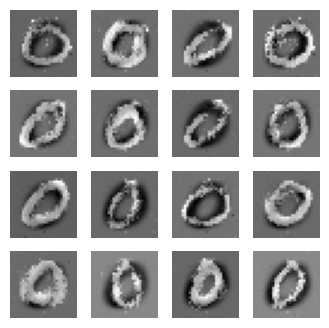

165
real_output: tf.Tensor(
[[ 2.8059602 ]
 [ 4.7214355 ]
 [-0.30268282]
 [ 3.2492967 ]
 [ 1.2696979 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.551876  ]
 [ 0.63132036]
 [-1.4554386 ]
 [-1.0968211 ]
 [-1.2057518 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9601483, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.33870524, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31112665, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.6885599]
 [2.3323863]
 [0.9411782]
 [2.443702 ]
 [3.2144053]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.97977316]
 [-2.4459648 ]
 [-1.23789   ]
 [-1.0321271 ]
 [-9.988089  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3151183, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15340593, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21632543, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1784697]
 [3.3501148]
 [1.2960286]
 [3.131647 ]
 [3.218811 ]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[ 1.8779937 ]
 [-0.14892162]
 [ 3.7585533 ]
 [ 2.7317536 ]
 [ 3.2610536 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.04261459]
 [-2.9565823 ]
 [-3.46471   ]
 [-2.622586  ]
 [-4.325438  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.301882, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.263263, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20658821, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.402745  ]
 [2.3975677 ]
 [1.0961633 ]
 [3.3088512 ]
 [0.05754392]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8074467]
 [-2.0592906]
 [-4.7485294]
 [-2.3630624]
 [-1.355103 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0620587, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25188, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25496793, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.7060905 ]
 [ 2.1201699 ]
 [ 0.18351416]
 [ 0.8574908 ]
 [-0.21157475]], shape=(5, 1), dtype=float32)
fa

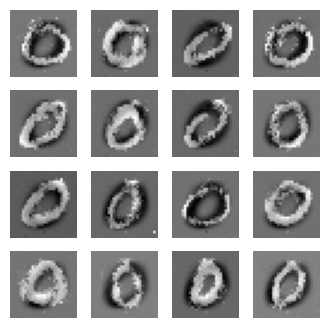

166
real_output: tf.Tensor(
[[2.255473 ]
 [3.0333009]
 [1.4009404]
 [1.8443836]
 [2.132043 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1624222]
 [-2.0821717]
 [-1.580169 ]
 [-2.6367004]
 [-2.724241 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.377274, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14358391, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2044616, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8823862]
 [2.2960577]
 [5.2913523]
 [1.6825924]
 [2.3776536]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.57011247]
 [-3.3515837 ]
 [-4.3055615 ]
 [-3.053072  ]
 [-3.8824997 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1568875, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18349889, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2547877, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.7201512 ]
 [ 0.3077092 ]
 [ 0.4249085 ]
 [-0.12260513]
 [ 1.6867471 ]], shape=(5, 1), dtype=float32)
fake_outpu

real_output: tf.Tensor(
[[ 1.014781 ]
 [ 2.9998302]
 [-1.2454253]
 [ 2.0577328]
 [ 3.2178442]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.04719257]
 [-0.29764026]
 [-1.2242895 ]
 [-1.3621632 ]
 [-2.4142034 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0303411, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23611371, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2763389, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.852798 ]
 [2.077159 ]
 [2.978006 ]
 [3.4345376]
 [4.0281987]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5215588 ]
 [-1.290555  ]
 [-2.3686082 ]
 [-0.29384238]
 [-4.8772187 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2652872, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13692278, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22869927, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9983561]
 [5.257216 ]
 [3.4393892]
 [3.6431227]
 [1.6786449]], shape=(5, 1), dtype=float32)
fake_output:

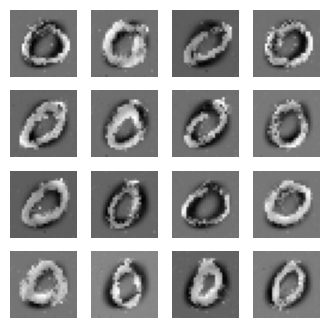

167
real_output: tf.Tensor(
[[0.5667343]
 [2.9344046]
 [1.3514646]
 [2.3213277]
 [1.2987704]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.66103244]
 [-1.9084558 ]
 [-3.1582167 ]
 [-2.5812984 ]
 [-3.2118003 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3782668, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18563357, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19521496, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3972948 ]
 [1.6278585 ]
 [0.37107822]
 [1.4972881 ]
 [1.5936326 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.545866 ]
 [-2.818575 ]
 [-1.026392 ]
 [-3.2244153]
 [-2.8878915]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4940329, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16492577, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19302711, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.8565593]
 [3.5601375]
 [1.7226268]
 [1.673422 ]
 [2.767813 ]], shape=(5, 1), dtype=float32)
fake_output:

real_output: tf.Tensor(
[[3.1308296]
 [1.3262438]
 [0.8947182]
 [1.2543554]
 [1.0586561]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2111402 ]
 [-4.9627123 ]
 [-3.7884204 ]
 [-0.32628372]
 [-4.1695447 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.551053, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24758968, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1903769, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.02730187]
 [3.6234336 ]
 [4.036586  ]
 [0.8452685 ]
 [2.6443763 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7596483]
 [-0.6898317]
 [-2.4181032]
 [-2.1414857]
 [-2.5744152]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2475011, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16606705, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24864823, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4124559]
 [1.4505669]
 [2.495203 ]
 [3.0187197]
 [1.9982873]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

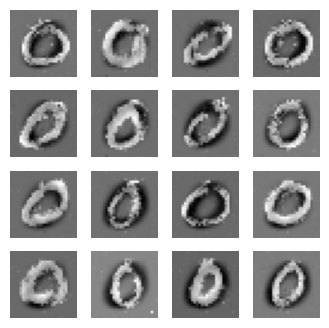

168
real_output: tf.Tensor(
[[ 3.9894297]
 [ 2.9822967]
 [ 3.1064665]
 [ 2.640289 ]
 [-1.2536337]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9380543 ]
 [-0.87637234]
 [-2.872113  ]
 [-1.9146612 ]
 [-0.9892621 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1517732, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15548609, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2620458, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.010547  ]
 [ 2.985691  ]
 [-0.07741418]
 [ 2.34492   ]
 [ 0.5599607 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.6074114]
 [-3.7459915]
 [-0.9345232]
 [-1.4762379]
 [-1.7573502]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.199205, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34990072, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30069804, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.113541 ]
 [2.974577 ]
 [1.386196 ]
 [1.1289908]
 [3.4394574]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[1.9422544]
 [4.1399093]
 [2.4810655]
 [1.211037 ]
 [3.8210604]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.265668  ]
 [-0.65469086]
 [-2.620715  ]
 [ 1.0796838 ]
 [-0.4006564 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4116862, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16215697, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2258728, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4824419]
 [1.3837848]
 [1.7729207]
 [3.6578233]
 [1.0365628]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.2034783 ]
 [-2.794477  ]
 [-2.2067218 ]
 [-0.989232  ]
 [-0.01504251]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3897328, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12404237, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22888026, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.35416   ]
 [1.4981806 ]
 [4.4401984 ]
 [2.9925659 ]
 [0.55834466]], shape=(5, 1), dtype=float32)
fake_output:

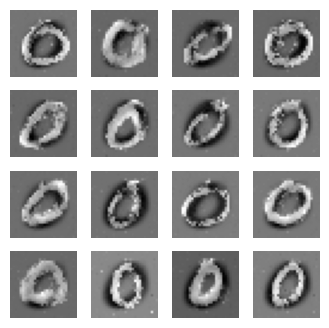

169
real_output: tf.Tensor(
[[ 1.4513589 ]
 [ 0.9382254 ]
 [-0.17408904]
 [ 1.5525142 ]
 [-0.8619908 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0263543 ]
 [-0.21011528]
 [-0.3653197 ]
 [-6.296567  ]
 [-1.147344  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4956312, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.38971958, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19617887, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.898206 ]
 [2.6200562]
 [2.5495157]
 [1.4175944]
 [2.4093728]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.7493668 ]
 [-0.04443275]
 [-1.3996944 ]
 [-4.635191  ]
 [ 1.1505818 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3636708, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17040332, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1999174, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5063715 ]
 [0.10974579]
 [3.1012928 ]
 [1.898666  ]
 [2.074361  ]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[2.2176394]
 [1.7022663]
 [1.962346 ]
 [2.0917706]
 [4.1243415]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6405901 ]
 [-0.35596907]
 [-1.49796   ]
 [-3.2383413 ]
 [-2.9271371 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4639351, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16075422, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18958539, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.811662 ]
 [ 1.3946061]
 [ 0.4968136]
 [ 3.2961338]
 [ 3.488897 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9902165 ]
 [-2.3812945 ]
 [-2.314521  ]
 [-0.21906047]
 [-2.9296236 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.368761, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13948637, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22336596, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5182087]
 [2.1612859]
 [2.2949114]
 [3.1599026]
 [1.9959731]], shape=(5, 1), dtype=float32)
fake_output:

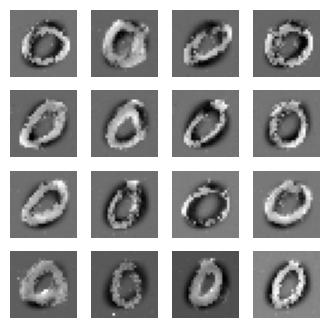

170
real_output: tf.Tensor(
[[-0.8952726]
 [ 2.2374213]
 [ 3.6348896]
 [ 1.8926173]
 [ 1.8796996]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.9288287e-03]
 [-2.8471804e+00]
 [-4.1767749e-01]
 [-3.3898606e+00]
 [-3.2170970e+00]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.329945, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20775855, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2195696, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8266959]
 [3.9362817]
 [3.1878364]
 [1.7744596]
 [1.401965 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.326908 ]
 [-2.479498 ]
 [-3.2206683]
 [-2.9669557]
 [-2.8114839]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2811317, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14260171, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2389871, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.84760123]
 [1.1449574 ]
 [2.1735845 ]
 [1.343805  ]
 [2.506605  ]], shape=(5, 1), dtype=floa

real_output: tf.Tensor(
[[ 4.351517 ]
 [ 2.1700177]
 [ 2.6997561]
 [ 2.6628227]
 [-0.2824588]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.1509056]
 [-1.6901953]
 [-0.9112554]
 [-1.1605949]
 [-1.8108264]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5220141, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16792312, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21642432, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7321944]
 [2.4661665]
 [2.1755602]
 [4.845677 ]
 [1.6434537]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.616426 ]
 [ 1.5529593]
 [-3.5556111]
 [-3.14845  ]
 [-1.4726185]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6126833, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19717611, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18700776, shape=(), dtype=float32)
real_output: tf.Tensor(
[[6.2188168]
 [3.8847702]
 [3.1398394]
 [4.5046353]
 [3.1693296]], shape=(5, 1), dtype=float32)
fake_output: tf.Tenso

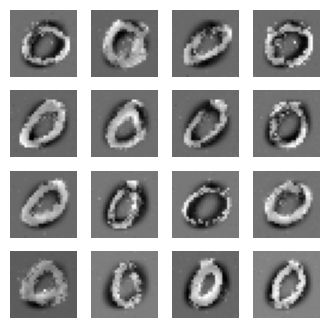

171
real_output: tf.Tensor(
[[1.6569557]
 [1.4085267]
 [3.1007607]
 [2.5811996]
 [1.5731127]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.853607  ]
 [-2.4456136 ]
 [-1.5935011 ]
 [-3.4012527 ]
 [-0.41531354]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6116533, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15456995, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16028129, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3277888]
 [3.849982 ]
 [4.2140074]
 [1.2828447]
 [1.6763204]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.577036  ]
 [-3.6543007 ]
 [-4.0065103 ]
 [-0.83343357]
 [-1.7221129 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6358986, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17846826, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16039868, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5964983 ]
 [0.91111606]
 [0.62805074]
 [4.3372135 ]
 [0.48425978]], shape=(5, 1), dtype=float32)
fake_ou

real_output: tf.Tensor(
[[4.699262 ]
 [3.6059852]
 [1.6090627]
 [2.1744792]
 [3.3718846]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5342653 ]
 [-0.65815073]
 [-0.58358365]
 [-2.4907012 ]
 [ 1.2339432 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.231982, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.099463165, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24867903, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.73002905]
 [4.2387867 ]
 [5.104233  ]
 [3.0918536 ]
 [1.8968425 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.7921131]
 [-1.1922048]
 [-2.1450999]
 [-3.3978198]
 [-5.751794 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3261652, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15034467, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20980284, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0395641]
 [3.6019287]
 [3.0962853]
 [4.346545 ]
 [1.4756507]], shape=(5, 1), dtype=float32)
fake_output: tf.

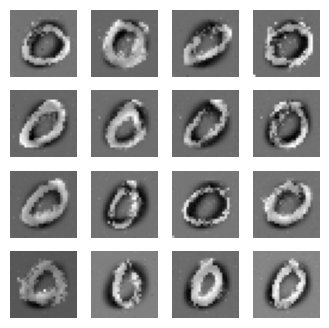

172
real_output: tf.Tensor(
[[ 0.8700138 ]
 [ 2.8291624 ]
 [ 2.1173453 ]
 [ 1.3754905 ]
 [-0.41532153]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.4584823]
 [-0.5519027]
 [-3.9237442]
 [-2.9832172]
 [-3.2809753]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.763222, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24612898, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14400336, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7927861]
 [1.9046024]
 [3.323881 ]
 [1.9358929]
 [3.2579637]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4998655 ]
 [-2.6446323 ]
 [-1.8320235 ]
 [-3.549102  ]
 [ 0.05418761]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7624922, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10361768, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.13777894, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2861555]
 [1.3605262]
 [1.381475 ]
 [0.8156864]
 [2.0941284]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[ 3.7983623 ]
 [ 4.1615524 ]
 [-0.18754645]
 [ 2.585794  ]
 [ 4.427637  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7868989 ]
 [-1.5727739 ]
 [-0.43391642]
 [-1.9138956 ]
 [-0.20323093]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9514986, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2171799, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2952612, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.703033 ]
 [4.6802883]
 [1.8940504]
 [3.7573276]
 [4.5172024]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.48341444]
 [-2.2579856 ]
 [-1.553189  ]
 [-2.14347   ]
 [-3.8793664 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.203289, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.08927907, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2742676, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.45008332]
 [-0.19756041]
 [ 1.0909044 ]
 [ 3.602494  ]
 [ 0.91969895]], shape=(5, 1), dtype=float32)


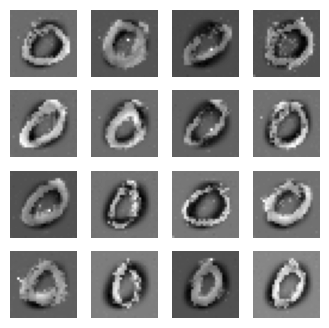

173
real_output: tf.Tensor(
[[3.4300888]
 [1.0727322]
 [4.8960958]
 [3.8343625]
 [3.2838404]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.0620112 ]
 [-2.5068634 ]
 [-6.1919804 ]
 [-0.27626827]
 [ 1.5715706 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0863774, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.111924335, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3140561, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.934447 ]
 [2.1945784]
 [2.995137 ]
 [2.5590937]
 [3.065059 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.4016831]
 [-3.7334416]
 [-2.2873702]
 [-1.0015869]
 [-3.1374927]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2053738, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12546054, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26518, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.1468598]
 [3.1197388]
 [1.1939168]
 [4.45815  ]
 [0.6541744]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

real_output: tf.Tensor(
[[3.8497903]
 [3.6114588]
 [1.6900728]
 [2.8018472]
 [2.0679893]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.810312 ]
 [-4.891587 ]
 [-2.9217641]
 [-1.4589225]
 [-1.1110145]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.39036, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27003938, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25038722, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.734868 ]
 [2.094296 ]
 [3.0426927]
 [0.8252513]
 [1.5064629]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.367484 ]
 [ 0.1342081]
 [-2.6583655]
 [-2.8325534]
 [-3.0661492]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2135973, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18835534, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2867806, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4205515]
 [3.2880657]
 [2.8371747]
 [3.762227 ]
 [3.44386  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.

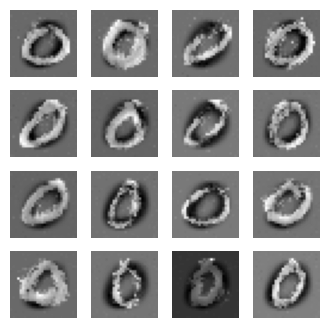

174
real_output: tf.Tensor(
[[0.7465514 ]
 [1.0380201 ]
 [2.206865  ]
 [2.3401747 ]
 [0.05064343]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.4470365]
 [-1.9375678]
 [-4.3164506]
 [-2.1778915]
 [-3.2719276]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5142365, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.331509, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21208, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.1342754 ]
 [-0.28513706]
 [ 0.16622637]
 [ 2.6694076 ]
 [ 4.502246  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9242064 ]
 [ 0.85040236]
 [-0.710273  ]
 [-2.2842531 ]
 [-2.7675173 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7336307, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.32365766, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14615217, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.287906 ]
 [1.5069193]
 [2.2644088]
 [3.5079942]
 [2.9100904]], shape=(5, 1), dtype=float32)
fake_ou

real_output: tf.Tensor(
[[2.4356983]
 [1.818082 ]
 [1.3304338]
 [3.1591868]
 [3.5044386]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6490295]
 [-1.0844421]
 [-1.0465097]
 [-1.8071593]
 [-1.684791 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4312456, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.117628604, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19694647, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5559635]
 [2.6150944]
 [1.8973582]
 [2.841195 ]
 [3.090986 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6527245 ]
 [-2.4146388 ]
 [-3.0826485 ]
 [-1.7705789 ]
 [-0.55110514]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4595838, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13251825, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20166662, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3826747]
 [2.783786 ]
 [2.845366 ]
 [2.74452  ]
 [2.5383995]], shape=(5, 1), dtype=float32)
fake_output: tf.Tens

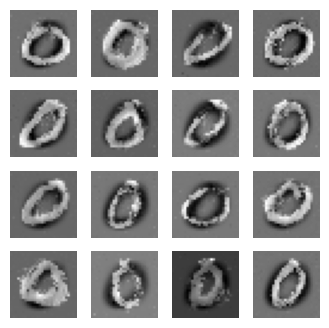

175
real_output: tf.Tensor(
[[1.6875299]
 [1.5513602]
 [1.8474458]
 [3.0816286]
 [2.872307 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.584428 ]
 [-5.0011253]
 [-3.3855083]
 [-0.9186725]
 [-0.9296072]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3835244, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17793804, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21097894, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.0819287]
 [2.1368852]
 [1.6729709]
 [3.126669 ]
 [2.5588312]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6039331]
 [-2.28372  ]
 [-2.9587173]
 [-3.4069219]
 [-2.8378801]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7062273, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14901215, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15644385, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5423268]
 [1.8477086]
 [1.945112 ]
 [1.1870201]
 [1.1674061]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[ 0.9992359]
 [ 1.5961044]
 [-1.7505571]
 [ 1.7055488]
 [ 1.7254375]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7672758]
 [-1.5050985]
 [-1.8583503]
 [-3.3386395]
 [-2.0853589]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3827405, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.4490862, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19367796, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.78226626]
 [0.8498026 ]
 [3.232736  ]
 [3.8657522 ]
 [2.340746  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2499218]
 [-0.9916146]
 [-3.9150405]
 [ 0.9210435]
 [-2.243547 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3954298, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16891831, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23894528, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1103292]
 [3.0830722]
 [4.7822256]
 [3.4778607]
 [4.925075 ]], shape=(5, 1), dtype=float32)
fake_output: tf.T

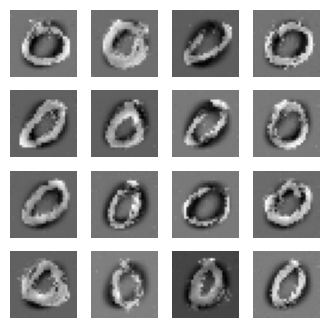

176
real_output: tf.Tensor(
[[1.1926427 ]
 [0.75946164]
 [4.509764  ]
 [2.6045895 ]
 [3.7871382 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.319305  ]
 [-1.1576173 ]
 [-3.028045  ]
 [-4.490435  ]
 [ 0.01788786]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1616206, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18013275, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24763496, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 4.7784657]
 [ 2.302486 ]
 [-0.5026109]
 [ 1.2823734]
 [ 3.2238467]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5298965]
 [-1.3548102]
 [-2.1693327]
 [-2.958401 ]
 [-4.1697106]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5627382, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24563667, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18668473, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2446713 ]
 [2.0108995 ]
 [1.28106   ]
 [2.2081456 ]
 [0.48688254]], shape=(5, 1), dtype=float32)
fa

real_output: tf.Tensor(
[[-2.4895134 ]
 [ 1.3941339 ]
 [ 1.7739531 ]
 [ 0.25984564]
 [ 1.021117  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.6187649]
 [ 1.2367758]
 [-0.6799341]
 [-2.0975451]
 [-2.3660872]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5203922, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.46435037, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1902636, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8691463]
 [1.5927768]
 [2.525567 ]
 [4.6929626]
 [2.6637883]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.0487862]
 [-1.1859238]
 [-0.5886876]
 [-4.3113723]
 [-4.7912536]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4837775, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27566, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19999407, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.118855  ]
 [0.82908416]
 [3.7301831 ]
 [1.6302958 ]
 [0.6777818 ]], shape=(5, 1), dtype=float32)
fake_output: tf

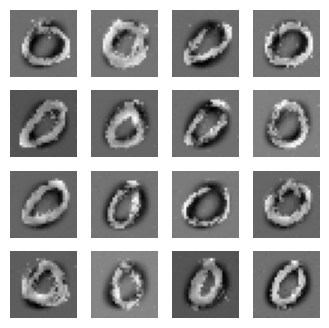

177
real_output: tf.Tensor(
[[3.5409145]
 [1.4411838]
 [3.8988078]
 [1.7546955]
 [1.8048191]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9187753]
 [-1.9603893]
 [-1.4112474]
 [-2.354379 ]
 [-0.9560223]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2267504, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22167167, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27508268, shape=(), dtype=float32)
real_output: tf.Tensor(
[[6.0709624]
 [1.1212034]
 [3.2924855]
 [2.342711 ]
 [2.5166953]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.6809566]
 [-1.0398018]
 [-0.9561937]
 [ 0.8866503]
 [-1.2969005]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0174327, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19480318, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.28874257, shape=(), dtype=float32)
real_output: tf.Tensor(
[[5.916886 ]
 [2.0103235]
 [2.9013278]
 [2.0211964]
 [3.2869008]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[1.2196484]
 [1.657006 ]
 [1.0417709]
 [2.8288732]
 [1.8300569]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2699282]
 [-2.8176665]
 [-3.2781696]
 [-3.0694165]
 [ 0.4638039]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3233898, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22509241, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26251405, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5636196]
 [2.4101381]
 [1.2845094]
 [4.6820846]
 [3.5301642]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.10146897]
 [-3.2136035 ]
 [-2.3842678 ]
 [-2.4917135 ]
 [-0.00333042]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1561065, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.09244585, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2740946, shape=(), dtype=float32)


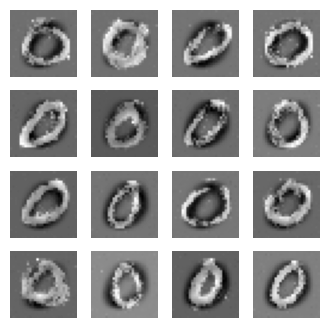

178
real_output: tf.Tensor(
[[2.526352  ]
 [3.0123646 ]
 [4.210373  ]
 [0.03098441]
 [3.1468346 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.169004 ]
 [-1.4724972]
 [-1.8513379]
 [-1.4933383]
 [-3.2877173]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5630949, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22396675, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23260985, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.4235969 ]
 [-0.17754157]
 [ 0.4534177 ]
 [ 2.1923287 ]
 [ 2.1444564 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.607793 ]
 [-1.9542614]
 [-5.44722  ]
 [-6.66206  ]
 [-2.0983236]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5351815, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19875844, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21153183, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.8765595 ]
 [ 1.3619008 ]
 [-0.16441172]
 [ 0.9025492 ]
 [ 0.06563479]], shape=(5, 1), dtype=float3

real_output: tf.Tensor(
[[2.4242315]
 [3.272481 ]
 [2.715264 ]
 [1.668807 ]
 [1.3115343]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3228117 ]
 [-2.9922814 ]
 [-1.4547043 ]
 [-0.75204545]
 [-2.0072765 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.751913, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28114003, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.14733066, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.6554022]
 [6.3727226]
 [2.7675502]
 [1.791719 ]
 [2.4951441]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.1809924]
 [-0.5229803]
 [-4.9094033]
 [-3.6293802]
 [-1.9244206]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4960303, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13961056, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17684199, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.3283455 ]
 [ 1.7350407 ]
 [-0.53527284]
 [ 2.817499  ]
 [ 1.1416519 ]], shape=(5, 1), dtype=float32)
fake_output:

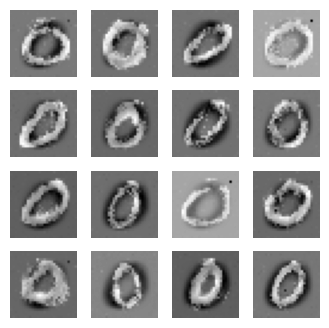

179
real_output: tf.Tensor(
[[2.5146537]
 [0.2728331]
 [4.879992 ]
 [4.232772 ]
 [3.5645192]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.455948 ]
 [-1.4644372]
 [-1.2544168]
 [-5.7130604]
 [-1.7570035]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.568509, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17185943, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19664098, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5605888 ]
 [3.4154346 ]
 [2.6660602 ]
 [2.9678977 ]
 [0.23526624]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.0310256]
 [-1.8658468]
 [-2.9634972]
 [-1.641218 ]
 [-2.4297922]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6560385, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13372844, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16809838, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.3120885 ]
 [0.8810999 ]
 [0.29923266]
 [2.1152394 ]
 [1.7836757 ]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[1.2064605]
 [2.3977768]
 [2.5055633]
 [2.9088428]
 [1.0456598]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.45522305]
 [-3.9550362 ]
 [-1.7134013 ]
 [-3.951084  ]
 [-2.4446216 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5482035, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14087261, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19224972, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0500402]
 [1.5445613]
 [1.7719327]
 [2.5158794]
 [1.50559  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9094094 ]
 [-1.1390512 ]
 [-4.9225073 ]
 [ 0.66077507]
 [-1.1253389 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.407384, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14278607, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21475913, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7594702]
 [2.788273 ]
 [3.8144212]
 [1.6575371]
 [2.8576376]], shape=(5, 1), dtype=float32)
fake_output: tf.T

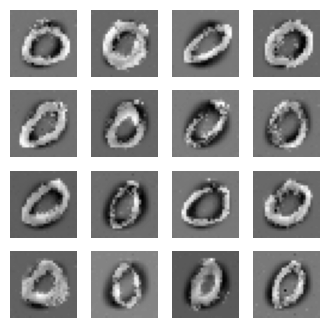

180
real_output: tf.Tensor(
[[ 1.747323  ]
 [ 0.3682275 ]
 [-0.01302274]
 [ 4.8445926 ]
 [ 2.6256146 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.913639 ]
 [-1.6377926]
 [-1.9828529]
 [-1.018162 ]
 [-0.5470821]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4033554, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30746326, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22291875, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.8404953]
 [1.8447655]
 [4.053193 ]
 [2.262818 ]
 [3.9157515]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7441629 ]
 [-2.5116599 ]
 [-3.0868723 ]
 [-3.3539107 ]
 [-0.04777777]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.42787, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13712552, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21069606, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.27296972]
 [ 1.6669782 ]
 [ 2.2323785 ]
 [ 3.1277387 ]
 [ 1.9192744 ]], shape=(5, 1), dtype=float32)

real_output: tf.Tensor(
[[2.1551163]
 [1.6603532]
 [4.109666 ]
 [2.5285802]
 [4.9263387]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.9348305]
 [-3.4298558]
 [-1.56706  ]
 [-3.0118814]
 [-1.8425975]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2430642, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19810936, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23850197, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5637398]
 [1.3127248]
 [3.364529 ]
 [3.4234405]
 [1.5301132]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.56506807]
 [ 1.301681  ]
 [-1.1047537 ]
 [-1.113071  ]
 [-1.2737925 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2147155, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21664895, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23334673, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.7074223 ]
 [ 1.4197441 ]
 [ 0.75129914]
 [ 0.56571054]
 [-0.6633091 ]], shape=(5, 1), dtype=float32)
fake_output

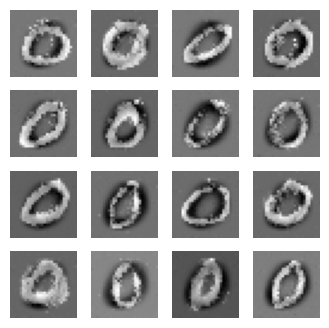

181
real_output: tf.Tensor(
[[2.6429133]
 [3.238896 ]
 [3.4218884]
 [3.0347857]
 [3.3883805]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.90878326]
 [-3.0101657 ]
 [ 0.21701367]
 [-0.8071634 ]
 [-2.7187808 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0641794, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14676239, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3342352, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1220694]
 [3.2262077]
 [1.4785516]
 [2.5628119]
 [2.2479343]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3819771 ]
 [-2.4707134 ]
 [ 0.93984014]
 [-0.9224469 ]
 [-4.982948  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1411357, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19533789, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27008227, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.167122  ]
 [ 2.4240105 ]
 [-0.31688353]
 [ 0.434742  ]
 [ 3.503285  ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[1.9367956 ]
 [1.8706851 ]
 [2.1964424 ]
 [0.98296136]
 [1.3689313 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7960055]
 [-2.9987035]
 [-4.822405 ]
 [-4.0899153]
 [-2.8914433]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4783185, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3136835, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22613925, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6608998 ]
 [0.31573924]
 [2.1900408 ]
 [0.14373222]
 [2.1938763 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.895619 ]
 [-3.7229517]
 [-2.5078244]
 [-1.3782336]
 [-2.9640052]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4843397, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37725925, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.1871045, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7226586]
 [3.9609303]
 [2.7799735]
 [4.488813 ]
 [3.672598 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Te

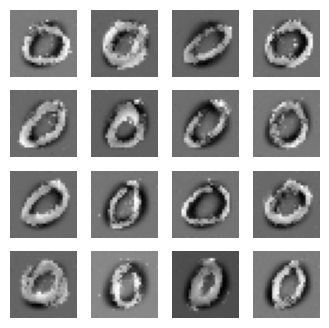

182
real_output: tf.Tensor(
[[2.6541    ]
 [1.4222212 ]
 [0.57076836]
 [3.1493104 ]
 [2.3193858 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8120111 ]
 [-3.4063554 ]
 [-1.0014653 ]
 [-5.263756  ]
 [-0.26124856]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1313624, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17304236, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27756703, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3056462 ]
 [1.5963744 ]
 [1.8158836 ]
 [1.4343495 ]
 [0.01114655]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.098005 ]
 [ 1.0751559]
 [-1.6129135]
 [-2.7836025]
 [-2.3428972]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.137261, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10027555, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.34189212, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.81458926]
 [1.5790001 ]
 [0.5386195 ]
 [1.1422411 ]
 [2.0894349 ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[2.410352  ]
 [3.0055718 ]
 [0.70400923]
 [2.53862   ]
 [2.0114994 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.892403 ]
 [-0.321837 ]
 [ 0.8004543]
 [-2.9462512]
 [-1.8842541]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2206044, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16832103, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22001168, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.3014011 ]
 [ 2.7751777 ]
 [ 4.8693004 ]
 [-0.12700793]
 [-1.1302937 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5211501 ]
 [-2.9668982 ]
 [-0.35977194]
 [-1.7640659 ]
 [-1.8775479 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9873536, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.4487257, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30602238, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.1573477]
 [2.5058281]
 [3.942984 ]
 [3.1052291]
 [1.0887898]], shape=(5, 1), dtype=float32)
fake_ou

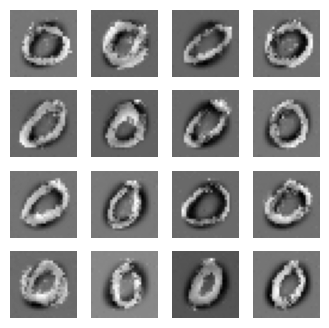

183
real_output: tf.Tensor(
[[1.9415388]
 [0.8590854]
 [2.630841 ]
 [1.417114 ]
 [0.7126196]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9420196]
 [-5.335501 ]
 [-1.3200452]
 [-0.6157133]
 [-3.3282433]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3942099, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.44945273, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19795278, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2747118]
 [1.2490577]
 [2.9784389]
 [2.2780993]
 [2.9715962]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7868601]
 [-1.4447702]
 [-2.7131896]
 [-1.8673466]
 [-2.0925422]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2954977, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.14914094, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19807625, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.105812 ]
 [2.637745 ]
 [6.796443 ]
 [2.9950483]
 [3.3199785]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

real_output: tf.Tensor(
[[0.03425275]
 [3.2555432 ]
 [3.0341873 ]
 [2.919424  ]
 [0.850227  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9345827]
 [ 0.2074052]
 [-1.7481384]
 [-5.508758 ]
 [-2.7283092]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3587694, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23091942, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23253104, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4598546]
 [6.596488 ]
 [2.2345932]
 [4.0940447]
 [1.8662026]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 2.4535913]
 [-1.2095976]
 [-2.9186728]
 [-1.3185778]
 [-2.752347 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4155753, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12545113, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.236406, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.3096285]
 [5.6640677]
 [2.749111 ]
 [7.319162 ]
 [2.4794257]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

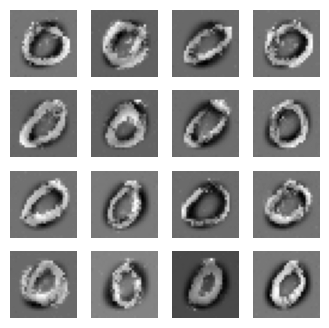

184
real_output: tf.Tensor(
[[1.5667123]
 [1.6885576]
 [1.4161924]
 [2.0816162]
 [1.5032313]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.254692  ]
 [-4.012139  ]
 [ 0.2497937 ]
 [-1.1873404 ]
 [-0.43325064]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2695239, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19877422, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26986235, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.2112455 ]
 [-0.20121391]
 [ 1.867368  ]
 [-0.6113383 ]
 [ 2.7463086 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5378363]
 [-3.2366076]
 [-3.4896736]
 [-1.6178815]
 [-1.4605045]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.565442, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.40147734, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16568483, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.031816  ]
 [5.452035  ]
 [2.1366737 ]
 [0.05922045]
 [5.004772  ]], shape=(5, 1), dtype=float32)
fak

real_output: tf.Tensor(
[[3.3277266 ]
 [0.83848083]
 [1.2640079 ]
 [0.98976535]
 [1.1997107 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5181732]
 [-2.4190996]
 [-3.8630586]
 [-0.0427907]
 [-1.8147901]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7326813, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20990673, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.15271223, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2754425]
 [1.9535258]
 [1.0764636]
 [4.374639 ]
 [1.1825582]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.51843303]
 [-0.01670855]
 [-4.017102  ]
 [-2.312707  ]
 [-2.9920297 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6291122, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23674083, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17363226, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.5361696]
 [1.8713564]
 [1.0931228]
 [3.7546794]
 [1.6084518]], shape=(5, 1), dtype=float32)
fake_output: tf.

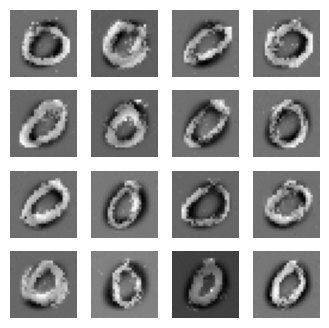

185
real_output: tf.Tensor(
[[0.59506506]
 [2.3858418 ]
 [1.4238425 ]
 [3.0183437 ]
 [1.8872381 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2139153 ]
 [-0.17193228]
 [ 1.0618494 ]
 [-2.0133145 ]
 [-4.3304434 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3415904, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28551602, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24068658, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.5177412]
 [2.463657 ]
 [3.168298 ]
 [2.487875 ]
 [1.7334883]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.451522 ]
 [-0.4185719]
 [-1.0523089]
 [-0.0954489]
 [-3.737399 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2646441, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13753062, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25926608, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.63671  ]
 [3.1121712]
 [4.517741 ]
 [2.1613057]
 [1.5262212]], shape=(5, 1), dtype=float32)
fake_output:

real_output: tf.Tensor(
[[ 2.1972828]
 [ 4.034364 ]
 [-0.930553 ]
 [ 2.4721029]
 [ 1.9637804]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2376084]
 [-2.675724 ]
 [-3.562058 ]
 [-1.292316 ]
 [-2.018035 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5492449, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.41112083, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2051452, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2750202]
 [4.5245757]
 [2.5047052]
 [1.8059173]
 [1.5842537]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.319806 ]
 [-1.6052493]
 [-3.711176 ]
 [-4.244023 ]
 [ 0.2359378]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7692645, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1675699, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.16525194, shape=(), dtype=float32)


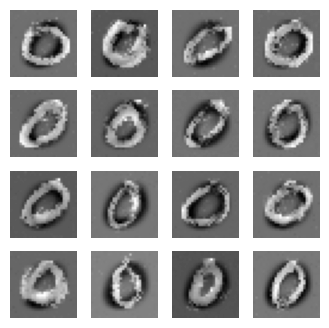

186
real_output: tf.Tensor(
[[3.3020973]
 [1.6118087]
 [2.5637734]
 [1.3163639]
 [3.7729182]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.16762312]
 [-1.1015035 ]
 [-2.1962628 ]
 [-1.0909873 ]
 [-3.666722  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3705459, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17469472, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22564262, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9221148]
 [1.8015554]
 [4.2169204]
 [2.3919744]
 [1.5886881]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 1.4941242 ]
 [-0.08902737]
 [-1.3902673 ]
 [-4.6329103 ]
 [-0.88912946]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5104084, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.10929614, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20841292, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.2376316]
 [1.1887683]
 [2.8276908]
 [1.2924402]
 [2.75249  ]], shape=(5, 1), dtype=float32)
fake_output:

real_output: tf.Tensor(
[[3.673261  ]
 [0.05009156]
 [2.086487  ]
 [2.8570373 ]
 [2.1870925 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2247872 ]
 [-0.33666438]
 [-1.663966  ]
 [-4.0792036 ]
 [-3.7226562 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5562124, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1443249, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19977006, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.38057703]
 [ 2.8832483 ]
 [-0.47325438]
 [ 4.2015333 ]
 [ 3.2464762 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.2804692 ]
 [-0.09370534]
 [-0.2748565 ]
 [-2.2062726 ]
 [-2.4584746 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.426046, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.11647902, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23117048, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2137543]
 [1.1874505]
 [3.1733878]
 [1.0361615]
 [3.8758948]], shape=(5, 1), dtype=float32)
fak

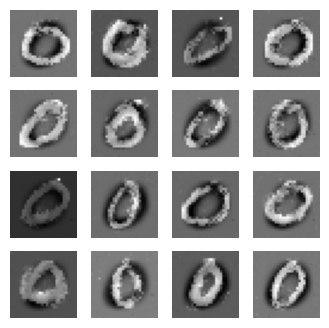

187
real_output: tf.Tensor(
[[3.5597208 ]
 [1.7721261 ]
 [0.10311981]
 [3.1848357 ]
 [2.1205273 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2535655 ]
 [ 0.8549656 ]
 [-0.91250306]
 [-1.7757657 ]
 [-1.514811  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4995973, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1216806, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19883242, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.43228194]
 [1.3961732 ]
 [0.6635303 ]
 [3.341136  ]
 [0.92776245]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.36923018]
 [-1.847786  ]
 [-2.4592128 ]
 [-4.7166605 ]
 [-0.1443682 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4924192, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17190814, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22329292, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.06981513]
 [0.24730584]
 [2.8403404 ]
 [1.5735962 ]
 [2.1551046 ]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[1.8361022]
 [1.381797 ]
 [2.190935 ]
 [1.6880968]
 [2.6497142]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-4.0036225 ]
 [-0.35526323]
 [-2.6393943 ]
 [-5.094212  ]
 [-3.1753407 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4122186, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23493616, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21345425, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.42705014]
 [1.559567  ]
 [2.406777  ]
 [0.57435924]
 [3.424924  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.9532807e+00]
 [ 1.9484130e-01]
 [-2.5181105e+00]
 [ 1.0395385e-03]
 [-1.9420348e+00]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.7952178, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.40663636, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17046726, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.0509818]
 [3.0131798]
 [2.6040897]
 [2.286225 ]
 [2.5078459]], shape=(5, 1), dtype=float

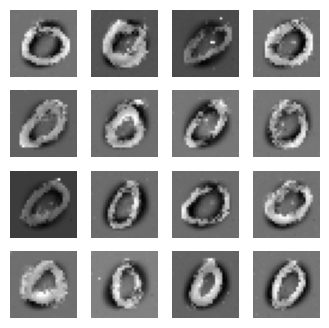

188
real_output: tf.Tensor(
[[1.8486913]
 [0.8084779]
 [1.7853471]
 [3.4685135]
 [2.1469717]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5071037 ]
 [-0.05041645]
 [-6.4493275 ]
 [-5.2839084 ]
 [-0.98002315]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4623656, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18607818, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2282164, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4765704 ]
 [0.06023544]
 [1.1142783 ]
 [4.637119  ]
 [2.4856918 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.197919 ]
 [-2.7664602]
 [-1.8544884]
 [-2.1880984]
 [-2.1983495]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.5956018, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20435002, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.20991224, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.1007125]
 [1.543547 ]
 [0.7909839]
 [2.6058536]
 [3.8780253]], shape=(5, 1), dtype=float32)
fake_output: 

real_output: tf.Tensor(
[[5.8072853]
 [1.1392686]
 [3.509788 ]
 [6.9589925]
 [1.5897069]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.03375723]
 [-2.3706555 ]
 [ 2.0860808 ]
 [-2.202137  ]
 [-1.5843165 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.595892, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.21610743, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21028107, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.5204465]
 [2.5998297]
 [1.9759104]
 [3.21716  ]
 [2.6744266]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9793441]
 [-3.4963472]
 [-0.2760336]
 [-4.2915764]
 [-2.3616319]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4377818, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1356709, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19573832, shape=(), dtype=float32)


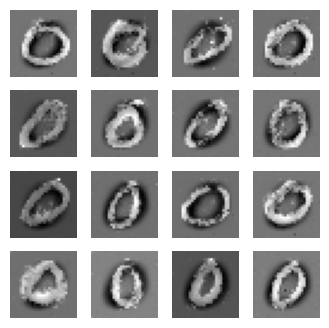

189
real_output: tf.Tensor(
[[2.5015376]
 [3.782921 ]
 [2.2372353]
 [2.9336622]
 [1.2974188]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.190123  ]
 [-0.39597797]
 [-1.7095374 ]
 [-5.366679  ]
 [-1.5895184 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6078248, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.17059182, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.19117966, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.7999218 ]
 [0.36269575]
 [2.253223  ]
 [3.0918458 ]
 [1.4346601 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5114286]
 [-2.3904488]
 [ 1.121617 ]
 [-1.0181693]
 [-2.8915672]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6273942, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16807684, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18005486, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.9393408]
 [3.4832504]
 [1.274444 ]
 [2.3376184]
 [3.2275693]], shape=(5, 1), dtype=float32)
fake_output:

real_output: tf.Tensor(
[[ 1.4817749 ]
 [ 1.8055476 ]
 [ 2.127173  ]
 [ 2.1054714 ]
 [-0.16019931]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5156181]
 [-3.4361577]
 [-0.6550639]
 [-1.7368741]
 [-2.8181472]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.489915, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.2653436, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22507039, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-2.231334  ]
 [ 4.1485963 ]
 [ 1.154581  ]
 [ 2.7171333 ]
 [ 0.47649148]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-5.2611136 ]
 [-1.5963421 ]
 [ 0.28254762]
 [-1.4005464 ]
 [-3.0201602 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0324335, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15407953, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2672217, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4736319]
 [2.183714 ]
 [2.6853547]
 [3.2794266]
 [3.45188  ]], shape=(5, 1), dtype=float32)
fake

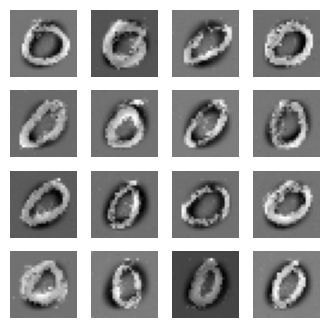

190
real_output: tf.Tensor(
[[1.8479817]
 [3.3941624]
 [2.0227768]
 [0.9699871]
 [6.035897 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.917269 ]
 [-3.4735415]
 [-1.7706511]
 [-3.3560326]
 [-0.7922403]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0472991, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.088121295, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.30127782, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.00976518]
 [ 0.46202925]
 [-0.355648  ]
 [-0.45840535]
 [-0.1452646 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.34796962]
 [-1.4307727 ]
 [ 0.1659688 ]
 [-0.6514736 ]
 [ 0.00298712]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0436826, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.52919763, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.32155058, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.7998102]
 [1.2615664]
 [3.0968883]
 [2.4012225]
 [1.3554223]], shape=(5, 1), dtype=float32)
fake_o

real_output: tf.Tensor(
[[ 0.01535702]
 [ 1.8775859 ]
 [-1.6833875 ]
 [ 1.1850777 ]
 [ 3.0066144 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.913002 ]
 [-2.822248 ]
 [-1.9773712]
 [ 0.9460516]
 [-3.4904094]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.339292, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19230087, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25281537, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.3345377]
 [1.9657851]
 [3.547004 ]
 [3.1433654]
 [1.92226  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.563039  ]
 [-1.9057539 ]
 [-2.0311673 ]
 [-2.1570044 ]
 [ 0.35610673]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1971457, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12945446, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3287301, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.599371  ]
 [-0.41096458]
 [ 1.4396201 ]
 [ 0.8832276 ]
 [ 2.0148559 ]], shape=(5, 1), dtype=float32)
fak

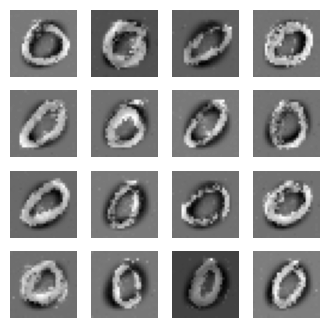

191
real_output: tf.Tensor(
[[2.9485483]
 [3.4427295]
 [2.5065937]
 [2.6284666]
 [3.017721 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6609054]
 [-2.9133396]
 [-3.0210667]
 [-0.4275031]
 [-1.8742981]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3818922, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.12923796, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23543504, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.6656731]
 [2.035672 ]
 [2.6745455]
 [2.1365702]
 [1.5257949]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2362465]
 [-0.8748953]
 [-0.9415018]
 [-1.0427877]
 [-1.5981823]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.432135, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.13411468, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25298703, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6226797]
 [2.4480364]
 [2.0759788]
 [1.9741622]
 [4.465016 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

real_output: tf.Tensor(
[[ 2.3358674 ]
 [ 0.01890288]
 [ 2.2716053 ]
 [-1.2238444 ]
 [ 4.2602677 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.3578147]
 [-2.2078238]
 [-4.1754756]
 [-1.4979786]
 [-1.1943637]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.1641107, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3107634, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25389978, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.6070063]
 [3.4657762]
 [2.3927798]
 [3.471127 ]
 [3.2559848]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5945043 ]
 [-0.88347393]
 [-3.806241  ]
 [ 0.53771037]
 [-3.3604715 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9918677, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.1511958, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27435994, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.157759  ]
 [0.55632687]
 [1.073981  ]
 [3.9339807 ]
 [0.6661999 ]], shape=(5, 1), dtype=float32)
fake_out

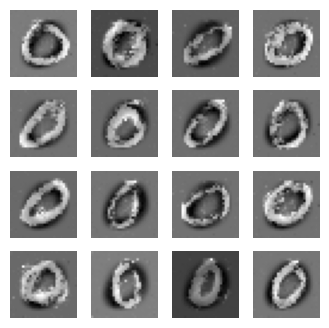

192
real_output: tf.Tensor(
[[3.0614107]
 [1.7809685]
 [2.1873631]
 [1.613989 ]
 [3.4131212]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1353481 ]
 [-1.3710122 ]
 [-3.9751735 ]
 [-2.095332  ]
 [ 0.01806123]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.988838, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16688159, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.27517107, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.2614655 ]
 [ 3.028102  ]
 [ 1.0279281 ]
 [-1.4951297 ]
 [ 0.04573276]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.2704265]
 [-1.2908707]
 [ 0.7421241]
 [-2.1466641]
 [-4.1174397]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.3073382, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.5841739, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22234923, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.1404932]
 [1.5438721]
 [2.0273337]
 [2.8805034]
 [1.3032718]], shape=(5, 1), dtype=float32)
fake_outp

real_output: tf.Tensor(
[[ 2.3072212 ]
 [ 1.6038467 ]
 [-0.18771735]
 [ 1.9513061 ]
 [ 3.260574  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.7690701 ]
 [-0.97389275]
 [ 0.75291157]
 [-2.3925714 ]
 [-1.4289708 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.106411, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.19026078, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26693022, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.6980834 ]
 [ 0.931342  ]
 [ 2.8238728 ]
 [-0.49500865]
 [ 3.0119762 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.1875778 ]
 [-2.788456  ]
 [-1.981274  ]
 [-0.89434433]
 [-3.54123   ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9243723, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.22928843, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2800969, shape=(), dtype=float32)
real_output: tf.Tensor(
[[4.8672953]
 [1.8704433]
 [1.3781457]
 [3.3712082]
 [3.2693374]], shape=(5, 1), dtype=float32

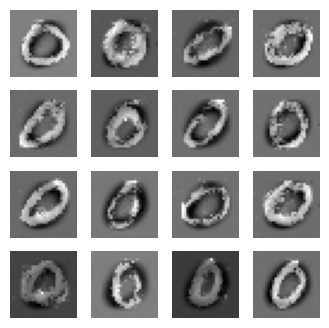

193
real_output: tf.Tensor(
[[2.6325974]
 [0.8296662]
 [1.7096621]
 [1.2828516]
 [0.6381413]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5790517 ]
 [-0.92620456]
 [-2.7067204 ]
 [-1.2465851 ]
 [-1.6292398 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8642572, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.26936716, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.33819962, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.773487  ]
 [2.7531636 ]
 [2.5474105 ]
 [0.11982478]
 [2.2749312 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.56505823]
 [-1.5534766 ]
 [-1.4410342 ]
 [-1.6205012 ]
 [-1.4404613 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8279257, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.16220987, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.34328726, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.9772213]
 [2.399947 ]
 [1.4672348]
 [0.7876328]
 [2.8082206]], shape=(5, 1), dtype=float32)
fake_ou

real_output: tf.Tensor(
[[0.7253375]
 [3.0000422]
 [3.733106 ]
 [4.343001 ]
 [2.8380976]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9501054 ]
 [-2.7668896 ]
 [-2.5787492 ]
 [-1.1119909 ]
 [-0.91026855]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8091426, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.15296774, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3637276, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.2556662 ]
 [-0.21305412]
 [ 1.5417924 ]
 [ 0.38012582]
 [ 2.6841536 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.928162 ]
 [-2.5090451]
 [ 0.761898 ]
 [-1.4582539]
 [-3.111891 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8962317, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24485607, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.34382784, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.26600492]
 [ 1.0169036 ]
 [ 3.3868053 ]
 [ 2.22216   ]
 [ 2.0042863 ]], shape=(5, 1), dtype=float32)
fa

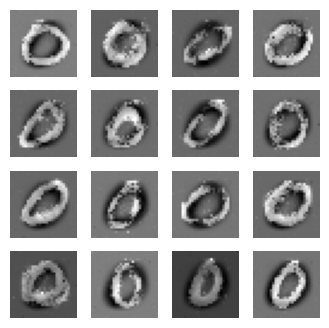

194
real_output: tf.Tensor(
[[1.8569745]
 [1.6977712]
 [1.9851702]
 [2.2899435]
 [1.6111189]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-6.8385925]
 [-1.0668527]
 [-2.907182 ]
 [-3.4800146]
 [-0.0598718]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4252336, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24949117, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.18542211, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.1283011]
 [ 1.7926679]
 [ 1.4156489]
 [ 2.8276453]
 [-1.2565777]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.2556544]
 [-1.9848943]
 [-3.0828352]
 [-2.8165936]
 [-7.6368203]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2125947, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25713977, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.22012857, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.9233428]
 [2.1594589]
 [1.2450099]
 [2.8267758]
 [1.3908526]], shape=(5, 1), dtype=float32)
fake_output: tf.T

real_output: tf.Tensor(
[[ 1.5441645 ]
 [-0.50109184]
 [ 1.092739  ]
 [ 2.6533546 ]
 [ 2.1678882 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.9832796 ]
 [-0.25175062]
 [-4.167891  ]
 [ 0.3200824 ]
 [-2.9112623 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2763448, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23823045, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24017231, shape=(), dtype=float32)
real_output: tf.Tensor(
[[0.3115608]
 [3.3565826]
 [2.3024194]
 [2.3466585]
 [3.2436895]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.8074112 ]
 [-1.211041  ]
 [-1.0956562 ]
 [ 0.18540305]
 [-5.348028  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2939534, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18711144, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2274174, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.80843294]
 [ 2.1230385 ]
 [ 0.26579416]
 [ 0.00495195]
 [-0.6167265 ]], shape=(5, 1), dtype=float3

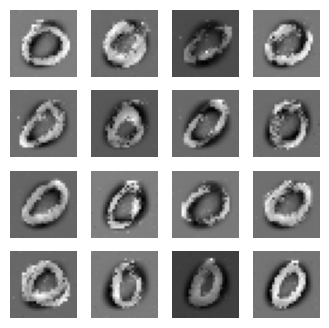

195
real_output: tf.Tensor(
[[ 3.05287   ]
 [ 1.926194  ]
 [-0.58401984]
 [ 3.168463  ]
 [ 3.1680882 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.389252  ]
 [ 0.25383383]
 [-2.3441246 ]
 [-3.9828904 ]
 [-1.7145238 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0664792, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.38441062, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.29269928, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 0.727409  ]
 [ 2.5212278 ]
 [ 1.6415589 ]
 [-0.18652442]
 [ 0.44911537]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.9606605]
 [-1.8948357]
 [ 1.2738633]
 [-0.6242964]
 [-2.4731135]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9640998, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31276822, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.3198869, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.430054 ]
 [2.986422 ]
 [3.3433769]
 [1.00573  ]
 [2.7826724]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[1.657082 ]
 [1.6455513]
 [1.2842637]
 [2.1211104]
 [1.4900539]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.5874401]
 [-2.3499992]
 [-0.9381961]
 [-2.880441 ]
 [-3.4635477]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.4960663, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.18448293, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.17390771, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.611909  ]
 [2.040288  ]
 [2.9418762 ]
 [0.15320212]
 [1.8177623 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.2567012]
 [-2.243736 ]
 [-1.6199232]
 [-1.805241 ]
 [-1.8881446]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.164366, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28607222, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25252807, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0254326]
 [2.7032385]
 [1.99326  ]
 [1.1036254]
 [1.8239788]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor

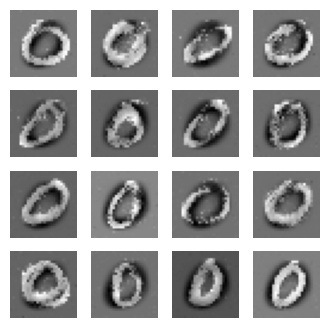

196
real_output: tf.Tensor(
[[3.624386 ]
 [2.8913643]
 [1.8437096]
 [1.9755362]
 [1.2481943]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.7557533]
 [-2.7911768]
 [-2.1145458]
 [-3.4416873]
 [-4.7919326]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0442047, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25552946, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2783473, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.4115049 ]
 [-0.14051332]
 [ 1.628518  ]
 [ 1.724135  ]
 [ 2.558254  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.5777687 ]
 [-3.1325917 ]
 [-2.4150643 ]
 [-0.73281133]
 [-1.2544805 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.2162857, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.27681488, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.23506677, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.4432671]
 [1.2238355]
 [2.0378544]
 [4.062641 ]
 [1.7523981]], shape=(5, 1), dtype=float32)
fake_out

real_output: tf.Tensor(
[[ 2.023715 ]
 [ 0.5920565]
 [-1.478801 ]
 [ 1.1703701]
 [ 1.1929506]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-2.5489936 ]
 [-0.29221416]
 [ 0.500973  ]
 [-0.56862926]
 [-4.733839  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9653943, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.29361838, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.36364138, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4220955]
 [2.5147238]
 [2.9989629]
 [2.5681787]
 [2.961676 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.86547345]
 [ 1.1319782 ]
 [-0.82665485]
 [-2.3829482 ]
 [-1.8336699 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9484396, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.24680091, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.32838976, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 3.4412372 ]
 [-0.71452343]
 [ 0.5328547 ]
 [ 0.02101168]
 [ 0.27463424]], shape=(5, 1), dtype=float32)
f

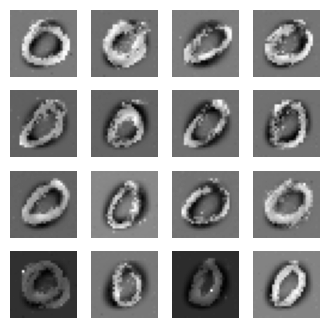

197
real_output: tf.Tensor(
[[0.94334567]
 [2.028886  ]
 [1.0059763 ]
 [1.612863  ]
 [0.8935219 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.707397 ]
 [ 0.9794563]
 [-1.6240987]
 [-2.489146 ]
 [-1.6950208]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9206686, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.410289, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31488967, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.9421924 ]
 [ 2.027331  ]
 [-1.2287997 ]
 [ 0.04639302]
 [ 0.28234696]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.431306  ]
 [-0.15878902]
 [-2.7363257 ]
 [-2.6954927 ]
 [-1.1314124 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.8143749, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.34603825, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31138915, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 2.9015245 ]
 [ 3.3419237 ]
 [-0.20324586]
 [ 2.7705204 ]
 [ 2.3574202 ]], shape=(5, 1), dtype=flo

real_output: tf.Tensor(
[[1.0189857 ]
 [3.5380747 ]
 [0.70143753]
 [2.0714486 ]
 [1.5534806 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8758235 ]
 [-1.1763551 ]
 [-2.7233505 ]
 [-2.1718934 ]
 [-0.33853516]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0257375, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.3821891, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2763763, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.2654864 ]
 [ 0.73460525]
 [-0.15075177]
 [ 1.7972409 ]
 [-0.370853  ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[ 0.26943058]
 [-1.4836632 ]
 [-2.4870725 ]
 [-0.00520522]
 [-1.5990258 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0708773, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.37607726, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2633183, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.8217074 ]
 [0.27168268]
 [1.1345439 ]
 [1.3738118 ]
 [0.70883936]], shape=(5, 1), dtype=float32)

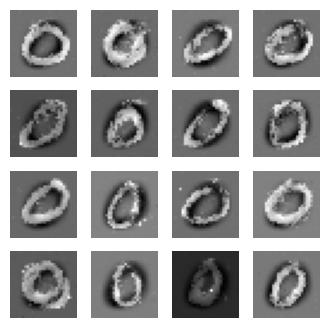

198
real_output: tf.Tensor(
[[ 3.1583939 ]
 [-0.03697459]
 [ 2.5669568 ]
 [ 4.7642307 ]
 [ 1.8567985 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5715315]
 [-1.7814428]
 [-2.5430558]
 [-2.541955 ]
 [ 1.5309604]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0275853, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.20051545, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.25162628, shape=(), dtype=float32)
real_output: tf.Tensor(
[[1.2317901 ]
 [1.9332885 ]
 [2.800209  ]
 [0.13762487]
 [1.0402294 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.33884418]
 [-3.108198  ]
 [-2.3294697 ]
 [-1.6032656 ]
 [-2.8788807 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0651278, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.28266627, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2710622, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.566254  ]
 [2.1881762 ]
 [0.8858938 ]
 [0.8094025 ]
 [0.15642956]], shape=(5, 1), dtype=float32

real_output: tf.Tensor(
[[3.1717215]
 [1.9992849]
 [1.66177  ]
 [1.6255314]
 [3.0206585]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.6406809]
 [-0.6760965]
 [-2.6093268]
 [-3.9841573]
 [-2.7276022]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(1.9710163, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.23159213, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.26690096, shape=(), dtype=float32)
real_output: tf.Tensor(
[[3.4855318]
 [1.7143123]
 [0.285861 ]
 [3.7600837]
 [2.8547573]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.64860374]
 [-1.5048001 ]
 [-3.8852532 ]
 [-2.4581325 ]
 [-3.1924944 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.193831, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.30571306, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2591613, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.4846914]
 [1.0090903]
 [1.5577629]
 [2.5954647]
 [1.6127355]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(

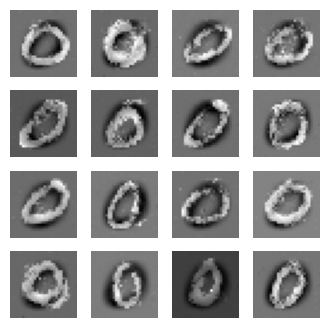

199
real_output: tf.Tensor(
[[0.88814706]
 [0.52539414]
 [3.1551888 ]
 [0.6835169 ]
 [0.3581867 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8905214 ]
 [-1.4305576 ]
 [-0.87668973]
 [-1.4994965 ]
 [-3.033128  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.265593, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.5555194, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.24249822, shape=(), dtype=float32)
real_output: tf.Tensor(
[[-0.3481757]
 [ 1.2509615]
 [ 3.3918273]
 [-0.8105516]
 [ 1.288389 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-0.52350086]
 [-3.4965606 ]
 [-1.4878447 ]
 [-3.1005187 ]
 [-6.314003  ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.6208472, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.35855454, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.21755323, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.2537918]
 [1.6225964]
 [0.5141808]
 [2.0521793]
 [1.4202873]], shape=(5, 1), dtype=float32)
fake

real_output: tf.Tensor(
[[0.9381299]
 [1.6198684]
 [3.761016 ]
 [0.1570867]
 [2.4837244]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-3.5716634]
 [ 0.2096233]
 [-3.976286 ]
 [-2.3446963]
 [-3.2404368]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0587502, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.25266773, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.2549479, shape=(), dtype=float32)
real_output: tf.Tensor(
[[ 1.6556345 ]
 [-0.25282997]
 [ 3.8802788 ]
 [ 2.5519083 ]
 [ 3.6080618 ]], shape=(5, 1), dtype=float32)
fake_output: tf.Tensor(
[[-1.8606416 ]
 [ 0.65333706]
 [-0.4256708 ]
 [-4.2437367 ]
 [-0.5649367 ]], shape=(5, 1), dtype=float32)
gen_loss: tf.Tensor(2.0019042, shape=(), dtype=float32)
disc_real_loss: tf.Tensor(0.31476855, shape=(), dtype=float32)
disc_fake_loss: tf.Tensor(0.31859556, shape=(), dtype=float32)
real_output: tf.Tensor(
[[2.0156064]
 [1.9185735]
 [4.760062 ]
 [2.636762 ]
 [3.2362688]], shape=(5, 1), dtype=float32)
fake_output:

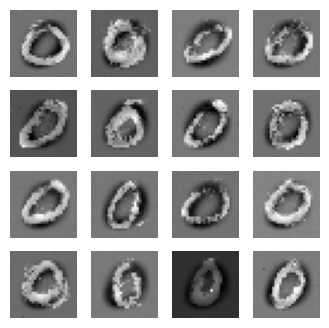

In [15]:
train(datasets_0, epochs)

## 保存

In [16]:
# 参数保存
generator.save_weights('./modelsave/save_weights/generator_w2.ckpt')
discriminator.save_weights('./modelsave/save_weights/discriminator_w2.ckpt')
print('weights saved')

# 模型保存
generator.save('./modelsave/save_model/generator_m2.h5')
discriminator.save('./modelsave/save_model/discriminator_m2.h5')
print('model saved')

weights saved
model saved


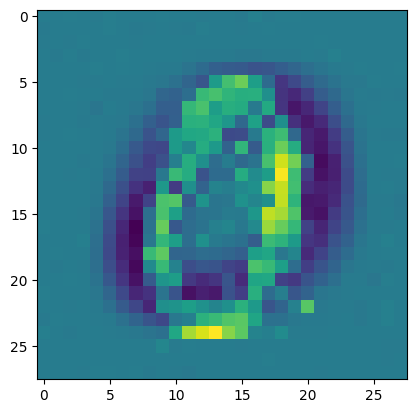

In [18]:
generator = generator_model()
generator.load_weights('./modelsave/save_weights/generator_w2.ckpt')
plt.imshow(generator(tf.random.normal([generate_show_num, noise_dim]), training=False)[1, :, :])

In [25]:
train_images.shape

(60000, 28, 28)

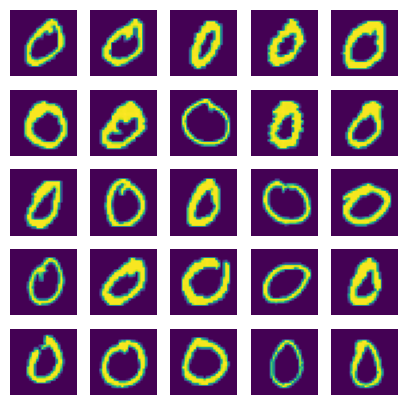

In [30]:
fig = plt.figure(figsize=(5, 5))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(train_images_0[i, :, :])
    plt.axis('off')  #不显示坐标轴

In [29]:
discriminator = discriminator_model()
discriminator.load_weights('./modelsave/save_weights/discriminator_w2.ckpt')
test_o = discriminator(train_images[0:BATCH_SIZE])    
print(train_labels[0:50])
print('-------------------------------')
print(test_o)

[5 0 4 1 9 2 1 3 1 4 3 5 3 6 1 7 2 8 6 9 4 0 9 1 1 2 4 3 2 7 3 8 6 9 0 5 6
 0 7 6 1 8 7 9 3 9 8 5 9 3]
-------------------------------
tf.Tensor(
[[-47.052856]
 [-55.46863 ]
 [-31.993317]
 [-45.706543]
 [-49.00734 ]
 [-33.072594]
 [-44.34721 ]
 [-44.956734]
 [-47.72547 ]
 [-40.950302]
 [-44.866135]
 [-48.62217 ]
 [-35.793526]
 [-46.918674]
 [-47.58083 ]
 [-51.115536]
 [-38.090973]
 [-50.563354]
 [-50.898254]
 [-54.136513]
 [-23.333168]
 [-49.99588 ]
 [-44.789433]
 [-47.16488 ]
 [-49.952007]
 [-33.70631 ]
 [-47.5803  ]
 [-34.062355]
 [-25.2303  ]
 [-50.46164 ]
 [-34.360462]
 [-43.01406 ]
 [-50.517174]
 [-54.854603]
 [-50.867905]
 [-48.539024]
 [-44.39898 ]
 [-53.84543 ]
 [-34.749474]
 [-51.898758]
 [-50.837914]
 [-50.213913]
 [-50.97618 ]
 [-46.97896 ]
 [-44.739857]
 [-41.59778 ]
 [-53.699238]
 [-49.612473]
 [-48.52851 ]
 [-47.655373]
 [-47.4259  ]
 [-46.632774]
 [-48.03115 ]
 [-48.664352]
 [-48.048428]
 [-45.03895 ]
 [-40.209282]
 [-44.97517 ]
 [-34.372604]
 [-45.995567]
 [-21.703053]
